**Note to any unfortunate programmers.**

The model currently is not able to determine the actual extent of subimages, but is able to warp a mesh within an axis-aligned bounding box. This represents some level of progress, but must be hooked into via proper masking and bounding mesh extent determination.

# 1. Determine Land/Sea Masks and Bounding Mesh Extent

In [7]:
!pip install kornia torch torchvision ninja romatch

!ROMA_PATH=$(python -c "import romatch; import os; print(os.path.dirname(romatch.__file__))")
!cd "$ROMA_PATH/models/kernels"
!python setup.py install

/bin/bash: line 1: cd: /models/kernels: No such file or directory
python3: can't open file '/content/setup.py': [Errno 2] No such file or directory


In [10]:
!python -c "import romatch; print(romatch.__file__)"
!find / -name "local_corr*" -o -name "setup.py" -path "*/roma*" 2>/dev/null
!find / -name "setup.py" -path "*/romatch*" 2>/dev/null
!cat /usr/local/lib/python3.12/dist-packages/romatch/utils/local_correlation.py
!grep -rn "local_corr" /usr/local/lib/python3.12/dist-packages/romatch/ --include="*.py"

/usr/local/lib/python3.12/dist-packages/romatch/__init__.py
/usr/local/lib/python3.12/dist-packages/romatch/utils/local_correlation.py
/usr/local/lib/python3.12/dist-packages/romatch/utils/__pycache__/local_correlation.cpython-312.pyc
from typing import Literal
import torch
import torch.nn.functional as F


def local_corr_wrapper(
    feature0: torch.Tensor,
    feature1: torch.Tensor,
    coords: torch.Tensor,
    local_window: torch.Tensor,
    B,
    K,
    c,
    r,
    h,
    w,
    device,
    padding_mode="zeros",
    sample_mode: Literal["bilinear", "nearest"] = "bilinear",
    dtype=torch.float32,
):
    import local_corr
    assert padding_mode == "zeros"
    warp = (coords[..., None, :] + local_window[:, None, None]).reshape(B, h * w, K, 2)
    corr = (
        local_corr.local_corr(
            feature0.reshape(B, c, h * w).permute(0, 2, 1).float() / (c**0.5),
            feature1.permute(0, 2, 3, 1).clone().detach().float(),
            warp.clone().detach(),
            m

In [24]:
# ═══════════════════════════════════════════════════════════════════
#  MAP EXTENT FINDER v5 — Monkey-Patched Surgical Implementation
# ═══════════════════════════════════════════════════════════════════

import sys
import types
from types import ModuleType

import cv2
import numpy as np
import torch
import warnings
from dataclasses import dataclass, field
from typing import Optional, Tuple, List
from scipy.ndimage import gaussian_filter
from scipy.signal import fftconvolve
import matplotlib.pyplot as plt
from PIL import Image

warnings.filterwarnings("ignore")

if "local_corr" not in sys.modules:
    try:
        from romatch.utils import local_correlation as _lc

        # Create the fake module
        shim = types.ModuleType("local_corr")

        # Define a function that matches the signature RoMa expects,
        # but redirects to the native torch fallback.
        def local_corr_bridge(feat0, feat1, warp, mode='bilinear', normalized_coords=True):
            # We ignore some args because the native torch implementation
            # handles the grid sampling differently.
            B, C, H, W = feat0.shape
            # K is determined by the window size, we extract it from warp
            K = warp.shape[2]

            # Reconstruct the expected parameters for the native fallback
            # Note: RoMa's native fallback has a slightly different signature
            # We call the 'shitty' version which doesn't require the CUDA kernel.
            res, _ = _lc.shitty_native_torch_local_corr(
                feature0=feat0.permute(0, 2, 1).reshape(B, C, int(np.sqrt(H*W)), int(np.sqrt(H*W))),
                feature1=feat1.permute(0, 3, 1, 2),
                warp=warp[..., 0, :].reshape(B, int(np.sqrt(H*W)), int(np.sqrt(H*W)), 2),
                local_window=None, # Not needed by the internal logic if warp is full
                B=B, K=K, c=C, r=None, h=int(np.sqrt(H*W)), w=int(np.sqrt(H*W)),
                device=feat0.device,
                sample_mode=mode
            )
            return res

        # RoMa calls local_corr.local_corr(...)
        shim.local_corr = local_corr_bridge
        sys.modules["local_corr"] = shim

        # ALSO: Force RoMa to use the fallback path by monkey-patching
        # the wrapper to never even try the custom CUDA path.
        _lc.use_custom_corr = False

        print("  ✓ RoMa Bridge Active: Redirecting CUDA kernels to native PyTorch")
    except Exception as e:
        # Emergency backup: just an empty mock to prevent import errors
        mock = types.ModuleType("local_corr")
        mock.local_corr = lambda *args, **kwargs: torch.zeros(1)
        sys.modules["local_corr"] = mock
        print(f"  ! RoMa Bridge failed to initialize ({e}), using dummy mock")

# ── Optional imports ─────────────────────────────────────────────
try:
    import torch

    HAS_TORCH = True
except ImportError:
    HAS_TORCH = False

try:
    import kornia.feature as KF

    HAS_LOFTR = True
except ImportError:
    HAS_LOFTR = False

# We import both but will prioritize Tiny to avoid kernel errors.
HAS_ROMA_OUTDOOR = False
try:
    from romatch import roma_outdoor
    HAS_ROMA_OUTDOOR = True
except ImportError:
    pass

HAS_ROMA_TINY = False
try:
    try:
        from romatch import roma_tiny
    except ImportError:
        from romatch.models.model_zoo import roma_tiny
    HAS_ROMA_TINY = True
except ImportError:
    pass

HAS_ROMA = HAS_ROMA_OUTDOOR or HAS_ROMA_TINY

In [28]:
# ═══════════════════════════════════════════════════════════════════
#  MAP PREPROCESSOR — Land/Sea Segmentation & Mutual Normalization
# ═══════════════════════════════════════════════════════════════════

import cv2
import numpy as np
from dataclasses import dataclass, field
from typing import Tuple, Optional, List
from scipy.ndimage import binary_fill_holes, label
from scipy.signal import fftconvolve


@dataclass
class SegmentationResult:
    """Output of the land/sea segmentation pipeline."""
    land_mask: np.ndarray          # uint8, 255=land, 0=sea
    sea_mask: np.ndarray           # uint8, 255=sea, 0=land
    coastline: np.ndarray          # uint8, 255=coastline pixels
    sea_color_lab: np.ndarray      # mean sea color in Lab space
    land_color_lab: np.ndarray     # mean land color in Lab space
    confidence: float              # segmentation confidence [0,1]
    debug: dict = field(default_factory=dict)


@dataclass
class NormalizedPair:
    """Mutually compatible representations for a ref/src pair."""
    ref_land_mask: np.ndarray
    src_land_mask: np.ndarray
    ref_coastline: np.ndarray
    src_coastline: np.ndarray
    ref_dt_signed: np.ndarray      # float32, signed distance
    src_dt_signed: np.ndarray
    ref_coastline_dt: np.ndarray   # float32, distance to coast
    src_coastline_dt: np.ndarray
    ref_curvature: np.ndarray      # float32, coastline curvature
    src_curvature: np.ndarray
    ref_orientation: np.ndarray    # float32, coastline orientation
    src_orientation: np.ndarray
    ref_shape_context: np.ndarray  # multi-channel descriptor image
    src_shape_context: np.ndarray
    ref_seg: SegmentationResult
    src_seg: SegmentationResult


# ─── Color-Space Sea Detection ───────────────────────────────────

def _dominant_colors_kmeans(
    img_lab: np.ndarray,
    k: int = 5,
    sample_n: int = 50000,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    K-means clustering in Lab space.
    Returns (centers, labels, pixel_counts) sorted by count desc.
    """
    h, w = img_lab.shape[:2]
    pixels = img_lab.reshape(-1, 3).astype(np.float32)

    if len(pixels) > sample_n:
        idx = np.random.choice(len(pixels), sample_n, replace=False)
        sample = pixels[idx]
    else:
        sample = pixels

    criteria = (
        cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,
        30, 1.0,
    )
    _, labels_sample, centers = cv2.kmeans(
        sample, k, None, criteria, 5, cv2.KMEANS_PP_CENTERS
    )

    # Assign all pixels to nearest center
    dists = np.linalg.norm(
        pixels[:, None, :] - centers[None, :, :], axis=2
    )
    labels_full = np.argmin(dists, axis=1)

    unique, counts = np.unique(labels_full, return_counts=True)
    order = np.argsort(-counts)
    centers = centers[order]
    counts = counts[order]
    # Remap labels
    remap = np.zeros(k, dtype=int)
    remap[order] = np.arange(k)
    labels_full = remap[labels_full]

    return centers, labels_full.reshape(h, w), counts


def _classify_sea_clusters(
    centers_lab: np.ndarray,
    counts: np.ndarray,
    img_lab: np.ndarray,
    labels: np.ndarray,
) -> np.ndarray:
    """
    Classify each cluster as sea or land.

    Sea heuristics (in Lab space):
    - Tends to be the largest connected region touching image border
    - Usually has lower a* (less red/green), moderate-high b* (blue)
    - Usually more uniform (low local variance)

    Returns: boolean array, True = sea cluster.
    """
    h, w = labels.shape
    k = len(centers_lab)
    scores = np.zeros(k, dtype=np.float64)

    # 1. Border contact score: sea typically touches the border
    border_pixels = np.concatenate([
        labels[0, :], labels[-1, :],
        labels[:, 0], labels[:, -1],
    ])
    border_counts = np.bincount(border_pixels, minlength=k)
    total_border = len(border_pixels)
    border_frac = border_counts / total_border
    scores += border_frac * 3.0

    # 2. Area score: sea is usually the largest region
    area_frac = counts / counts.sum()
    scores += area_frac * 2.0

    # 3. Color uniformity: sea regions tend to be more uniform
    for ci in range(k):
        cluster_mask = labels == ci
        if cluster_mask.sum() < 100:
            continue
        local_var = _compute_local_variance(
            img_lab[:, :, 0], cluster_mask
        )
        # Lower variance → more sea-like
        uniformity = 1.0 / (1.0 + local_var / 50.0)
        scores[ci] += uniformity * 1.5

    # 4. Connected component analysis: sea is usually one big blob
    for ci in range(k):
        cluster_mask = (labels == ci).astype(np.uint8)
        n_labels, labeled, stats, _ = cv2.connectedComponentsWithStats(
            cluster_mask, connectivity=8
        )
        if n_labels <= 1:
            continue
        # Fraction of cluster in its largest component
        areas = stats[1:, cv2.CC_STAT_AREA]
        largest_frac = areas.max() / areas.sum()
        scores[ci] += largest_frac * 1.5

    # 5. Blueness heuristic in Lab: low a*, positive b* offset
    #    This is a soft signal — many maps have non-blue seas
    for ci in range(k):
        L, a, b = centers_lab[ci]
        # Blue in Lab: a is slightly negative, b is negative
        # But map "sea blue" varies wildly, so this is weak
        blue_score = max(0, (128 - b) / 128) * 0.3
        scores[ci] += blue_score

    # Determine threshold: largest gap in sorted scores
    sorted_scores = np.sort(scores)[::-1]
    gaps = np.diff(sorted_scores)
    if len(gaps) > 0:
        best_gap_idx = np.argmin(gaps)  # largest negative gap
        threshold = (
            sorted_scores[best_gap_idx]
            + sorted_scores[best_gap_idx + 1]
        ) / 2
    else:
        threshold = scores.mean()

    is_sea = scores >= threshold

    # Safety: at least one cluster must be sea and one land
    if is_sea.all():
        is_sea[np.argmin(scores)] = False
    if not is_sea.any():
        is_sea[np.argmax(scores)] = True

    return is_sea


def _compute_local_variance(
    channel: np.ndarray,
    mask: np.ndarray,
    ksize: int = 15,
) -> float:
    """Mean local variance of a channel within a mask."""
    ch = channel.astype(np.float64)
    m = mask.astype(np.float64)

    kernel = np.ones((ksize, ksize), dtype=np.float64)
    kernel /= kernel.sum()

    local_mean = fftconvolve(ch * m, kernel, mode='same')
    local_sq = fftconvolve((ch ** 2) * m, kernel, mode='same')
    local_count = fftconvolve(m, kernel, mode='same')
    local_count = np.maximum(local_count, 1)

    local_mean /= local_count
    local_sq /= local_count
    local_var = np.maximum(local_sq - local_mean ** 2, 0)

    valid = mask > 0
    if valid.sum() == 0:
        return 0.0
    return float(np.mean(local_var[valid]))

def _signed_dt_to_uint8(sdt: np.ndarray) -> np.ndarray:
    """Convert float32 signed distance to uint8 for matching."""
    mx = max(np.abs(sdt).max(), 1.0)
    return ((sdt / mx) * 127 + 128).clip(0, 255).astype(np.uint8)


def _coast_dt_to_uint8(
    cdt: np.ndarray, max_dist: float = 35.0
) -> np.ndarray:
    """Convert coastline distance to edge-distance-like uint8."""
    clamped = np.clip(cdt, 0, max_dist)
    return (255 - (clamped / max_dist * 255)).astype(np.uint8)


def _float_to_uint8(img: np.ndarray) -> np.ndarray:
    """Normalize any float image to 0–255 uint8."""
    mn, mx = img.min(), img.max()
    if mx - mn < 1e-10:
        return np.zeros(img.shape[:2], dtype=np.uint8)
    return ((img - mn) / (mx - mn) * 255).astype(np.uint8)

# ─── Main Segmentation ──────────────────────────────────────────

def segment_land_sea(
    img: np.ndarray,
    n_clusters: int = 5,
    morph_size: int = 7,
    min_region_frac: float = 0.001,
    verbose: bool = False,
) -> SegmentationResult:
    """
    Robust land/sea segmentation using Lab color clustering,
    border analysis, uniformity, and morphological cleanup.
    """
    if len(img.shape) == 2:
        img_bgr = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    else:
        img_bgr = img

    img_lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2Lab)

    # Slight blur to reduce noise/compression artifacts
    img_lab_smooth = cv2.GaussianBlur(img_lab, (5, 5), 1.5)

    # Cluster
    centers, labels, counts = _dominant_colors_kmeans(
        img_lab_smooth, k=n_clusters
    )

    # Classify clusters
    is_sea = _classify_sea_clusters(centers, counts, img_lab, labels)

    if verbose:
        for i in range(len(centers)):
            tag = "SEA" if is_sea[i] else "LAND"
            print(
                f"  Cluster {i}: Lab=({centers[i][0]:.0f}, "
                f"{centers[i][1]:.0f}, {centers[i][2]:.0f}), "
                f"area={counts[i]/counts.sum()*100:.1f}%, "
                f"→ {tag}"
            )

    # Build raw masks
    sea_raw = np.zeros(labels.shape, dtype=np.uint8)
    for ci in range(len(centers)):
        if is_sea[ci]:
            sea_raw[labels == ci] = 255

    land_raw = 255 - sea_raw

    # Morphological cleanup
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE, (morph_size, morph_size)
    )

    # Close small holes in land, then open to remove specks
    land_clean = cv2.morphologyEx(land_raw, cv2.MORPH_CLOSE, kernel)
    land_clean = cv2.morphologyEx(land_clean, cv2.MORPH_OPEN, kernel)

    # Same for sea
    sea_clean = cv2.morphologyEx(sea_raw, cv2.MORPH_CLOSE, kernel)
    sea_clean = cv2.morphologyEx(sea_clean, cv2.MORPH_OPEN, kernel)

    # Fill holes in land regions
    land_filled = (
        binary_fill_holes(land_clean > 127).astype(np.uint8) * 255
    )

    # Remove tiny components
    land_final = _remove_small_components(
        land_filled,
        min_frac=min_region_frac,
    )
    sea_final = 255 - land_final

    # Extract coastline
    coastline = _extract_coastline(land_final, thickness=2)

    # Compute mean colors
    sea_pixels = img_lab[sea_final > 127]
    land_pixels = img_lab[land_final > 127]
    sea_color = (
        sea_pixels.mean(axis=0) if len(sea_pixels) > 0
        else np.array([128, 128, 128])
    )
    land_color = (
        land_pixels.mean(axis=0) if len(land_pixels) > 0
        else np.array([128, 128, 128])
    )

    # Confidence: how bimodal is the distribution?
    sea_frac = (sea_final > 127).mean()
    land_frac = (land_final > 127).mean()
    balance = 1.0 - abs(sea_frac - land_frac)
    color_sep = np.linalg.norm(sea_color - land_color) / 255.0
    confidence = 0.5 * balance + 0.5 * color_sep

    if verbose:
        print(
            f"  Land: {land_frac*100:.1f}%, Sea: {sea_frac*100:.1f}%"
        )
        print(
            f"  Color separation (Lab): {color_sep*255:.1f}"
        )
        print(f"  Segmentation confidence: {confidence:.3f}")

    return SegmentationResult(
        land_mask=land_final,
        sea_mask=sea_final,
        coastline=coastline,
        sea_color_lab=sea_color,
        land_color_lab=land_color,
        confidence=confidence,
        debug={
            "labels": labels,
            "centers_lab": centers,
            "counts": counts,
            "is_sea": is_sea,
            "land_raw": land_raw,
            "sea_raw": sea_raw,
        },
    )


def _remove_small_components(
    mask: np.ndarray,
    min_frac: float = 0.001,
) -> np.ndarray:
    """Remove connected components smaller than min_frac of image."""
    n_labels, labeled, stats, _ = cv2.connectedComponentsWithStats(
        mask, connectivity=8
    )
    total = mask.shape[0] * mask.shape[1]
    min_area = total * min_frac
    out = np.zeros_like(mask)
    for i in range(1, n_labels):
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            out[labeled == i] = 255
    return out


def _extract_coastline(
    land_mask: np.ndarray,
    thickness: int = 2,
) -> np.ndarray:
    """Extract coastline as the boundary between land and sea."""
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE, (thickness * 2 + 1, thickness * 2 + 1)
    )
    dilated = cv2.dilate(land_mask, kernel)
    eroded = cv2.erode(land_mask, kernel)
    coastline = cv2.subtract(dilated, eroded)
    return coastline


# ─── Mutual Normalization ────────────────────────────────────────

def _cross_validate_segmentation(
    ref_seg: SegmentationResult,
    src_seg: SegmentationResult,
    ref_img_lab: np.ndarray,
    src_img_lab: np.ndarray,
    verbose: bool = False,
) -> Tuple[SegmentationResult, SegmentationResult]:
    """
    Ensure both segmentations are classifying land/sea consistently.

    If the sea color of one image is closer to the land color of the
    other, we have an inversion — flip the problematic one.
    """
    ref_sea = ref_seg.sea_color_lab
    ref_land = ref_seg.land_color_lab
    src_sea = src_seg.sea_color_lab
    src_land = src_seg.land_color_lab

    # Distance matrix between ref and src classes
    d_ss = np.linalg.norm(ref_sea - src_sea)      # sea↔sea
    d_ll = np.linalg.norm(ref_land - src_land)    # land↔land
    d_sl = np.linalg.norm(ref_sea - src_land)     # ref_sea↔src_land
    d_ls = np.linalg.norm(ref_land - src_sea)     # ref_land↔src_sea

    # Normal: sea matches sea, land matches land
    normal_cost = d_ss + d_ll
    # Inverted: sea matches land and vice versa
    inverted_cost = d_sl + d_ls

    if verbose:
        print(f"  Cross-validation:")
        print(f"    Normal cost: {normal_cost:.1f} "
              f"(sea↔sea={d_ss:.1f}, land↔land={d_ll:.1f})")
        print(f"    Inverted cost: {inverted_cost:.1f} "
              f"(sea↔land={d_sl:.1f}, land↔sea={d_ls:.1f})")

    if inverted_cost < normal_cost * 0.8:
        if verbose:
            print("    ⚠ Detected inversion in source — flipping")
        # Flip the source segmentation
        src_seg = SegmentationResult(
            land_mask=src_seg.sea_mask,
            sea_mask=src_seg.land_mask,
            coastline=src_seg.coastline,  # coastline unchanged
            sea_color_lab=src_seg.land_color_lab,
            land_color_lab=src_seg.sea_color_lab,
            confidence=src_seg.confidence,
            debug=src_seg.debug,
        )
    elif verbose:
        print("    ✓ Classifications are consistent")

    return ref_seg, src_seg


def _compute_signed_distance(mask: np.ndarray) -> np.ndarray:
    """
    Signed distance transform: positive inside land, negative in sea.
    Returns float32.
    """
    binary = (mask > 127).astype(np.uint8)
    dt_land = cv2.distanceTransform(binary, cv2.DIST_L2, 5)
    dt_sea = cv2.distanceTransform(1 - binary, cv2.DIST_L2, 5)
    return (dt_land - dt_sea).astype(np.float32)


def _compute_coastline_curvature(
    coastline: np.ndarray,
    sigma: float = 5.0,
) -> np.ndarray:
    """
    Compute curvature at each pixel based on coastline orientation.
    High curvature = peninsula tips, bay inlets (distinctive).
    Low curvature = straight coastline (less distinctive).
    Returns float32 image.
    """
    # Find contours in the coastline mask
    contours, _ = cv2.findContours(
        coastline, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE
    )

    curvature_img = np.zeros(
        coastline.shape, dtype=np.float32
    )

    for contour in contours:
        if len(contour) < 10:
            continue
        pts = contour.squeeze()
        if pts.ndim != 2:
            continue

        # Gaussian-smooth the contour coordinates
        from scipy.ndimage import gaussian_filter1d
        x = gaussian_filter1d(
            pts[:, 0].astype(np.float64), sigma, mode='wrap'
        )
        y = gaussian_filter1d(
            pts[:, 1].astype(np.float64), sigma, mode='wrap'
        )

        # Curvature via first and second derivatives
        dx = np.gradient(x)
        dy = np.gradient(y)
        ddx = np.gradient(dx)
        ddy = np.gradient(dy)

        denom = (dx ** 2 + dy ** 2) ** 1.5
        denom = np.maximum(denom, 1e-10)
        kappa = np.abs(dx * ddy - dy * ddx) / denom

        # Paint curvature onto image
        for i in range(len(pts)):
            px, py = int(round(pts[i, 0])), int(round(pts[i, 1]))
            if 0 <= py < curvature_img.shape[0] and \
               0 <= px < curvature_img.shape[1]:
                curvature_img[py, px] = max(
                    curvature_img[py, px], kappa[i]
                )

    # Dilate slightly so it's not single-pixel
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    curvature_img = cv2.dilate(curvature_img, kernel)

    return curvature_img


def _compute_coastline_orientation(
    land_mask: np.ndarray,
    sigma: float = 3.0,
) -> np.ndarray:
    """
    Gradient orientation of the land mask boundary.
    Encodes the direction the coastline faces at each point.
    Returns float32 in [0, pi].
    """
    blurred = cv2.GaussianBlur(
        land_mask.astype(np.float32), (0, 0), sigma
    )
    gx = cv2.Sobel(blurred, cv2.CV_32F, 1, 0, ksize=5)
    gy = cv2.Sobel(blurred, cv2.CV_32F, 0, 1, ksize=5)
    orientation = np.arctan2(gy, gx) % np.pi
    # Mask to coastline vicinity only
    magnitude = np.sqrt(gx ** 2 + gy ** 2)
    thresh = magnitude.max() * 0.05
    orientation[magnitude < thresh] = 0
    return orientation.astype(np.float32)


def _build_shape_context_image(
    land_mask: np.ndarray,
    coastline: np.ndarray,
    n_rings: int = 4,
    n_angles: int = 8,
    max_radius: float = 60.0,
) -> np.ndarray:
    """
    Per-pixel shape context descriptor image.

    For each coastline pixel, compute a log-polar histogram of
    nearby coastline pixels. This is distortion-tolerant because
    it captures relative spatial arrangement of coast features.

    Returns (H, W, n_rings*n_angles) float32.
    """
    h, w = coastline.shape
    coast_pts = np.column_stack(np.where(coastline > 127))

    # Subsample for efficiency
    max_pts = 5000
    if len(coast_pts) > max_pts:
        idx = np.random.choice(
            len(coast_pts), max_pts, replace=False
        )
        coast_pts = coast_pts[idx]

    n_bins = n_rings * n_angles
    desc_img = np.zeros((h, w, n_bins), dtype=np.float32)

    if len(coast_pts) < 10:
        return desc_img

    from scipy.spatial import cKDTree
    tree = cKDTree(coast_pts)

    # Log-polar bin edges
    ring_edges = np.logspace(
        np.log10(2), np.log10(max_radius), n_rings + 1
    )
    angle_edges = np.linspace(0, 2 * np.pi, n_angles + 1)

    for i, (py, px) in enumerate(coast_pts):
        neighbors = tree.query_ball_point([py, px], max_radius)
        if len(neighbors) < 2:
            continue

        nbrs = coast_pts[neighbors]
        dy = nbrs[:, 0] - py
        dx = nbrs[:, 1] - px
        dists = np.sqrt(dy ** 2 + dx ** 2)
        angles = np.arctan2(dy, dx) % (2 * np.pi)

        # Skip self
        valid = dists > 0.5
        dists = dists[valid]
        angles = angles[valid]

        if len(dists) == 0:
            continue

        # Bin into log-polar histogram
        ring_idx = np.searchsorted(ring_edges, dists) - 1
        angle_idx = np.searchsorted(angle_edges, angles) - 1
        ring_idx = np.clip(ring_idx, 0, n_rings - 1)
        angle_idx = np.clip(angle_idx, 0, n_angles - 1)

        hist = np.zeros(n_bins, dtype=np.float32)
        for ri, ai in zip(ring_idx, angle_idx):
            hist[ri * n_angles + ai] += 1

        # Normalize
        total = hist.sum()
        if total > 0:
            hist /= total

        desc_img[py, px] = hist

    return desc_img


# ─── Top-Level Normalization ─────────────────────────────────────

def normalize_pair(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    work_dim: int = 840,
    n_clusters: int = 5,
    verbose: bool = True,
) -> NormalizedPair:
    """
    Full preprocessing pipeline:
    1. Segment both images independently
    2. Cross-validate to ensure mutual consistency
    3. Build distortion-tolerant representations
    """
    if verbose:
        print("═" * 60)
        print("  MAP PREPROCESSOR — Land/Sea Segmentation")
        print("═" * 60)

    # Convert to Lab for analysis
    ref_bgr = (
        ref_img if len(ref_img.shape) == 3
        else cv2.cvtColor(ref_img, cv2.COLOR_GRAY2BGR)
    )
    src_bgr = (
        src_img if len(src_img.shape) == 3
        else cv2.cvtColor(src_img, cv2.COLOR_GRAY2BGR)
    )
    ref_lab = cv2.cvtColor(ref_bgr, cv2.COLOR_BGR2Lab)
    src_lab = cv2.cvtColor(src_bgr, cv2.COLOR_BGR2Lab)

    # 1. Independent segmentation
    if verbose:
        print("\n① Segmenting reference image …")
    ref_seg = segment_land_sea(ref_img, n_clusters, verbose=verbose)

    if verbose:
        print("\n② Segmenting source image …")
    src_seg = segment_land_sea(src_img, n_clusters, verbose=verbose)

    # 2. Cross-validate
    if verbose:
        print("\n③ Cross-validating classifications …")
    ref_seg, src_seg = _cross_validate_segmentation(
        ref_seg, src_seg, ref_lab, src_lab, verbose=verbose
    )

    # 3. Resize to working resolution
    def _resize(img, max_dim):
        h, w = img.shape[:2]
        s = min(max_dim / max(h, w), 1.0)
        nh, nw = max(int(h * s), 32), max(int(w * s), 32)
        return cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA)

    ref_land_w = _resize(ref_seg.land_mask, work_dim)
    src_land_w = _resize(src_seg.land_mask, work_dim)
    ref_coast_w = _resize(ref_seg.coastline, work_dim)
    src_coast_w = _resize(src_seg.coastline, work_dim)

    # Re-threshold after resize
    ref_land_w = (ref_land_w > 127).astype(np.uint8) * 255
    src_land_w = (src_land_w > 127).astype(np.uint8) * 255
    ref_coast_w = (ref_coast_w > 64).astype(np.uint8) * 255
    src_coast_w = (src_coast_w > 64).astype(np.uint8) * 255

    # 4. Build representations
    if verbose:
        print("\n④ Building distortion-tolerant representations …")

    ref_dt = _compute_signed_distance(ref_land_w)
    src_dt = _compute_signed_distance(src_land_w)

    ref_coast_dt = cv2.distanceTransform(
        255 - ref_coast_w, cv2.DIST_L2, 5
    ).astype(np.float32)
    src_coast_dt = cv2.distanceTransform(
        255 - src_coast_w, cv2.DIST_L2, 5
    ).astype(np.float32)

    ref_curv = _compute_coastline_curvature(ref_coast_w)
    src_curv = _compute_coastline_curvature(src_coast_w)

    ref_orient = _compute_coastline_orientation(ref_land_w)
    src_orient = _compute_coastline_orientation(src_land_w)

    if verbose:
        print("  Building shape context descriptors …")
    ref_sc = _build_shape_context_image(
        ref_land_w, ref_coast_w
    )
    src_sc = _build_shape_context_image(
        src_land_w, src_coast_w
    )

    if verbose:
        print(f"\n  ✓ Preprocessing complete")
        print(
            f"    ref work size: "
            f"{ref_land_w.shape[1]}×{ref_land_w.shape[0]}"
        )
        print(
            f"    src work size: "
            f"{src_land_w.shape[1]}×{src_land_w.shape[0]}"
        )

    return NormalizedPair(
        ref_land_mask=ref_land_w,
        src_land_mask=src_land_w,
        ref_coastline=ref_coast_w,
        src_coastline=src_coast_w,
        ref_dt_signed=ref_dt,
        src_dt_signed=src_dt,
        ref_coastline_dt=ref_coast_dt,
        src_coastline_dt=src_coast_dt,
        ref_curvature=ref_curv,
        src_curvature=src_curv,
        ref_orientation=ref_orient,
        src_orientation=src_orient,
        ref_shape_context=ref_sc,
        src_shape_context=src_sc,
        ref_seg=ref_seg,
        src_seg=src_seg,
    )


# ─── Visualization Helpers ───────────────────────────────────────

def visualize_segmentation(
    img: np.ndarray,
    seg: SegmentationResult,
    title: str = "",
    figsize: Tuple[int, int] = (20, 5),
):
    """Show original, land mask, sea mask, coastline side by side."""
    import matplotlib.pyplot as plt

    fig, axes = plt.subplots(1, 4, figsize=figsize)

    show = (
        cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if len(img.shape) == 3
        else img
    )
    axes[0].imshow(show, cmap="gray")
    axes[0].set_title(f"{title} Original")
    axes[0].axis("off")

    axes[1].imshow(seg.land_mask, cmap="gray")
    axes[1].set_title(
        f"Land ({(seg.land_mask > 127).mean()*100:.1f}%)"
    )
    axes[1].axis("off")

    axes[2].imshow(seg.sea_mask, cmap="gray")
    axes[2].set_title(
        f"Sea ({(seg.sea_mask > 127).mean()*100:.1f}%)"
    )
    axes[2].axis("off")

    axes[3].imshow(seg.coastline, cmap="hot")
    axes[3].set_title("Coastline")
    axes[3].axis("off")

    plt.suptitle(
        f"Segmentation confidence: {seg.confidence:.3f}",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()


def visualize_normalized_pair(
    pair: NormalizedPair,
    figsize: Tuple[int, int] = (24, 12),
):
    """Visualize all representation channels for both images."""
    import matplotlib.pyplot as plt

    fig, axes = plt.subplots(3, 4, figsize=figsize)

    titles = ["Land Mask", "Signed DT", "Curvature", "Orientation"]
    ref_imgs = [
        pair.ref_land_mask,
        pair.ref_dt_signed,
        pair.ref_curvature,
        pair.ref_orientation,
    ]
    src_imgs = [
        pair.src_land_mask,
        pair.src_dt_signed,
        pair.src_curvature,
        pair.src_orientation,
    ]
    cmaps = ["gray", "RdBu_r", "hot", "hsv"]

    for i in range(4):
        axes[0, i].imshow(ref_imgs[i], cmap=cmaps[i])
        axes[0, i].set_title(f"Ref: {titles[i]}")
        axes[0, i].axis("off")

        axes[1, i].imshow(src_imgs[i], cmap=cmaps[i])
        axes[1, i].set_title(f"Src: {titles[i]}")
        axes[1, i].axis("off")

    # Bottom row: coastline DT and shape context first channel
    axes[2, 0].imshow(pair.ref_coastline_dt, cmap="magma")
    axes[2, 0].set_title("Ref: Coast DT")
    axes[2, 0].axis("off")

    axes[2, 1].imshow(pair.src_coastline_dt, cmap="magma")
    axes[2, 1].set_title("Src: Coast DT")
    axes[2, 1].axis("off")

    if pair.ref_shape_context.shape[2] > 0:
        axes[2, 2].imshow(
            pair.ref_shape_context[:, :, 0], cmap="viridis"
        )
        axes[2, 2].set_title("Ref: Shape Context [0]")
    axes[2, 2].axis("off")

    if pair.src_shape_context.shape[2] > 0:
        axes[2, 3].imshow(
            pair.src_shape_context[:, :, 0], cmap="viridis"
        )
        axes[2, 3].set_title("Src: Shape Context [0]")
    axes[2, 3].axis("off")

    plt.tight_layout()
    plt.show()

In [47]:



# ═══════════════════════════════════════════════════════════════════
#  DATA CLASSES
# ═══════════════════════════════════════════════════════════════════


@dataclass
class ExtentResult:
    polygon: Optional[np.ndarray]
    n_correspondences: int
    confidence: float
    method: str
    src_pts: Optional[np.ndarray] = None
    ref_pts: Optional[np.ndarray] = None
    inlier_mask: Optional[np.ndarray] = None
    warp_coeffs: Optional[dict] = None
    debug: dict = field(default_factory=dict)


# ═══════════════════════════════════════════════════════════════════
#  1. MASK & REPRESENTATION (unchanged, proven to work)
# ═══════════════════════════════════════════════════════════════════


def get_sea_color(img: np.ndarray, sample_size: int = 300):
    small = cv2.resize(
        img, (sample_size, sample_size), interpolation=cv2.INTER_AREA
    )
    pixels = (
        small.reshape(-1, 3)
        if len(small.shape) == 3
        else small.reshape(-1, 1)
    )
    colors, counts = np.unique(pixels, axis=0, return_counts=True)
    return colors[np.argmax(counts)]


def extract_land_mask(
    img: np.ndarray, threshold: int = 35, min_frac: float = 0.0001
) -> np.ndarray:
    sea = get_sea_color(img).astype(np.float64)
    if len(img.shape) == 3:
        diff = np.linalg.norm(img.astype(np.float64) - sea, axis=2)
    else:
        diff = np.abs(img.astype(np.float64) - float(sea.ravel()[0]))
    mask = (diff > threshold).astype(np.uint8) * 255
    contours, _ = cv2.findContours(
        mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    solid = np.zeros_like(mask)
    min_area = mask.shape[0] * mask.shape[1] * min_frac
    for c in contours:
        if cv2.contourArea(c) >= min_area:
            cv2.drawContours(solid, [c], -1, 255, -1)
    return solid


def make_distance_transform(mask: np.ndarray) -> np.ndarray:
    binary = (mask > 127).astype(np.uint8)
    dt_sea = cv2.distanceTransform(1 - binary, cv2.DIST_L2, 5)
    dt_land = cv2.distanceTransform(binary, cv2.DIST_L2, 5)
    signed = dt_land - dt_sea
    mx = max(np.abs(signed).max(), 1.0)
    return ((signed / mx) * 127 + 128).clip(0, 255).astype(np.uint8)


def make_edge_distance(
    mask: np.ndarray, max_dist: float = 35.0
) -> np.ndarray:
    edges = cv2.Canny(mask, 50, 150)
    inv = cv2.bitwise_not(edges)
    dt = cv2.distanceTransform(inv, cv2.DIST_L2, 5)
    clamped = np.clip(dt, 0, max_dist)
    return (255 - (clamped / max_dist * 255)).astype(np.uint8)


def resize_to(img: np.ndarray, max_dim: int) -> np.ndarray:
    h, w = img.shape[:2]
    s = min(max_dim / max(h, w), 1.0)
    nh, nw = max(int(h * s), 32), max(int(w * s), 32)
    return cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA)


# ═══════════════════════════════════════════════════════════════════
#  2. POLYNOMIAL WARP MODEL
#
#  ref_x = Σ a_{ij} · src_x^i · src_y^j   (i+j ≤ degree)
#  ref_y = Σ b_{ij} · src_x^i · src_y^j
#
#  Degree 2: 6 coefficients per axis → 12 params, needs ≥6 points
#  Degree 3: 10 coefficients per axis → 20 params, needs ≥10 points
#
#  Unlike TPS, this extrapolates as a smooth polynomial — bounded
#  and predictable behavior outside the convex hull of matches.
# ═══════════════════════════════════════════════════════════════════


def _poly_design_matrix(
    pts: np.ndarray, degree: int
) -> np.ndarray:
    """
    Build design matrix for 2D polynomial of given degree.
    For degree=2: columns are [1, x, y, x², xy, y²]
    """
    cols = []
    for total in range(degree + 1):
        for dy in range(total + 1):
            dx = total - dy
            cols.append(pts[:, 0] ** dx * pts[:, 1] ** dy)
    return np.column_stack(cols)


def _n_poly_coeffs(degree: int) -> int:
    """Number of coefficients in a 2D polynomial of given degree."""
    return (degree + 1) * (degree + 2) // 2


def fit_polynomial_warp(
    src_pts: np.ndarray,
    ref_pts: np.ndarray,
    degree: int = 2,
    weights: Optional[np.ndarray] = None,
) -> dict:
    """
    Fit polynomial warp: src_coords → ref_coords.

    Parameters
    ----------
    src_pts : (N, 2) source points
    ref_pts : (N, 2) reference points
    degree : polynomial degree (2 or 3 recommended)
    weights : (N,) optional per-point weights

    Returns
    -------
    dict with 'coeffs_x', 'coeffs_y', 'degree',
    'src_mean', 'src_std' (normalization params)
    """
    # Normalize source coordinates for numerical stability
    src_mean = src_pts.mean(axis=0)
    src_std = src_pts.std(axis=0)
    src_std[src_std < 1e-10] = 1.0
    src_norm = (src_pts - src_mean) / src_std

    A = _poly_design_matrix(src_norm, degree)

    if weights is not None:
        W = np.sqrt(weights)
        A = A * W[:, None]
        rx = ref_pts[:, 0] * W
        ry = ref_pts[:, 1] * W
    else:
        rx = ref_pts[:, 0]
        ry = ref_pts[:, 1]

    coeffs_x, _, _, _ = np.linalg.lstsq(A, rx, rcond=None)
    coeffs_y, _, _, _ = np.linalg.lstsq(A, ry, rcond=None)

    return {
        "coeffs_x": coeffs_x,
        "coeffs_y": coeffs_y,
        "degree": degree,
        "src_mean": src_mean,
        "src_std": src_std,
    }


def apply_polynomial_warp(
    pts: np.ndarray, warp: dict
) -> np.ndarray:
    """Apply fitted polynomial warp to source points → ref coords."""
    pts_norm = (pts - warp["src_mean"]) / warp["src_std"]
    A = _poly_design_matrix(pts_norm, warp["degree"])
    ref_x = A @ warp["coeffs_x"]
    ref_y = A @ warp["coeffs_y"]
    return np.column_stack([ref_x, ref_y])


def polynomial_warp_error(
    src_pts: np.ndarray, ref_pts: np.ndarray, warp: dict
) -> np.ndarray:
    """Per-point warp error (L2 distance in ref space)."""
    predicted = apply_polynomial_warp(src_pts, warp)
    return np.linalg.norm(predicted - ref_pts, axis=1)


# ═══════════════════════════════════════════════════════════════════
#  3. CENTER-WEIGHTED PROGRESSIVE RANSAC
#
#  Instead of treating all matches equally:
#    1. Weight sampling probability by proximity to source center
#    2. First find consensus among center matches (low distortion)
#    3. Progressively expand inlier set outward
#    4. Use polynomial model (not TPS)
# ═══════════════════════════════════════════════════════════════════


def _center_weights(
    src_pts: np.ndarray, src_shape: Tuple[int, ...]
) -> np.ndarray:
    """
    Gaussian weight: high at source center, falls off toward edges.
    This encodes the projection-theoretic fact that center has
    minimal distortion.
    """
    center = np.array(
        [src_shape[1] / 2.0, src_shape[0] / 2.0]
    )
    max_r = np.linalg.norm(center)
    dists = np.linalg.norm(src_pts - center, axis=1)
    return np.exp(-2.0 * (dists / max_r) ** 2)


def center_weighted_ransac(
    src_pts: np.ndarray,
    ref_pts: np.ndarray,
    confs: np.ndarray,
    src_shape: Tuple[int, ...],
    ref_shape: Tuple[int, ...],
    degree: int = 2,
    n_iters: int = 5000,
    inlier_frac: float = 0.025,
    verbose: bool = False,
) -> Tuple[np.ndarray, dict, np.ndarray]:
    """
    RANSAC with center-weighted sampling and polynomial model.

    Returns
    -------
    inlier_mask, warp_dict, errors
    """
    n = len(src_pts)
    min_samples = _n_poly_coeffs(degree) + 2  # some slack

    if n < min_samples:
        if verbose:
            print(f"  Only {n} points, need {min_samples}. "
                  f"Fitting on all.")
        warp = fit_polynomial_warp(src_pts, ref_pts, degree)
        return np.ones(n, dtype=bool), warp, np.zeros(n)

    # Inlier threshold = fraction of reference diagonal
    diag = np.sqrt(ref_shape[0] ** 2 + ref_shape[1] ** 2)
    thresh = diag * inlier_frac

    # Sampling weights: confidence × center proximity
    cw = _center_weights(src_pts, src_shape)
    probs = confs * cw
    probs /= probs.sum()

    best_score = -1
    best_mask = np.zeros(n, dtype=bool)
    best_warp = None

    for it in range(n_iters):
        # Sample min_samples points, weighted toward center
        try:
            idx = np.random.choice(
                n, size=min_samples, replace=False, p=probs
            )
        except ValueError:
            idx = np.random.choice(
                n, size=min_samples, replace=False
            )

        s_sample = src_pts[idx]
        r_sample = ref_pts[idx]

        # Reject degenerate samples
        src_span = np.ptp(s_sample, axis=0)
        if src_span[0] < 20 or src_span[1] < 20:
            continue

        try:
            warp = fit_polynomial_warp(
                s_sample, r_sample, degree
            )
            errors = polynomial_warp_error(
                src_pts, ref_pts, warp
            )
        except Exception:
            continue

        mask = errors < thresh
        # Score = weighted inlier count (center matches worth more)
        score = (mask * confs * cw).sum()

        if score > best_score:
            best_score = score
            best_mask = mask.copy()
            best_warp = warp

            # Early exit if most points are inliers
            if mask.sum() > 0.85 * n:
                break

    # Refit on all inliers
    if best_mask.sum() >= min_samples:
        # Weight the refit by center proximity
        inlier_cw = _center_weights(
            src_pts[best_mask], src_shape
        )
        best_warp = fit_polynomial_warp(
            src_pts[best_mask],
            ref_pts[best_mask],
            degree,
            weights=inlier_cw * confs[best_mask],
        )
        # Recompute inliers with refined model
        errors = polynomial_warp_error(
            src_pts, ref_pts, best_warp
        )
        best_mask = errors < thresh

        # Final refit
        if best_mask.sum() >= min_samples:
            inlier_cw = _center_weights(
                src_pts[best_mask], src_shape
            )
            best_warp = fit_polynomial_warp(
                src_pts[best_mask],
                ref_pts[best_mask],
                degree,
                weights=inlier_cw * confs[best_mask],
            )

    errors = polynomial_warp_error(src_pts, ref_pts, best_warp)

    if verbose:
        print(
            f"  RANSAC: {best_mask.sum()}/{n} inliers, "
            f"thresh={thresh:.1f}px, "
            f"degree={degree}"
        )

    return best_mask, best_warp, errors


def progressive_ransac(
    src_pts: np.ndarray,
    ref_pts: np.ndarray,
    confs: np.ndarray,
    src_shape: Tuple[int, ...],
    ref_shape: Tuple[int, ...],
    verbose: bool = False,
) -> Tuple[np.ndarray, dict, np.ndarray]:
    """
    Progressive RANSAC: start with center matches + low degree,
    expand outward + increase degree.

    Phase 1: Fit degree-1 (affine) on center 30% of matches
    Phase 2: Use affine inliers + expand to 60%, fit degree-2
    Phase 3: Use degree-2 inliers + all matches, fit degree-3

    This anchors the model at the center first, then refines.
    """
    n = len(src_pts)
    center = np.array([src_shape[1] / 2, src_shape[0] / 2])
    dists = np.linalg.norm(src_pts - center, axis=1)
    max_dist = dists.max()

    diag = np.sqrt(ref_shape[0] ** 2 + ref_shape[1] ** 2)

    phases = [
        # (dist_frac, degree, inlier_frac, n_iters)
        (0.35, 1, 0.030, 2000),  # center only, affine
        (0.65, 2, 0.025, 3000),  # middle region, quadratic
        (1.00, 2, 0.025, 3000),  # full extent, quadratic
        (1.00, 3, 0.020, 3000),  # full extent, cubic (if enough pts)
    ]

    current_mask = np.zeros(n, dtype=bool)
    current_warp = None

    for phase_i, (dist_frac, degree, inlier_frac, iters) in enumerate(
        phases
    ):
        min_needed = _n_poly_coeffs(degree) + 2
        dist_thresh = max_dist * dist_frac
        spatial_mask = dists <= dist_thresh

        # Include previously identified inliers + new spatial region
        candidate_mask = spatial_mask | current_mask
        candidate_idx = np.where(candidate_mask)[0]

        if len(candidate_idx) < min_needed:
            if verbose:
                print(
                    f"  Phase {phase_i}: skip "
                    f"({len(candidate_idx)} < {min_needed})"
                )
            continue

        mask_local, warp, errors = center_weighted_ransac(
            src_pts[candidate_idx],
            ref_pts[candidate_idx],
            confs[candidate_idx],
            src_shape,
            ref_shape,
            degree=degree,
            n_iters=iters,
            inlier_frac=inlier_frac,
            verbose=False,
        )

        n_inliers = mask_local.sum()

        if verbose:
            print(
                f"  Phase {phase_i}: dist≤{dist_frac:.0%}, "
                f"deg={degree}, "
                f"{n_inliers}/{len(candidate_idx)} inliers"
            )

        if n_inliers >= min_needed:
            # Map local mask back to global indices
            global_inliers = candidate_idx[mask_local]
            current_mask[:] = False
            current_mask[global_inliers] = True
            current_warp = warp

    if current_warp is None:
        if verbose:
            print("  Progressive RANSAC failed, "
                  "falling back to full fit")
        current_mask, current_warp, errors = (
            center_weighted_ransac(
                src_pts,
                ref_pts,
                confs,
                src_shape,
                ref_shape,
                degree=2,
                n_iters=5000,
                inlier_frac=0.03,
                verbose=verbose,
            )
        )

    errors = polynomial_warp_error(
        src_pts, ref_pts, current_warp
    )

    return current_mask, current_warp, errors


# ═══════════════════════════════════════════════════════════════════
#  4. INITIAL ANCHOR VIA TEMPLATE MATCHING
#
#  Find where the center of the source maps to in the reference.
#  The center has minimal distortion, so a simple template match
#  on the distance transform works well.
# ═══════════════════════════════════════════════════════════════════


def find_center_anchor(
    ref_dt: np.ndarray,
    src_dt: np.ndarray,
    center_frac: float = 0.25,
    n_scales: int = 30,
    scale_range: Tuple[float, float] = (0.2, 3.0),
    verbose: bool = False,
) -> Tuple[Optional[np.ndarray], float, float]:
    """
    Multi-scale template matching: center crop of source
    is searched across the entire reference at multiple scales.

    Returns (ref_center_xy, best_scale, best_ncc_score)
    """
    sh, sw = src_dt.shape[:2]
    rh, rw = ref_dt.shape[:2]

    cy, cx = sh // 2, sw // 2
    ch = int(sh * center_frac)
    cw = int(sw * center_frac)
    template = src_dt[
        cy - ch // 2 : cy + ch // 2,
        cx - cw // 2 : cx + cw // 2,
    ]

    if template.shape[0] < 16 or template.shape[1] < 16:
        return None, 1.0, 0.0

    best_val = -1.0
    best_pos = None
    best_scale = 1.0

    scales = np.linspace(
        scale_range[0], scale_range[1], n_scales
    )

    for scale in scales:
        th = int(template.shape[0] * scale)
        tw = int(template.shape[1] * scale)
        if th >= rh - 2 or tw >= rw - 2 or th < 16 or tw < 16:
            continue

        t_scaled = cv2.resize(
            template,
            (tw, th),
            interpolation=(
                cv2.INTER_AREA if scale < 1 else cv2.INTER_LINEAR
            ),
        )

        result = cv2.matchTemplate(
            ref_dt, t_scaled, cv2.TM_CCOEFF_NORMED
        )
        _, max_val, _, max_loc = cv2.minMaxLoc(result)

        if max_val > best_val:
            best_val = max_val
            best_pos = np.array(
                [max_loc[0] + tw / 2.0, max_loc[1] + th / 2.0]
            )
            best_scale = scale

    if verbose and best_pos is not None:
        print(
            f"  Anchor: ref=({best_pos[0]:.0f}, "
            f"{best_pos[1]:.0f}), "
            f"scale={best_scale:.2f}, "
            f"NCC={best_val:.3f}"
        )

    return best_pos, best_scale, best_val


# ═══════════════════════════════════════════════════════════════════
#  5. MATCHING FRONT-ENDS
# ═══════════════════════════════════════════════════════════════════


def _to_loftr_tensor(
    img: np.ndarray, device: "torch.device"
) -> "torch.Tensor":
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    t = torch.from_numpy(gray).float() / 255.0
    return t[None, None].to(device)


def match_loftr(
    ref_repr: np.ndarray,
    src_repr: np.ndarray,
    ref_full_shape: Tuple[int, ...],
    src_full_shape: Tuple[int, ...],
    confidence_thresh: float = 0.2,
    device=None,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    if not HAS_LOFTR:
        return np.empty((0, 2)), np.empty((0, 2)), np.empty(0)
    if device is None:
        device = torch.device(
            "cuda" if torch.cuda.is_available() else "cpu"
        )
    matcher = KF.LoFTR(pretrained="outdoor").eval().to(device)
    ref_t = _to_loftr_tensor(ref_repr, device)
    src_t = _to_loftr_tensor(src_repr, device)
    with torch.inference_mode():
        out = matcher({"image0": ref_t, "image1": src_t})
    kp_r = out["keypoints0"].cpu().numpy()
    kp_s = out["keypoints1"].cpu().numpy()
    conf = out["confidence"].cpu().numpy()
    keep = conf >= confidence_thresh
    kp_r, kp_s, conf = kp_r[keep], kp_s[keep], conf[keep]
    if len(kp_r) == 0:
        return np.empty((0, 2)), np.empty((0, 2)), np.empty(0)
    rh, rw = ref_repr.shape[:2]
    sh, sw = src_repr.shape[:2]
    ref_pts = kp_r.astype(np.float64)
    src_pts = kp_s.astype(np.float64)
    ref_pts[:, 0] *= ref_full_shape[1] / rw
    ref_pts[:, 1] *= ref_full_shape[0] / rh
    src_pts[:, 0] *= src_full_shape[1] / sw
    src_pts[:, 1] *= src_full_shape[0] / sh
    return ref_pts, src_pts, conf

def match_roma(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    ref_full_shape: Tuple[int, ...],
    src_full_shape: Tuple[int, ...],
    n_matches: int = 2000,
    device=None,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Finds dense correspondences using RoMa.
    Prioritizes RoMa Tiny to avoid 'local_corr' kernel requirements.
    """
    if not HAS_ROMA:
        return np.empty((0, 2)), np.empty((0, 2)), np.empty(0)

    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialization: Try Tiny first because it has no kernel dependencies
    model = None
    if HAS_ROMA_TINY:
        try:
            model = roma_tiny(device=device)
        except Exception as e:
            print(f"  RoMa Tiny init failed: {e}")

    # Fallback to Outdoor only if Tiny failed or is missing
    if model is None and HAS_ROMA_OUTDOOR:
        try:
            model = roma_outdoor(device=device)
        except Exception as e:
            print(f"  RoMa Outdoor failed (likely missing 'local_corr'): {e}")

    if model is None:
        return np.empty((0, 2)), np.empty((0, 2)), np.empty(0)

    # Convert NumPy BGR to PIL RGB (Required by RoMa)
    ref_rgb = (
        cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        if len(ref_img.shape) == 3
        else cv2.cvtColor(ref_img, cv2.COLOR_GRAY2RGB)
    )
    src_rgb = (
        cv2.cvtColor(src_img, cv2.COLOR_BGR2RGB)
        if len(src_img.shape) == 3
        else cv2.cvtColor(src_img, cv2.COLOR_GRAY2RGB)
    )

    ref_pil = Image.fromarray(ref_rgb)
    src_pil = Image.fromarray(src_rgb)

    # Run dense matching
    with torch.inference_mode():
        # model.match handles internal resizing (usually 448x448 or 560x560)
        warp, certainty = model.match(ref_pil, src_pil, device=device)
        matches, conf = model.sample(warp, certainty, num=n_matches)

    # Coordinate mapping: RoMa returns [x, y] in normalized [-1, 1] range
    matches_np = matches.cpu().numpy().astype(np.float64)
    ref_pts_norm = matches_np[:, :2]
    src_pts_norm = matches_np[:, 2:]
    confs = conf.cpu().numpy().astype(np.float64)

    # Scale normalized coords to full resolution pixel dimensions
    ref_pts = np.zeros_like(ref_pts_norm)
    ref_pts[:, 0] = (ref_pts_norm[:, 0] + 1) / 2 * ref_full_shape[1]
    ref_pts[:, 1] = (ref_pts_norm[:, 1] + 1) / 2 * ref_full_shape[0]

    src_pts = np.zeros_like(src_pts_norm)
    src_pts[:, 0] = (src_pts_norm[:, 0] + 1) / 2 * src_full_shape[1]
    src_pts[:, 1] = (src_pts_norm[:, 1] + 1) / 2 * src_full_shape[0]

    return ref_pts, src_pts, confs


def match_sift(
    ref_repr: np.ndarray,
    src_repr: np.ndarray,
    ref_full_shape: Tuple[int, ...],
    src_full_shape: Tuple[int, ...],
    n_features: int = 20000,
    ratio_thresh: float = 0.75,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """SIFT matching fallback."""
    sift = cv2.SIFT_create(nfeatures=n_features)
    kp_r, des_r = sift.detectAndCompute(ref_repr, None)
    kp_s, des_s = sift.detectAndCompute(src_repr, None)
    if (
        des_r is None
        or des_s is None
        or len(des_r) < 2
        or len(des_s) < 2
    ):
        return np.empty((0, 2)), np.empty((0, 2)), np.empty(0)
    bf = cv2.BFMatcher(cv2.NORM_L2)
    raw = bf.knnMatch(des_s, des_r, k=2)
    good = [
        m
        for m, n in raw
        if m.distance < ratio_thresh * n.distance
    ]
    if not good:
        return np.empty((0, 2)), np.empty((0, 2)), np.empty(0)
    src_pts = np.array(
        [kp_s[m.queryIdx].pt for m in good], dtype=np.float64
    )
    ref_pts = np.array(
        [kp_r[m.trainIdx].pt for m in good], dtype=np.float64
    )
    confs = np.array(
        [max(0.01, 1.0 - m.distance / 500.0) for m in good],
        dtype=np.float64,
    )
    rh, rw = ref_repr.shape[:2]
    sh, sw = src_repr.shape[:2]
    ref_pts[:, 0] *= ref_full_shape[1] / rw
    ref_pts[:, 1] *= ref_full_shape[0] / rh
    src_pts[:, 0] *= src_full_shape[1] / sw
    src_pts[:, 1] *= src_full_shape[0] / sh
    return ref_pts, src_pts, confs


# ═══════════════════════════════════════════════════════════════════
#  6. DEDUPLICATION
# ═══════════════════════════════════════════════════════════════════


def deduplicate(
    src_pts: np.ndarray,
    ref_pts: np.ndarray,
    confs: np.ndarray,
    src_shape: Tuple[int, ...],
    ref_shape: Tuple[int, ...],
    r: float = 0.008,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    from scipy.spatial import cKDTree

    if len(src_pts) < 2:
        return src_pts, ref_pts, confs
    combined = np.column_stack(
        [
            src_pts / [src_shape[1], src_shape[0]],
            ref_pts / [ref_shape[1], ref_shape[0]],
        ]
    )
    tree = cKDTree(combined)
    pairs = tree.query_pairs(r=r)
    remove = set()
    for i, j in pairs:
        if confs[i] >= confs[j]:
            remove.add(j)
        else:
            remove.add(i)
    keep = np.array(
        [i for i in range(len(src_pts)) if i not in remove]
    )
    if len(keep) == 0:
        return src_pts[:1], ref_pts[:1], confs[:1]
    return src_pts[keep], ref_pts[keep], confs[keep]


# ═══════════════════════════════════════════════════════════════════
#  7. ANCHOR-GUIDED FILTERING
#
#  Use the template-match anchor to pre-filter correspondences.
#  If we know the approximate center + scale, discard matches
#  that are wildly inconsistent with that.
# ═══════════════════════════════════════════════════════════════════


def anchor_filter(
    src_pts: np.ndarray,
    ref_pts: np.ndarray,
    confs: np.ndarray,
    src_shape: Tuple[int, ...],
    anchor_ref: np.ndarray,
    anchor_scale: float,
    tolerance: float = 2.5,
    verbose: bool = False,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Filter correspondences by consistency with the anchor.

    If the source center maps to anchor_ref in the reference,
    and the scale is anchor_scale, then each source point
    should map roughly to:
        ref_predicted ≈ anchor_ref + (src - src_center) * anchor_scale

    We discard points where the actual ref position is far from
    this prediction (> tolerance × expected_radius).
    """
    src_center = np.array(
        [src_shape[1] / 2.0, src_shape[0] / 2.0]
    )
    expected_radius = (
        np.linalg.norm(
            [src_shape[1] / 2.0, src_shape[0] / 2.0]
        )
        * anchor_scale
    )

    # Predicted ref positions (simple offset model)
    offsets = (src_pts - src_center) * anchor_scale
    predicted_ref = anchor_ref + offsets

    errors = np.linalg.norm(ref_pts - predicted_ref, axis=1)
    thresh = expected_radius * tolerance

    keep = errors < thresh
    if verbose:
        print(
            f"  Anchor filter: {keep.sum()}/{len(keep)} kept "
            f"(thresh={thresh:.0f}px)"
        )

    if keep.sum() < 4:
        # Too aggressive, keep everything
        return src_pts, ref_pts, confs

    return src_pts[keep], ref_pts[keep], confs[keep]


# ═══════════════════════════════════════════════════════════════════
#  8. BOUNDARY PROJECTION
# ═══════════════════════════════════════════════════════════════════


def project_boundary(
    src_shape: Tuple[int, ...],
    warp: dict,
    n_per_edge: int = 150,
) -> np.ndarray:
    """Project source image boundary through polynomial warp."""
    sh, sw = src_shape[:2]
    n = n_per_edge

    top = np.column_stack(
        [np.linspace(0, sw, n, endpoint=False), np.zeros(n)]
    )
    right = np.column_stack(
        [np.full(n, sw), np.linspace(0, sh, n, endpoint=False)]
    )
    bottom = np.column_stack(
        [np.linspace(sw, 0, n, endpoint=False), np.full(n, sh)]
    )
    left = np.column_stack(
        [np.zeros(n), np.linspace(sh, 0, n, endpoint=False)]
    )

    border = np.vstack([top, right, bottom, left])
    return apply_polynomial_warp(border, warp)


def project_boundary_with_sanity(
    src_shape: Tuple[int, ...],
    ref_shape: Tuple[int, ...],
    warp: dict,
    n_per_edge: int = 150,
    margin_frac: float = 0.5,
) -> np.ndarray:
    """
    Project boundary, then sanity-check that the result is
    within a reasonable region of the reference image.

    If the polygon extends wildly outside, it's a sign of
    bad extrapolation — we clamp more aggressively.
    """
    polygon = project_boundary(src_shape, warp, n_per_edge)

    rh, rw = ref_shape[:2]
    margin_x = rw * margin_frac
    margin_y = rh * margin_frac

    polygon[:, 0] = np.clip(
        polygon[:, 0], -margin_x, rw + margin_x
    )
    polygon[:, 1] = np.clip(
        polygon[:, 1], -margin_y, rh + margin_y
    )

    return polygon


# ═══════════════════════════════════════════════════════════════════
#  9. MAIN PIPELINE
# ═══════════════════════════════════════════════════════════════════


def find_extent(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    precomputed_pair: Optional["NormalizedPair"] = None,
    mask_threshold: int = 35,
    work_max_dim: int = 840,
    loftr_dim: int = 640,
    poly_degree: int = 2,
    ransac_iters: int = 5000,
    ransac_inlier_frac: float = 0.025,
    use_anchor: bool = True,
    verbose: bool = True,
) -> ExtentResult:
    """
    Find the extent of a source map within a reference map.

    If precomputed_pair is provided (from normalize_pair()),
    uses its segmentation and representations instead of the
    naive color-threshold approach.
    """
    ref_full = ref_img.shape
    src_full = src_img.shape

    if verbose:
        print("═" * 60)
        print("  MAP EXTENT FINDER v5 — Preprocessed Segmentation")
        print("═" * 60)

    # ── 1 & 2: Masks + Representations ──────────────────────────
    if precomputed_pair is not None:
        pair = precomputed_pair
        if verbose:
            print(f"\n①② Using precomputed segmentation pair")
            print(
                f"   ref seg conf: "
                f"{pair.ref_seg.confidence:.3f}"
            )
            print(
                f"   src seg conf: "
                f"{pair.src_seg.confidence:.3f}"
            )

        ref_mask = pair.ref_seg.land_mask
        src_mask = pair.src_seg.land_mask
        ref_mask_w = pair.ref_land_mask
        src_mask_w = pair.src_land_mask

        # Use the preprocessor's signed DT, normalized to uint8
        # for template matching and feature matching
        ref_dt = _signed_dt_to_uint8(pair.ref_dt_signed)
        src_dt = _signed_dt_to_uint8(pair.src_dt_signed)

        ref_blur = cv2.GaussianBlur(ref_mask_w, (0, 0), 4.0)
        src_blur = cv2.GaussianBlur(src_mask_w, (0, 0), 4.0)

        ref_edge = _coast_dt_to_uint8(pair.ref_coastline_dt)
        src_edge = _coast_dt_to_uint8(pair.src_coastline_dt)

        # Additional curvature-based representation
        ref_curv_u8 = _float_to_uint8(pair.ref_curvature)
        src_curv_u8 = _float_to_uint8(pair.src_curvature)
    else:
        if verbose:
            print(f"\n① Extracting land masks (legacy mode) …")
            print(f"   ref: {ref_full[1]}×{ref_full[0]}")
            print(f"   src: {src_full[1]}×{src_full[0]}")

        ref_mask = extract_land_mask(
            ref_img, threshold=mask_threshold
        )
        src_mask = extract_land_mask(
            src_img, threshold=mask_threshold
        )

        if verbose:
            rl = (ref_mask > 0).mean() * 100
            sl = (src_mask > 0).mean() * 100
            print(f"   ref land: {rl:.1f}%  src land: {sl:.1f}%")

        if verbose:
            print(f"\n② Creating representations …")

        ref_mask_w = resize_to(ref_mask, work_max_dim)
        src_mask_w = resize_to(src_mask, work_max_dim)

        ref_dt = make_distance_transform(ref_mask_w)
        src_dt = make_distance_transform(src_mask_w)

        ref_blur = cv2.GaussianBlur(ref_mask_w, (0, 0), 4.0)
        src_blur = cv2.GaussianBlur(src_mask_w, (0, 0), 4.0)

        ref_edge = make_edge_distance(ref_mask_w)
        src_edge = make_edge_distance(src_mask_w)

        ref_curv_u8 = None
        src_curv_u8 = None

    # ── 3. Template anchor ───────────────────────────────────────
    anchor_ref = None
    anchor_scale = 1.0

    if use_anchor:
        if verbose:
            print(f"\n③ Template matching for center anchor …")

        anchor_ref_work, anchor_scale_work, anchor_ncc = (
            find_center_anchor(
                ref_dt,
                src_dt,
                center_frac=0.25,
                n_scales=40,
                scale_range=(0.1, 4.0),
                verbose=verbose,
            )
        )

        if anchor_ref_work is not None and anchor_ncc > 0.3:
            # Scale anchor to full-res coordinates
            ref_sx = ref_full[1] / ref_dt.shape[1]
            ref_sy = ref_full[0] / ref_dt.shape[0]
            anchor_ref = np.array(
                [
                    anchor_ref_work[0] * ref_sx,
                    anchor_ref_work[1] * ref_sy,
                ]
            )
            # Scale factor in full-res terms
            src_sx = src_full[1] / src_dt.shape[1]
            anchor_scale = anchor_scale_work * ref_sx / src_sx

            if verbose:
                print(
                    f"  Full-res anchor: "
                    f"({anchor_ref[0]:.0f}, {anchor_ref[1]:.0f}), "
                    f"scale={anchor_scale:.3f}, "
                    f"NCC={anchor_ncc:.3f}"
                )
        else:
            if verbose:
                print(
                    f"  Anchor weak (NCC={anchor_ncc:.3f}), "
                    f"skipping"
                )
            anchor_ref = None

    # ── 4. Matching ──────────────────────────────────────────────
    all_ref: List[np.ndarray] = []
    all_src: List[np.ndarray] = []

    all_conf: List[np.ndarray] = []
    methods: List[str] = []

    device = None
    if HAS_TORCH:
        device = torch.device(
            "cuda" if torch.cuda.is_available() else "cpu"
        )

    # 4a. RoMa (if available) — best for extreme warps
    if HAS_ROMA:
        if verbose:
            print(f"\n④a RoMa dense matching …")
        try:
            # We pass the work-resolution images to match_roma
            r, s, c = match_roma(
                ref_mask_w,
                src_mask_w,
                ref_full,
                src_full,
                n_matches=2000,
            )
            if len(r) > 0:
                if verbose:
                    print(f"   RoMa: {len(r)} matches")
                all_ref.append(r)
                all_src.append(s)
                all_conf.append(c)
        except Exception as e:
            if verbose:
                print(f"   RoMa execution failed: {e}")
    else:
        print(f"    RoMa could not be found.")

    # 4b. LoFTR
    if HAS_LOFTR:
        if verbose:
            print(f"\n④b LoFTR matching …")

        repr_pairs = {
            "dt": (ref_dt, src_dt),
            "blur": (ref_blur, src_blur),
            "edge": (ref_edge, src_edge),
            "mask": (ref_mask_w, src_mask_w),
        }

        # Add curvature representation if available from
        # preprocessor — this is highly distortion-tolerant
        if ref_curv_u8 is not None and src_curv_u8 is not None:
            repr_pairs["curvature"] = (ref_curv_u8, src_curv_u8)

        for name, (rr, sr) in repr_pairs.items():
            rr_l = resize_to(rr, loftr_dim)
            sr_l = resize_to(sr, loftr_dim)
            for ct in [0.15, 0.3, 0.5]:
                try:
                    r, s, c = match_loftr(
                        rr_l,
                        sr_l,
                        ref_full,
                        src_full,
                        confidence_thresh=ct,
                        device=device,
                    )
                    if verbose and len(r) > 0:
                        print(
                            f"   LoFTR [{name}, "
                            f"≥{ct}]: {len(r)}"
                        )
                    if len(r) > 0:
                        all_ref.append(r)
                        all_src.append(s)
                        all_conf.append(c)
                        methods.append(f"loftr_{name}_{ct}")
                except Exception as e:
                    if verbose:
                        print(f"   LoFTR [{name}] err: {e}")

    # 4c. SIFT
    if verbose:
        print(f"\n④c SIFT matching …")

    sift_pairs = {
        "dt": (ref_dt, src_dt),
        "blur": (ref_blur, src_blur),
        "edge": (ref_edge, src_edge),
    }
    if ref_curv_u8 is not None and src_curv_u8 is not None:
        sift_pairs["curvature"] = (ref_curv_u8, src_curv_u8)

    for name, (rr, sr) in sift_pairs.items():
        for ratio in [0.65, 0.75, 0.85]:
            r, s, c = match_sift(
                rr, sr, ref_full, src_full, ratio_thresh=ratio
            )
            if len(r) > 0:
                if verbose:
                    print(
                        f"   SIFT [{name}, "
                        f"r={ratio}]: {len(r)}"
                    )
                all_ref.append(r)
                all_src.append(s)
                all_conf.append(c)
                methods.append(f"sift_{name}_{ratio}")

    # ── 5. Combine ───────────────────────────────────────────────
    if not all_ref:
        if verbose:
            print("\n✗ No matches from any method.")
        return ExtentResult(
            polygon=None,
            n_correspondences=0,
            confidence=0.0,
            method="none",
        )

    ref_pts = np.vstack(all_ref)
    src_pts = np.vstack(all_src)
    confs = np.concatenate(all_conf)

    if verbose:
        print(
            f"\n⑤ Combined: {len(ref_pts)} raw matches "
            f"from {len(methods)} configs"
        )

    # ── 6. Anchor filter ────────────────────────────────────────
    if anchor_ref is not None:
        if verbose:
            print(f"\n⑥ Anchor-guided filtering …")
        src_pts, ref_pts, confs = anchor_filter(
            src_pts,
            ref_pts,
            confs,
            src_full,
            anchor_ref,
            anchor_scale,
            tolerance=2.5,
            verbose=verbose,
        )

    # ── 7. Dedup ─────────────────────────────────────────────────
    src_pts, ref_pts, confs = deduplicate(
        src_pts, ref_pts, confs, src_full, ref_full, r=0.008
    )
    if verbose:
        print(f"   After dedup: {len(src_pts)}")

    if len(src_pts) < _n_poly_coeffs(poly_degree) + 2:
        if verbose:
            print("\n✗ Too few correspondences.")
        return ExtentResult(
            polygon=None,
            n_correspondences=len(src_pts),
            confidence=0.0,
            method=",".join(methods),
            src_pts=src_pts,
            ref_pts=ref_pts,
        )

    # ── 8. Progressive RANSAC ────────────────────────────────────
    if verbose:
        print(f"\n⑦ Progressive center-weighted RANSAC …")

    inlier_mask, warp, errors = progressive_ransac(
        src_pts,
        ref_pts,
        confs,
        src_full,
        ref_full,
        verbose=verbose,
    )

    n_inliers = inlier_mask.sum()
    if verbose:
        print(f"   Final inliers: {n_inliers}/{len(src_pts)}")
        median_err = np.median(errors[inlier_mask]) if n_inliers > 0 else 999
        print(f"   Median inlier error: {median_err:.1f}px")

    # ── 9. Project boundary ──────────────────────────────────────
    if verbose:
        print(f"\n⑧ Projecting boundary …")

    polygon = project_boundary_with_sanity(
        src_full,
        ref_full,
        warp,
        n_per_edge=150,
        margin_frac=0.3,
    )

    # Confidence
    in_bounds = (
        (polygon[:, 0] >= 0)
        & (polygon[:, 0] < ref_full[1])
        & (polygon[:, 1] >= 0)
        & (polygon[:, 1] < ref_full[0])
    )
    boundary_conf = in_bounds.sum() / len(in_bounds)
    inlier_conf = n_inliers / max(len(src_pts), 1)
    confidence = 0.6 * boundary_conf + 0.4 * inlier_conf

    # Final clamp to image
    polygon[:, 0] = np.clip(polygon[:, 0], 0, ref_full[1] - 1)
    polygon[:, 1] = np.clip(polygon[:, 1], 0, ref_full[0] - 1)

    if verbose:
        bbox = [
            polygon[:, 0].min(),
            polygon[:, 1].min(),
            polygon[:, 0].max(),
            polygon[:, 1].max(),
        ]
        print(f"\n{'═' * 60}")
        print(f"  ✓ DONE — degree-{warp['degree']} polynomial")
        print(f"{'═' * 60}")
        print(f"   Inliers: {n_inliers}")
        print(f"   Confidence: {confidence:.3f}")
        print(
            f"   BBox: [{bbox[0]:.0f}, {bbox[1]:.0f}] → "
            f"[{bbox[2]:.0f}, {bbox[3]:.0f}]"
        )

    return ExtentResult(
        polygon=polygon,
        n_correspondences=n_inliers,
        confidence=confidence,
        method=",".join(methods),
        src_pts=src_pts[inlier_mask],
        ref_pts=ref_pts[inlier_mask],
        inlier_mask=inlier_mask,
        warp_coeffs=warp,
        debug={
            "all_src_pts": src_pts,
            "all_ref_pts": ref_pts,
            "all_confs": confs,
            "all_errors": errors,
            "boundary_conf": boundary_conf,
            "inlier_conf": inlier_conf,
            "anchor_ref": anchor_ref,
            "anchor_scale": anchor_scale,
        },
    )


# ═══════════════════════════════════════════════════════════════════
#  10. VISUALIZATION
# ═══════════════════════════════════════════════════════════════════


def draw_extent(
    ref_img: np.ndarray,
    result: ExtentResult,
    color: Tuple[int, int, int] = (0, 255, 0),
    thickness: int = 3,
) -> np.ndarray:
    vis = ref_img.copy()
    if len(vis.shape) == 2:
        vis = cv2.cvtColor(vis, cv2.COLOR_GRAY2BGR)
    if result.polygon is None:
        return vis
    pts = result.polygon.astype(np.int32)
    cv2.polylines(vis, [pts], True, color, thickness, cv2.LINE_AA)
    return vis


def visualize_full(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    result: ExtentResult,
    figsize: Tuple[int, int] = (24, 8),
):
    n_plots = 4 if result.warp_coeffs is not None else 3
    fig, axes = plt.subplots(1, n_plots, figsize=figsize)

    # Source
    show_src = (
        cv2.cvtColor(src_img, cv2.COLOR_BGR2RGB)
        if len(src_img.shape) == 3
        else src_img
    )
    axes[0].imshow(show_src, cmap="gray")
    axes[0].set_title(
        f"Source\n{src_img.shape[1]}×{src_img.shape[0]}"
    )
    axes[0].axis("off")

    # Reference + polygon
    vis = draw_extent(ref_img, result)
    show_ref = (
        cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
        if len(vis.shape) == 3
        else vis
    )
    axes[1].imshow(show_ref, cmap="gray")
    axes[1].set_title(
        f"Reference + extent\n"
        f"conf={result.confidence:.2f}, "
        f"{result.n_correspondences} inliers"
    )
    axes[1].axis("off")

    # Inlier points
    if result.ref_pts is not None and len(result.ref_pts) > 0:
        vis2 = ref_img.copy()
        if len(vis2.shape) == 2:
            vis2 = cv2.cvtColor(vis2, cv2.COLOR_GRAY2BGR)
        n_show = min(len(result.ref_pts), 300)
        idx = np.random.choice(
            len(result.ref_pts), n_show, replace=False
        )
        for i in idx:
            rx, ry = int(result.ref_pts[i, 0]), int(
                result.ref_pts[i, 1]
            )
            cv2.circle(vis2, (rx, ry), 4, (0, 0, 255), -1)
        if result.polygon is not None:
            pts = result.polygon.astype(np.int32)
            cv2.polylines(
                vis2, [pts], True, (0, 255, 0), 2, cv2.LINE_AA
            )
        show_v2 = (
            cv2.cvtColor(vis2, cv2.COLOR_BGR2RGB)
            if len(vis2.shape) == 3
            else vis2
        )
        axes[2].imshow(show_v2, cmap="gray")
        axes[2].set_title(f"Inlier points ({n_show} shown)")
    else:
        axes[2].set_title("No correspondences")
    axes[2].axis("off")

    # Green overlay
    if n_plots == 4 and result.polygon is not None:
        rh, rw = ref_img.shape[:2]
        overlay = ref_img.copy()
        if len(overlay.shape) == 2:
            overlay = cv2.cvtColor(overlay, cv2.COLOR_GRAY2BGR)
        mask_poly = np.zeros((rh, rw), dtype=np.uint8)
        pts = result.polygon.astype(np.int32)
        cv2.fillPoly(mask_poly, [pts], 255)
        color_overlay = np.zeros_like(overlay)
        color_overlay[:, :, 1] = mask_poly
        overlay = cv2.addWeighted(
            overlay, 0.7, color_overlay, 0.3, 0
        )
        cv2.polylines(
            overlay, [pts], True, (0, 255, 0), 3, cv2.LINE_AA
        )
        axes[3].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        axes[3].set_title("Extent overlay")
        axes[3].axis("off")

    plt.tight_layout()
    plt.show()


def visualize_correspondences(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    result: ExtentResult,
    n_show: int = 60,
    figsize: Tuple[int, int] = (22, 8),
):
    if result.src_pts is None or len(result.src_pts) == 0:
        print("No correspondences to visualize.")
        return

    ref_h, ref_w = ref_img.shape[:2]
    src_h, src_w = src_img.shape[:2]
    scale = ref_h / src_h
    src_resized = cv2.resize(
        src_img,
        (int(src_w * scale), ref_h),
        interpolation=cv2.INTER_AREA,
    )
    src_rw = src_resized.shape[1]

    canvas = np.zeros(
        (ref_h, ref_w + src_rw, 3), dtype=np.uint8
    )
    if len(ref_img.shape) == 2:
        canvas[:, :ref_w] = cv2.cvtColor(
            ref_img, cv2.COLOR_GRAY2BGR
        )
        canvas[:, ref_w:] = cv2.cvtColor(
            src_resized, cv2.COLOR_GRAY2BGR
        )
    else:
        canvas[:, :ref_w] = ref_img
        canvas[:, ref_w:] = src_resized

    n = min(n_show, len(result.src_pts))
    idx = np.random.choice(
        len(result.src_pts), n, replace=False
    )
    colors = plt.cm.hsv(np.linspace(0, 0.9, n))[:, :3] * 255

    for ci, i in enumerate(idx):
        rx = int(result.ref_pts[i, 0])
        ry = int(result.ref_pts[i, 1])
        sx = int(result.src_pts[i, 0] * scale) + ref_w
        sy = int(result.src_pts[i, 1] * scale)
        color = tuple(int(c) for c in colors[ci])
        cv2.circle(canvas, (rx, ry), 5, color, -1)
        cv2.circle(canvas, (sx, sy), 5, color, -1)
        cv2.line(
            canvas, (rx, ry), (sx, sy), color, 1, cv2.LINE_AA
        )

    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    ax.set_title(
        f"Correspondences ({n} of "
        f"{len(result.src_pts)} inliers)"
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()


def visualize_ransac(
    ref_img: np.ndarray,
    result: ExtentResult,
    figsize: Tuple[int, int] = (16, 8),
):
    debug = result.debug
    if "all_ref_pts" not in debug:
        print("No debug data.")
        return

    all_ref = debug["all_ref_pts"]
    mask = result.inlier_mask

    vis = ref_img.copy()
    if len(vis.shape) == 2:
        vis = cv2.cvtColor(vis, cv2.COLOR_GRAY2BGR)

    if mask is not None and len(mask) == len(all_ref):
        for i in range(len(all_ref)):
            x, y = int(all_ref[i, 0]), int(all_ref[i, 1])
            if not mask[i]:
                cv2.circle(vis, (x, y), 3, (0, 0, 200), -1)
        for i in range(len(all_ref)):
            x, y = int(all_ref[i, 0]), int(all_ref[i, 1])
            if mask[i]:
                cv2.circle(vis, (x, y), 4, (0, 220, 0), -1)

    if result.polygon is not None:
        pts = result.polygon.astype(np.int32)
        cv2.polylines(
            vis, [pts], True, (0, 255, 0), 3, cv2.LINE_AA
        )

    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    n_in = mask.sum() if mask is not None else 0
    n_out = len(all_ref) - n_in
    ax.set_title(
        f"RANSAC: {n_in} inliers (green) / "
        f"{n_out} outliers (red)"
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()


def visualize_warp_grid(
    src_shape: Tuple[int, ...],
    ref_img: np.ndarray,
    warp: dict,
    grid_n: int = 20,
    figsize: Tuple[int, int] = (14, 8),
):
    """
    Visualize the polynomial warp as a deformed grid
    overlaid on the reference image.
    """
    sh, sw = src_shape[:2]
    vis = ref_img.copy()
    if len(vis.shape) == 2:
        vis = cv2.cvtColor(vis, cv2.COLOR_GRAY2BGR)

    # Horizontal grid lines
    for i in range(grid_n + 1):
        y = sh * i / grid_n
        line_src = np.column_stack(
            [np.linspace(0, sw, 200), np.full(200, y)]
        )
        line_ref = apply_polynomial_warp(line_src, warp)
        pts = line_ref.astype(np.int32)
        for j in range(len(pts) - 1):
            cv2.line(
                vis,
                tuple(pts[j]),
                tuple(pts[j + 1]),
                (0, 200, 200),
                1,
                cv2.LINE_AA,
            )

    # Vertical grid lines
    for i in range(grid_n + 1):
        x = sw * i / grid_n
        line_src = np.column_stack(
            [np.full(200, x), np.linspace(0, sh, 200)]
        )
        line_ref = apply_polynomial_warp(line_src, warp)
        pts = line_ref.astype(np.int32)
        for j in range(len(pts) - 1):
            cv2.line(
                vis,
                tuple(pts[j]),
                tuple(pts[j + 1]),
                (0, 200, 200),
                1,
                cv2.LINE_AA,
            )

    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.set_title(
        f"Warped grid (degree {warp['degree']})"
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()


# ═══════════════════════════════════════════════════════════════════
#  11. RUN
# ═══════════════════════════════════════════════════════════════════

if __name__ == "__main__":
    from google.colab import drive
    # Import the preprocessor (assumes it's in the same directory
    # or notebook, e.g. saved as map_preprocessor.py)
    # from map_preprocessor import normalize_pair, visualize_segmentation, visualize_normalized_pair

    drive.mount("/content/drive")

    ref_path = "./drive/MyDrive/Colab Notebooks/landarea.png"
    src_path = "./drive/MyDrive/Colab Notebooks/image_03.png"

    ref_img = cv2.imread(ref_path)
    src_img = cv2.imread(src_path)

    assert ref_img is not None, f"Could not load {ref_path}"
    assert src_img is not None, f"Could not load {src_path}"

    print(f"Reference: {ref_img.shape}")
    print(f"Source:    {src_img.shape}\n")

    # ── Pre-process: segment and normalize ───────────────────────
    pair = normalize_pair(
        ref_img,
        src_img,
        work_dim=840,
        n_clusters=5,
        verbose=True,
    )

    # Visualize segmentation results
    visualize_segmentation(ref_img, pair.ref_seg, title="Reference")
    visualize_segmentation(src_img, pair.src_seg, title="Source")
    visualize_normalized_pair(pair)

    # ── Run extent finder with preprocessed data ─────────────────
    result = find_extent(
        ref_img,
        src_img,
        precomputed_pair=pair,
        mask_threshold=35,
        work_max_dim=840,
        loftr_dim=640,
        poly_degree=2,
        ransac_iters=5000,
        ransac_inlier_frac=0.025,
        use_anchor=True,
        verbose=True,
    )

    visualize_full(ref_img, src_img, result)
    visualize_correspondences(ref_img, src_img, result, n_show=80)
    visualize_ransac(ref_img, result)

    if result.warp_coeffs is not None:
        visualize_warp_grid(
            src_img.shape, ref_img, result.warp_coeffs
        )

    output = draw_extent(ref_img, result, thickness=4)
    cv2.imwrite("extent_result_v5.png", output)
    print("\nSaved extent_result_v5.png")

Output hidden; open in https://colab.research.google.com to view.

# 2. Bounded Mesh Warping (Monte Carlo/TV pseudo-binning)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using existing ExtentResult from first script.

Extent: 1023 inliers, confidence=0.573

Device: cpu

Reference : 4320×2160
Source    : 1536×861
Polygon   : 600 vertices, confidence=0.573

▸ Bounding box: (0,0)→(4320,2160)  size 4320×2160
  Polygon covers 92.7% of bbox


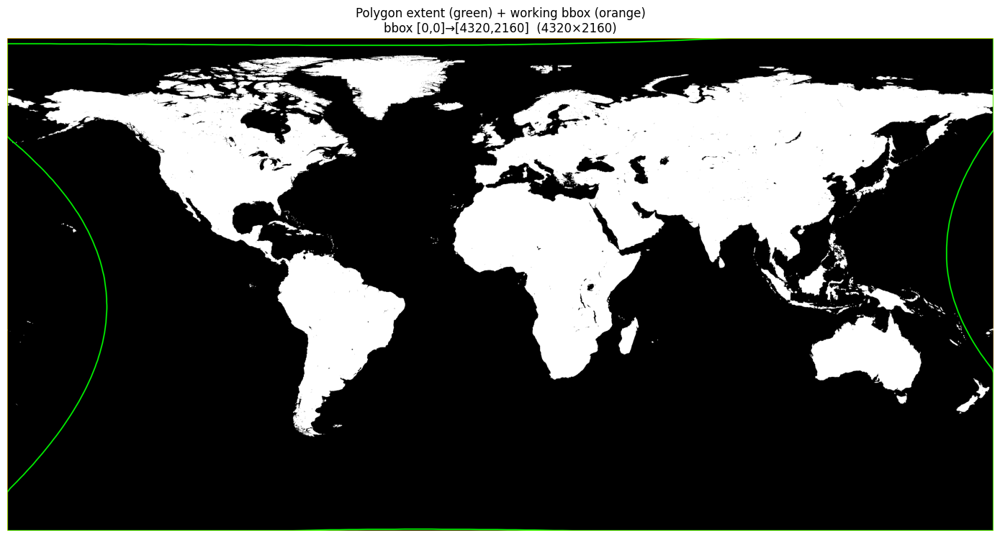


▸ Phase 1: Generating land masks …


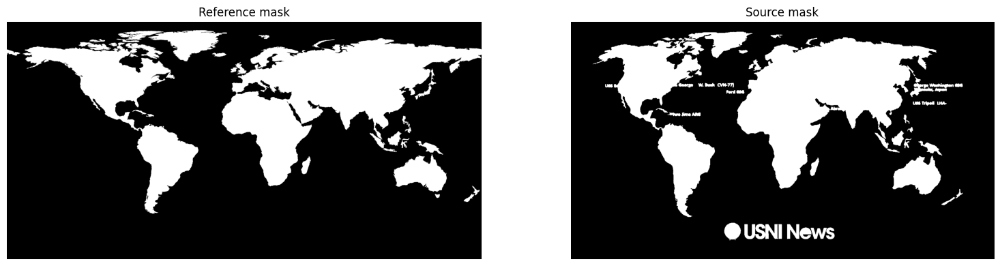

  Bbox working resolution: 768×384

▸ Phase 2: Initialising displacement from polynomial warp …
    ✓ Initialised displacement from inverse polynomial (‖disp‖ mean=0.0465)
    Initial IoU (in polygon): 0.6525


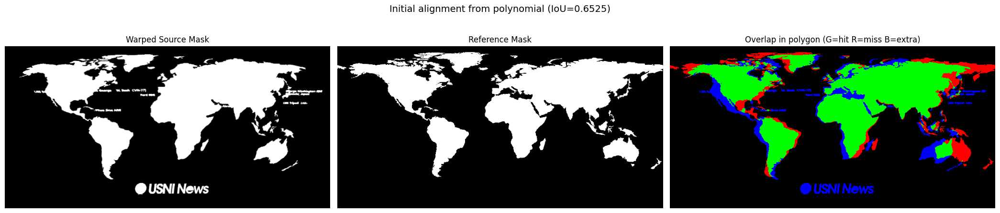


▸ Phase 3: Polygon-Constrained Coarse-to-Fine Optimisation …
  Cell sizes (px): [48, 24, 12, 6, 4, 2]  →  finest mesh = 384×192

  ── Level 1  cell=48px  mesh 16×8  steps=600  lr=0.005  λ_bend=0.5  λ_res=0.0  σ_proj=2.0
     Bending weights  min=1.00  max=1.00  mean=1.00
     step     0  loss=0.34717  dice=0.2265  bend=0.0001  IoU(poly)=0.6642
     step   300  loss=0.29979  dice=0.1950  bend=0.0002  IoU(poly)=0.6772
     step   599  loss=0.28352  dice=0.1844  bend=0.0002  IoU(poly)=0.6729


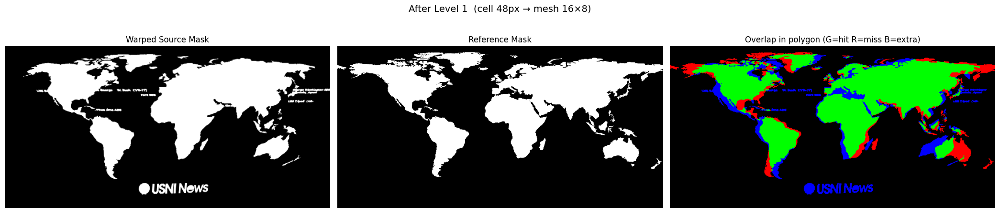

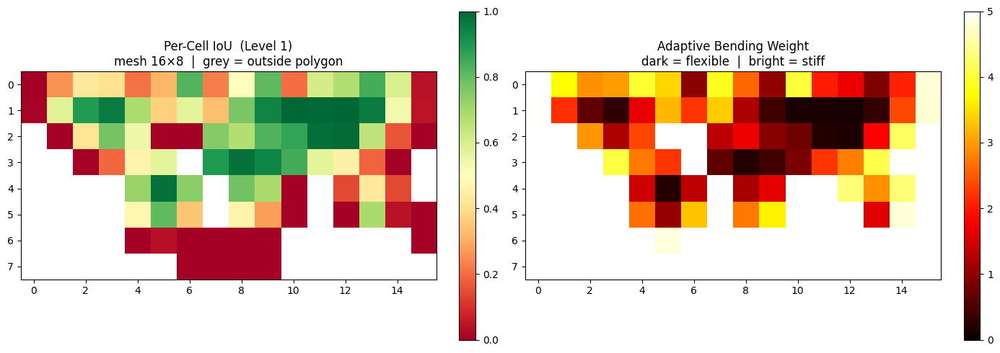

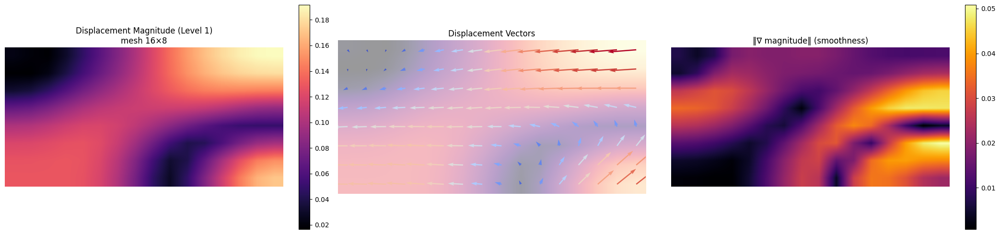

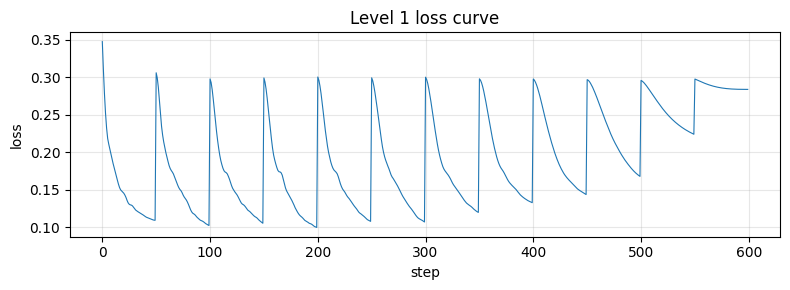


  ── Level 2  cell=24px  mesh 32×16  steps=600  lr=0.003  λ_bend=1.0  λ_res=0.01  σ_proj=1.5
     Bending weights  min=0.13  max=5.00  mean=3.43
     step     0  loss=0.30743  dice=0.2000  bend=0.0000  IoU(poly)=0.6927
     step   300  loss=0.22421  dice=0.1454  bend=0.0002  IoU(poly)=0.7500
     step   599  loss=0.24887  dice=0.1616  bend=0.0001  IoU(poly)=0.6978


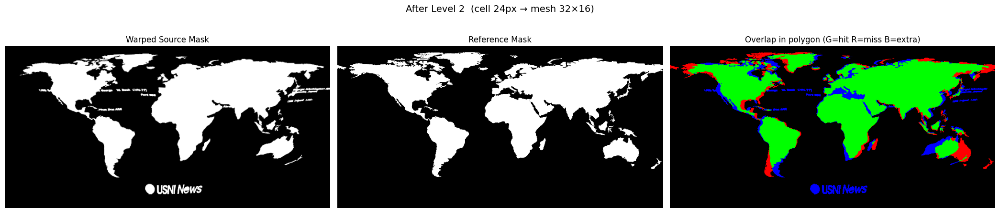

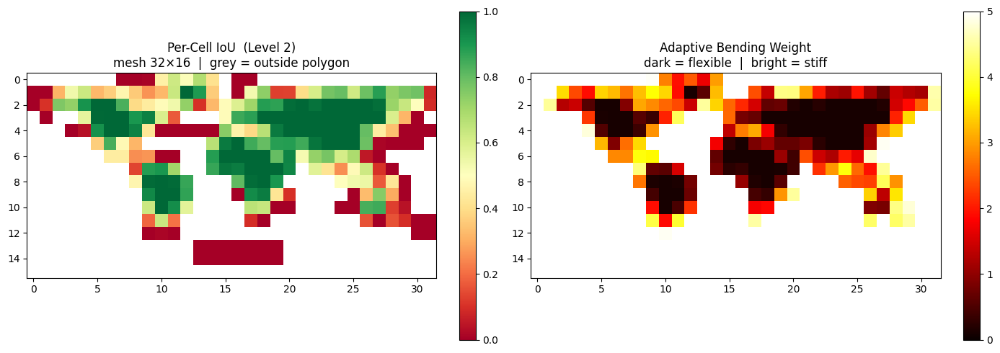

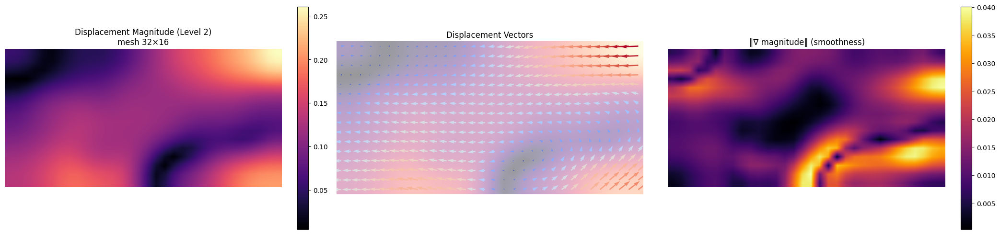

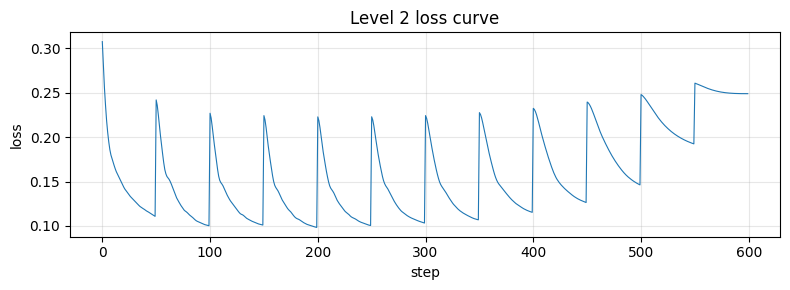


  ── Level 3  cell=12px  mesh 64×32  steps=600  lr=0.0015  λ_bend=2.0  λ_res=0.03  σ_proj=1.0
     Bending weights  min=0.10  max=5.00  mean=3.64
     step     0  loss=0.23463  dice=0.1524  bend=0.0000  IoU(poly)=0.7559
     step   300  loss=0.14146  dice=0.0907  bend=0.0001  IoU(poly)=0.8395
     step   599  loss=0.15751  dice=0.1016  bend=0.0001  IoU(poly)=0.7940


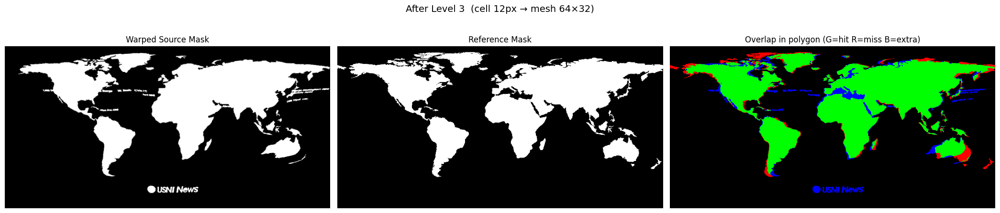

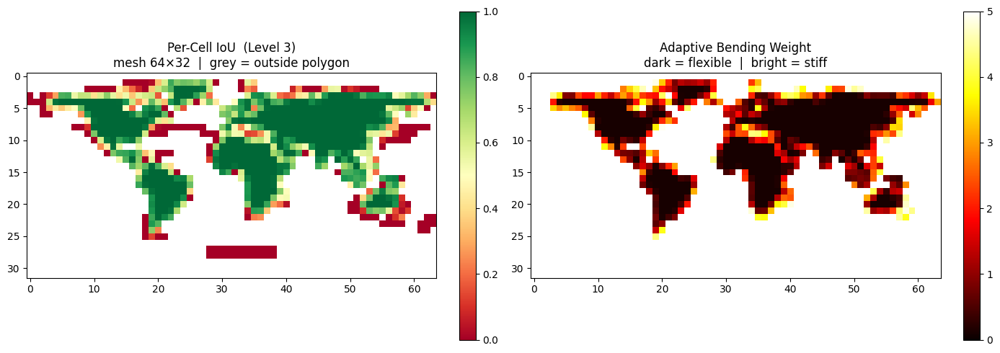

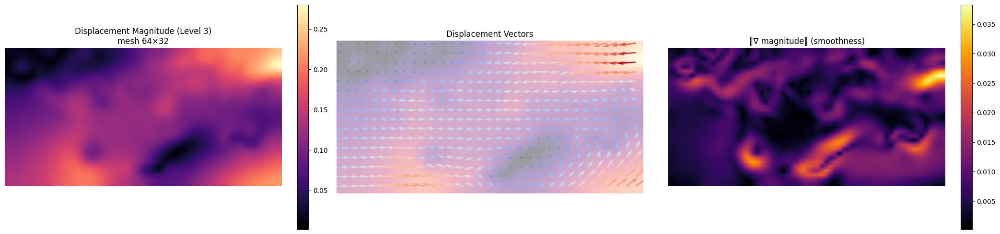

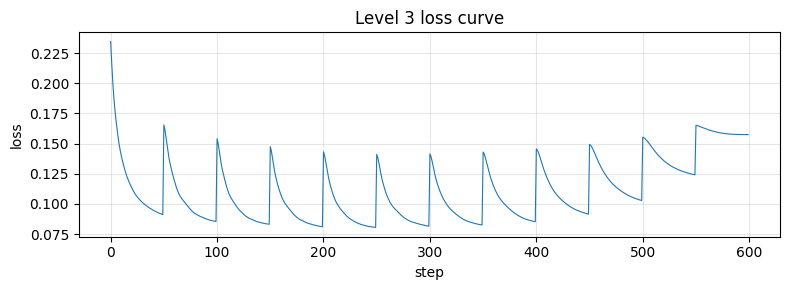


  ── Level 4  cell=6px  mesh 128×64  steps=600  lr=0.0008  λ_bend=6.0  λ_res=0.08  σ_proj=0.6
     Bending weights  min=0.10  max=5.00  mean=3.69
     step     0  loss=0.14864  dice=0.0956  bend=0.0000  IoU(poly)=0.8419
     step   300  loss=0.08480  dice=0.0523  bend=0.0001  IoU(poly)=0.9073
     step   599  loss=0.09062  dice=0.0565  bend=0.0001  IoU(poly)=0.8828


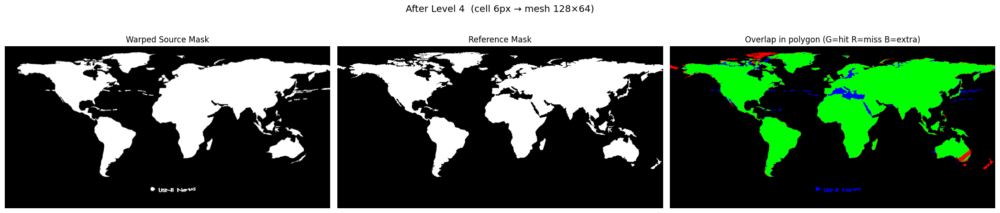

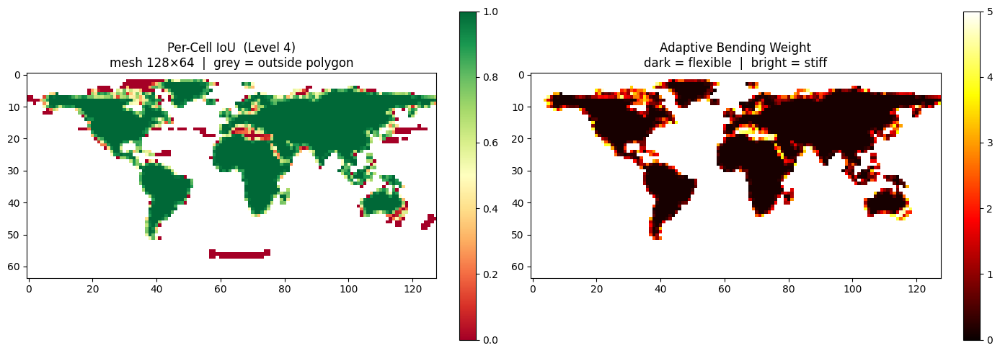

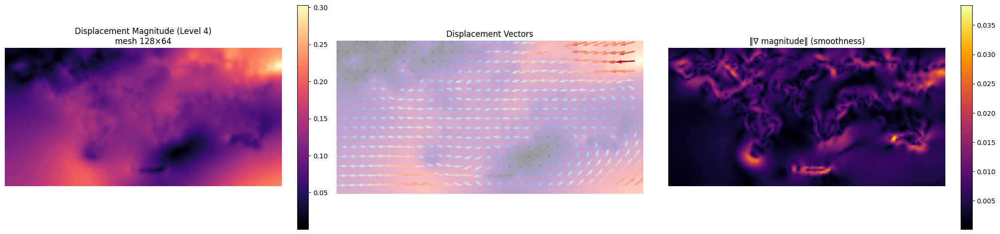

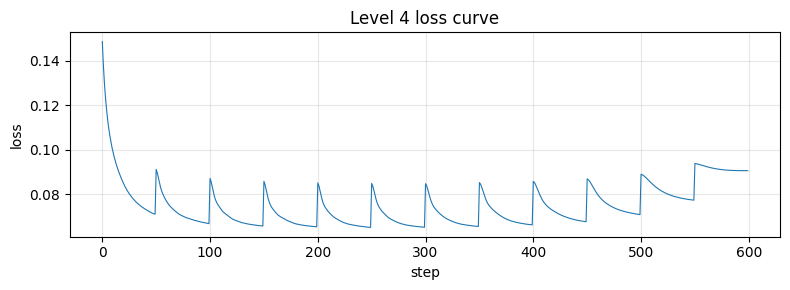


  ── Level 5  cell=4px  mesh 192×96  steps=800  lr=0.0003  λ_bend=15.0  λ_res=0.2  σ_proj=0.35
     Bending weights  min=0.10  max=5.00  mean=3.73
     step     0  loss=0.08518  dice=0.0528  bend=0.0000  IoU(poly)=0.9099
     step   300  loss=0.05814  dice=0.0326  bend=0.0002  IoU(poly)=0.9456
     step   600  loss=0.05785  dice=0.0324  bend=0.0002  IoU(poly)=0.9459
     step   799  loss=0.05804  dice=0.0327  bend=0.0001  IoU(poly)=0.9438


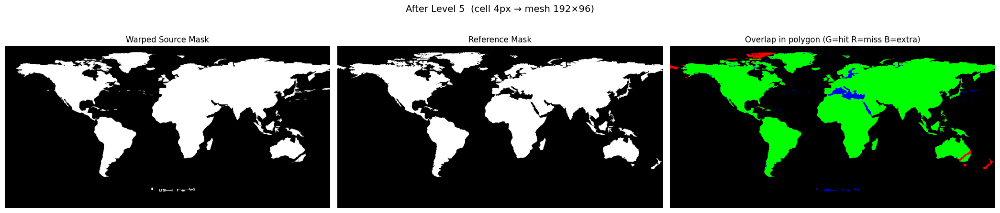

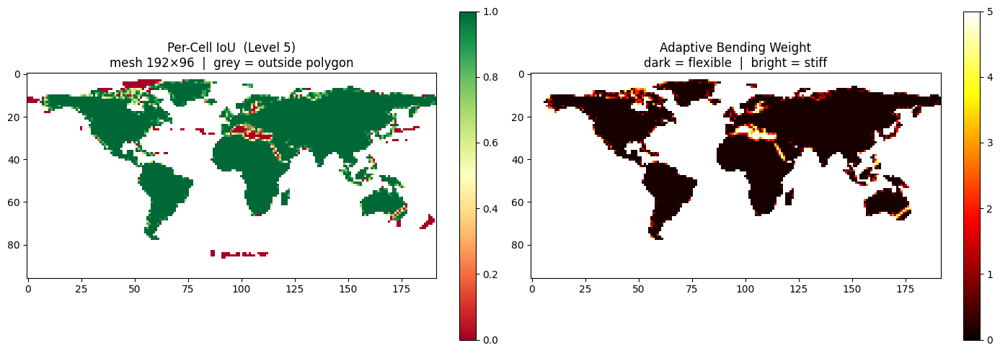

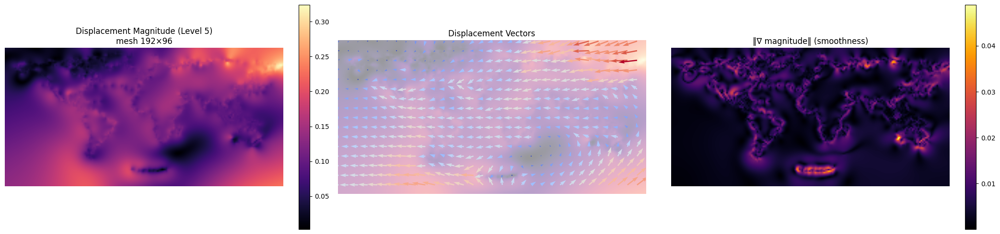

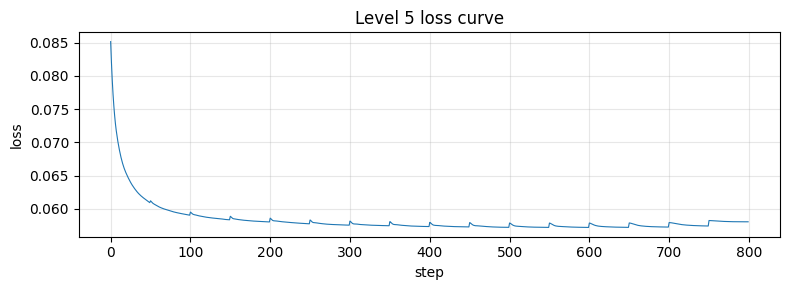


  ── Level 6  cell=2px  mesh 384×192  steps=800  lr=0.0001  λ_bend=40.0  λ_res=0.4  σ_proj=0.2
     Bending weights  min=0.10  max=5.00  mean=3.71
     step     0  loss=0.05641  dice=0.0327  bend=0.0000  IoU(poly)=0.9463
     step   300  loss=0.04817  dice=0.0257  bend=0.0000  IoU(poly)=0.9550
     step   600  loss=0.04795  dice=0.0255  bend=0.0000  IoU(poly)=0.9552
     step   799  loss=0.04793  dice=0.0255  bend=0.0000  IoU(poly)=0.9552


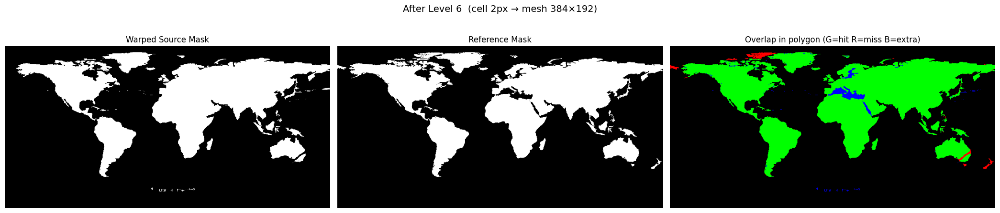

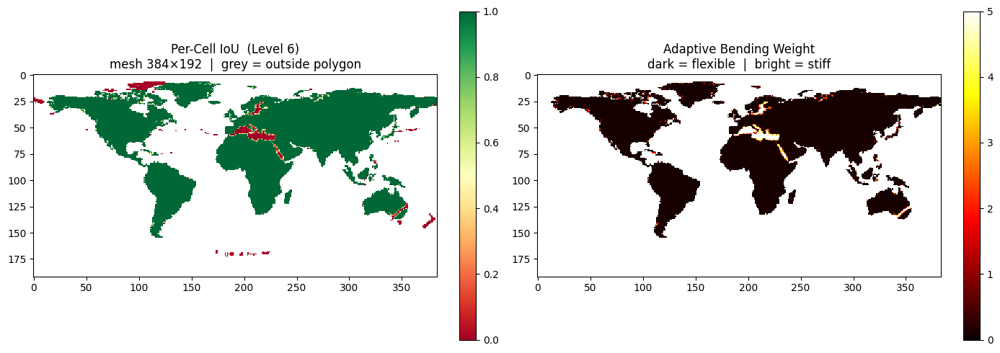

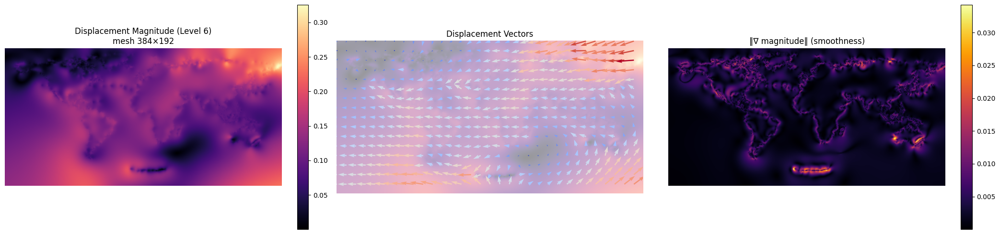

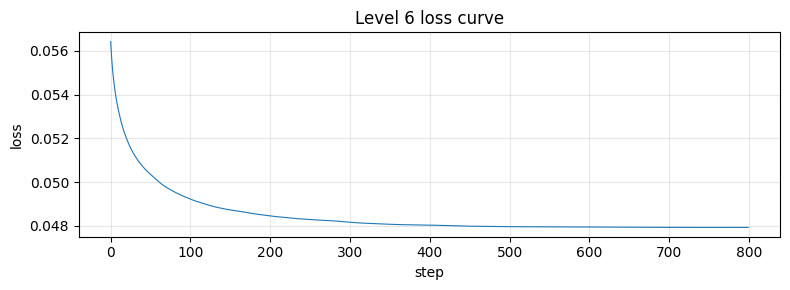


▸ Phase 4: Applying warp at full resolution within bbox …
  Final full-resolution polygon IoU: 0.9357
  Output size: 4320×2160

▸ Phase 5: Visualisation …


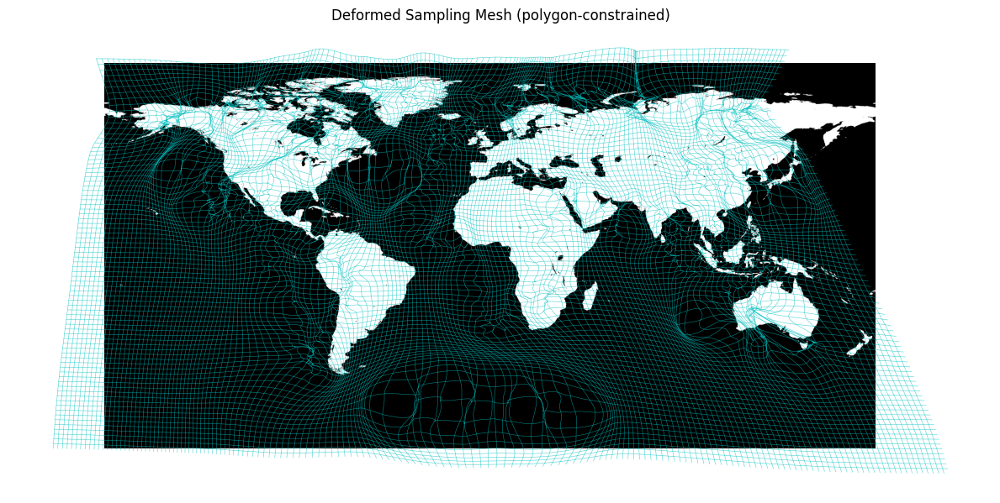

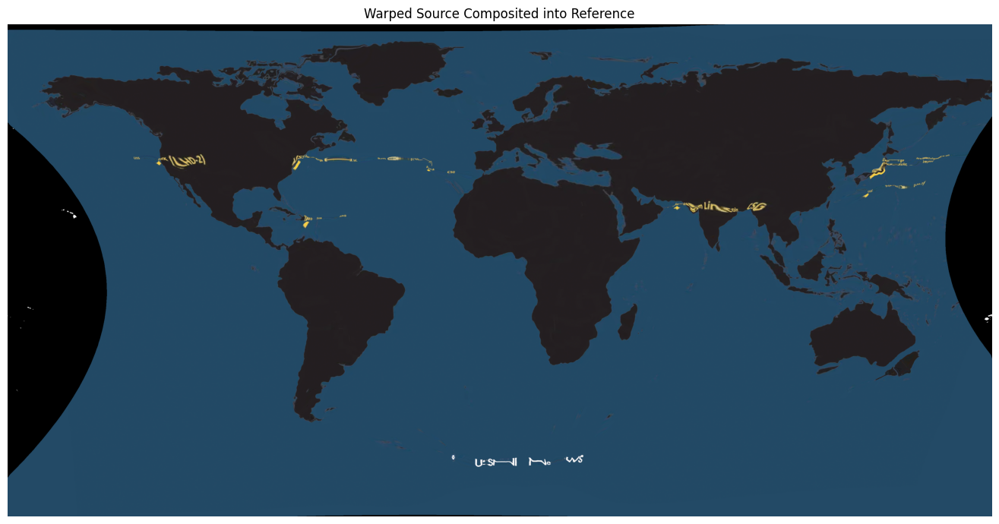

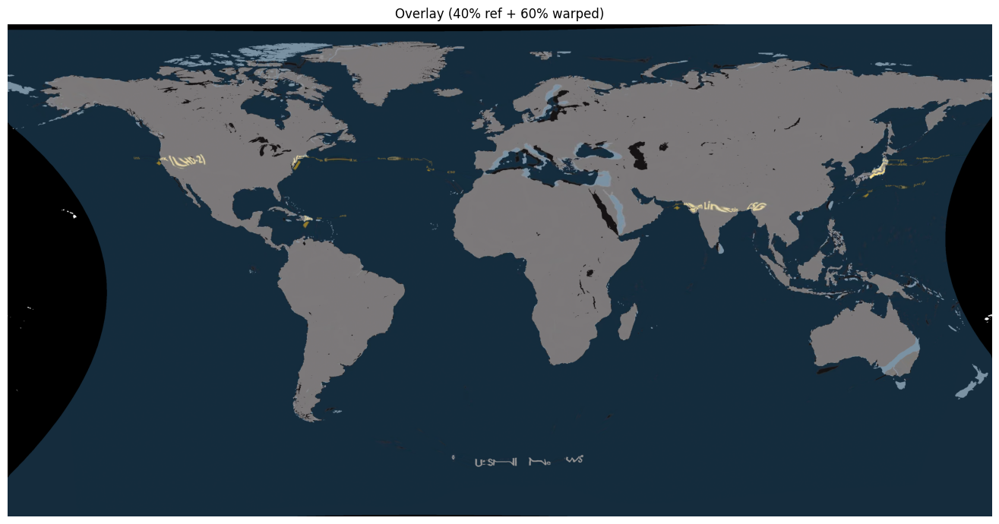

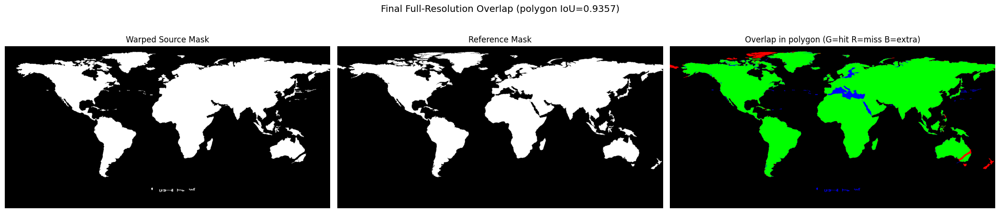

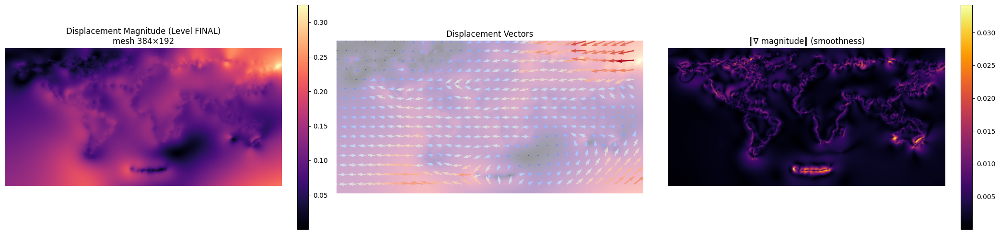

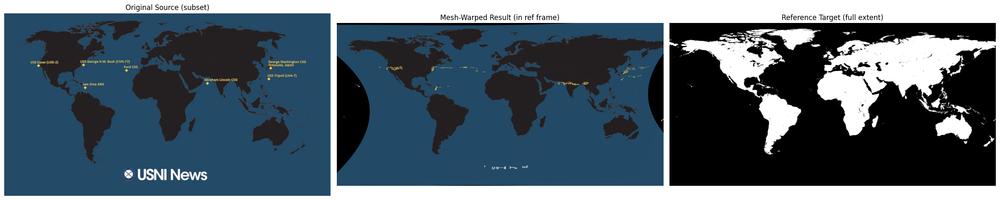

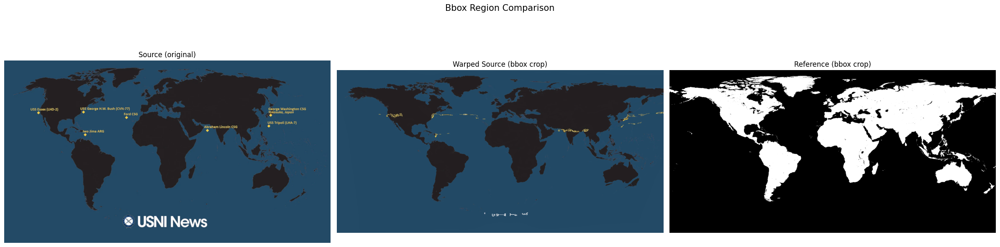

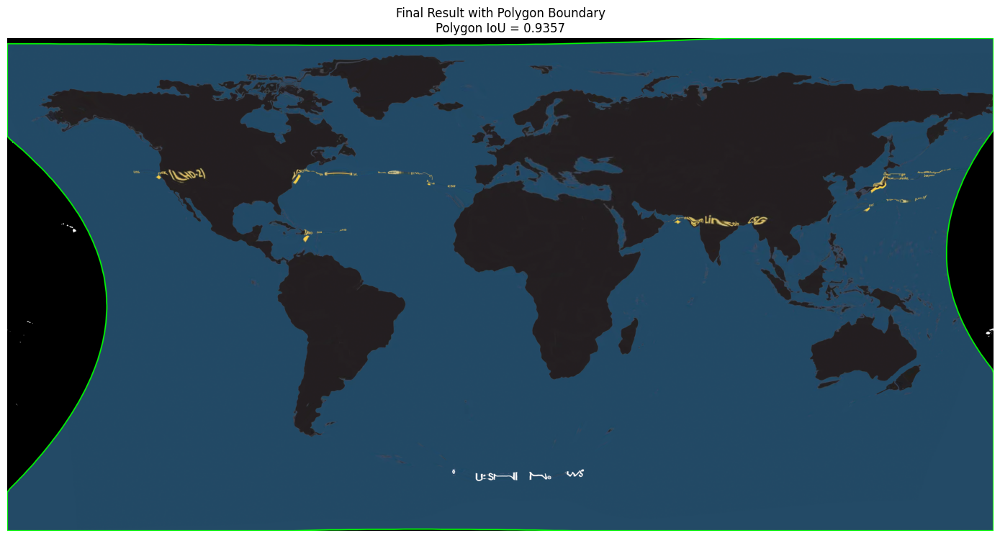


✓ Done.


In [50]:
# ═══════════════════════════════════════════════════════════════════
#  POLYGON-CONSTRAINED MESH WARP v1
#  ─────────────────────────────────────────────────────────────────
#  Consumes the ExtentResult from Map Extent Finder and performs
#  fine-grained coarse-to-fine mesh deformation WITHIN the
#  detected polygon, then composites the warped source onto
#  the reference image.
#
#  Key differences from the bbox-only version:
#    • Bounding region derived from the extent polygon (+ padding)
#    • All data-fidelity losses (Dice, MSE) masked to polygon interior
#    • IoU evaluated only inside the polygon
#    • Displacement field warm-started from the inverse polynomial warp
#    • Adaptive bending weights respect polygon boundary
# ═══════════════════════════════════════════════════════════════════

import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from typing import Tuple, Optional, Dict

# ── Assumes the first script has already been executed in the same
#    runtime so that these are available:
#      extract_land_mask, get_sea_color,
#      fit_polynomial_warp, apply_polynomial_warp,
#      _n_poly_coeffs, ExtentResult
# ─────────────────────────────────────────────────────────────────


# ═══════════════════════════════════════════════════════════════════
#  1. GAUSSIAN SMOOTHING
# ═══════════════════════════════════════════════════════════════════


def gaussian_blur_2d(tensor: torch.Tensor, sigma: float) -> torch.Tensor:
    if sigma < 0.1:
        return tensor

    H, W = tensor.shape[2], tensor.shape[3]
    ks = max(3, int(6 * sigma) | 1)

    max_ks = min(H, W)
    if max_ks < 3:
        return tensor
    if ks > max_ks:
        ks = max_ks if max_ks % 2 == 1 else max_ks - 1
    if ks < 3:
        return tensor

    ax = torch.arange(
        -(ks // 2), ks // 2 + 1,
        dtype=tensor.dtype, device=tensor.device,
    )
    kernel_1d = torch.exp(-0.5 * (ax / sigma) ** 2)
    kernel_1d = kernel_1d / kernel_1d.sum()

    C = tensor.shape[1]
    kh = kernel_1d.view(1, 1, 1, -1).expand(C, -1, -1, -1)
    kv = kernel_1d.view(1, 1, -1, 1).expand(C, -1, -1, -1)
    pad = ks // 2

    out = F.conv2d(
        F.pad(tensor, [pad, pad, 0, 0], mode="reflect"), kh, groups=C,
    )
    out = F.conv2d(
        F.pad(out, [0, 0, pad, pad], mode="reflect"), kv, groups=C,
    )
    return out


# ═══════════════════════════════════════════════════════════════════
#  2. LOSS FUNCTIONS — POLYGON-MASKED VARIANTS
# ═══════════════════════════════════════════════════════════════════


def masked_dice_loss(
    pred: torch.Tensor,
    target: torch.Tensor,
    mask: torch.Tensor,
    smooth: float = 1.0,
) -> torch.Tensor:
    """Dice loss computed only inside the polygon mask."""
    p = (pred * mask).view(-1)
    t = (target * mask).view(-1)
    inter = (p * t).sum()
    return 1.0 - (2.0 * inter + smooth) / (
        p.sum() + t.sum() + smooth
    )


def masked_mse_loss(
    pred: torch.Tensor,
    target: torch.Tensor,
    mask: torch.Tensor,
) -> torch.Tensor:
    """MSE loss computed only inside the polygon mask."""
    diff = (pred - target) ** 2 * mask
    n = mask.sum().clamp(min=1.0)
    return diff.sum() / n


def bending_energy_loss(
    disp: torch.Tensor, weight_map: Optional[torch.Tensor] = None
) -> torch.Tensor:
    d2x = disp[:, :, :, 2:] - 2 * disp[:, :, :, 1:-1] + disp[:, :, :, :-2]
    d2y = disp[:, :, 2:, :] - 2 * disp[:, :, 1:-1, :] + disp[:, :, :-2, :]
    dxy = (
        disp[:, :, 1:, 1:]
        - disp[:, :, 1:, :-1]
        - disp[:, :, :-1, 1:]
        + disp[:, :, :-1, :-1]
    )
    if weight_map is not None:
        wx = weight_map[:, :, :, 1:-1]
        wy = weight_map[:, :, 1:-1, :]
        wxy = (
            weight_map[:, :, 1:, 1:]
            + weight_map[:, :, 1:, :-1]
            + weight_map[:, :, :-1, 1:]
            + weight_map[:, :, :-1, :-1]
        ) / 4.0
        return (
            (wx * d2x.pow(2)).mean()
            + (wy * d2y.pow(2)).mean()
            + 2.0 * (wxy * dxy.pow(2)).mean()
        )
    return d2x.pow(2).mean() + d2y.pow(2).mean() + 2.0 * dxy.pow(2).mean()


def fold_loss(grid: torch.Tensor) -> torch.Tensor:
    dg_dc_x = grid[:, :, 1:, 0] - grid[:, :, :-1, 0]
    dg_dc_y = grid[:, :, 1:, 1] - grid[:, :, :-1, 1]
    dg_dr_x = grid[:, 1:, :, 0] - grid[:, :-1, :, 0]
    dg_dr_y = grid[:, 1:, :, 1] - grid[:, :-1, :, 1]
    dg_dc_x = dg_dc_x[:, :-1, :]
    dg_dc_y = dg_dc_y[:, :-1, :]
    dg_dr_x = dg_dr_x[:, :, :-1]
    dg_dr_y = dg_dr_y[:, :, :-1]
    det = dg_dc_x * dg_dr_y - dg_dc_y * dg_dr_x
    return F.relu(-det + 0.05).mean()


def jacobian_regularity_loss(grid: torch.Tensor) -> torch.Tensor:
    dg_dc_x = grid[:, :, 1:, 0] - grid[:, :, :-1, 0]
    dg_dc_y = grid[:, :, 1:, 1] - grid[:, :, :-1, 1]
    dg_dr_x = grid[:, 1:, :, 0] - grid[:, :-1, :, 0]
    dg_dr_y = grid[:, 1:, :, 1] - grid[:, :-1, :, 1]
    dg_dc_x = dg_dc_x[:, :-1, :]
    dg_dc_y = dg_dc_y[:, :-1, :]
    dg_dr_x = dg_dr_x[:, :, :-1]
    dg_dr_y = dg_dr_y[:, :, :-1]
    det = dg_dc_x * dg_dr_y - dg_dc_y * dg_dr_x
    mean_det = det.mean().detach()
    return (det - mean_det).pow(2).mean()


# ═══════════════════════════════════════════════════════════════════
#  3. WARP HELPERS
# ═══════════════════════════════════════════════════════════════════


def make_identity_grid(
    h: int, w: int, device: torch.device
) -> torch.Tensor:
    yy = torch.linspace(-1, 1, h, device=device)
    xx = torch.linspace(-1, 1, w, device=device)
    gy, gx = torch.meshgrid(yy, xx, indexing="ij")
    return torch.stack([gx, gy], dim=-1).unsqueeze(0)


def warp(
    src: torch.Tensor,
    disp: torch.Tensor,
    out_h: int,
    out_w: int,
) -> Tuple[torch.Tensor, torch.Tensor]:
    device = src.device
    disp_full = F.interpolate(
        disp, size=(out_h, out_w), mode="bicubic", align_corners=True,
    )
    identity = make_identity_grid(out_h, out_w, device)
    grid = identity.clone()
    grid[..., 0] = grid[..., 0] + disp_full[:, 0]
    grid[..., 1] = grid[..., 1] + disp_full[:, 1]
    warped = F.grid_sample(
        src, grid, mode="bilinear", padding_mode="border",
        align_corners=True,
    )
    return warped, grid


# ═══════════════════════════════════════════════════════════════════
#  4. POLYGON HELPERS
# ═══════════════════════════════════════════════════════════════════


def polygon_to_padded_bbox(
    polygon: np.ndarray,
    img_shape: Tuple[int, ...],
    margin_frac: float = 0.05,
) -> Dict[str, int]:
    """
    Compute an axis-aligned bounding box from the polygon with
    fractional margin, clamped to image bounds.
    """
    rh, rw = img_shape[:2]
    x_min, y_min = polygon.min(axis=0)
    x_max, y_max = polygon.max(axis=0)
    pw = x_max - x_min
    ph = y_max - y_min
    mx = pw * margin_frac
    my = ph * margin_frac
    x0 = max(0, int(np.floor(x_min - mx)))
    y0 = max(0, int(np.floor(y_min - my)))
    x1 = min(rw, int(np.ceil(x_max + mx)))
    y1 = min(rh, int(np.ceil(y_max + my)))
    return {"x0": x0, "y0": y0, "x1": x1, "y1": y1}


def create_polygon_mask(
    polygon: np.ndarray, shape: Tuple[int, ...]
) -> np.ndarray:
    """
    Rasterise the polygon into a uint8 mask (0 / 255) at the
    given (H, W, ...) resolution.
    """
    mask = np.zeros((shape[0], shape[1]), dtype=np.uint8)
    pts = polygon.astype(np.int32).reshape((-1, 1, 2))
    cv2.fillPoly(mask, [pts], 255)
    return mask


def create_polygon_mask_in_bbox(
    polygon: np.ndarray, bbox: Dict[str, int]
) -> np.ndarray:
    """
    Rasterise the polygon into a mask whose coordinate origin
    is the top-left corner of the bbox.  Result shape = (bh, bw).
    """
    bx0, by0 = bbox["x0"], bbox["y0"]
    bw = bbox["x1"] - bx0
    bh = bbox["y1"] - by0
    shifted = polygon.copy()
    shifted[:, 0] -= bx0
    shifted[:, 1] -= by0
    mask = np.zeros((bh, bw), dtype=np.uint8)
    pts = shifted.astype(np.int32).reshape((-1, 1, 2))
    cv2.fillPoly(mask, [pts], 255)
    return mask


# ═══════════════════════════════════════════════════════════════════
#  5. DISPLACEMENT INITIALISATION FROM INVERSE POLYNOMIAL WARP
# ═══════════════════════════════════════════════════════════════════


def fit_reverse_polynomial(
    extent_result: "ExtentResult", degree: int = 2
) -> Optional[dict]:
    """
    Fit a polynomial that maps reference points → source points,
    i.e. the inverse of the forward warp stored in the ExtentResult.
    """
    if (
        extent_result.ref_pts is None
        or extent_result.src_pts is None
        or len(extent_result.ref_pts) < _n_poly_coeffs(degree) + 2
    ):
        return None
    return fit_polynomial_warp(
        extent_result.ref_pts,
        extent_result.src_pts,
        degree=degree,
    )


def initialize_displacement(
    extent_result: "ExtentResult",
    src_shape: Tuple[int, ...],
    bbox: Dict[str, int],
    mh: int,
    mw: int,
    device: torch.device,
) -> torch.Tensor:
    """
    Build an initial displacement field (1, 2, mh, mw) that encodes
    the inverse polynomial mapping.

    For every mesh node at normalised position (nx, ny) in the output
    (bbox) space we:
      1. Convert to reference-pixel coordinates.
      2. Apply the reverse polynomial to get source-pixel coordinates.
      3. Convert source-pixels to normalised [-1, 1] w.r.t. the full
         source image.
      4. displacement = source_normalised − identity_normalised.
    """
    reverse_warp = fit_reverse_polynomial(extent_result)
    if reverse_warp is None:
        print("    ⚠ Could not fit reverse polynomial — "
              "using zero initialisation")
        return torch.zeros(1, 2, mh, mw, device=device)

    bx0, by0 = bbox["x0"], bbox["y0"]
    bw = bbox["x1"] - bx0
    bh = bbox["y1"] - by0
    sh, sw = src_shape[:2]

    # Normalised mesh coordinates
    nx = np.linspace(-1, 1, mw)
    ny = np.linspace(-1, 1, mh)
    gx, gy = np.meshgrid(nx, ny)  # both (mh, mw)

    # → reference pixel coordinates
    ref_px_x = bx0 + (gx + 1) / 2.0 * bw
    ref_px_y = by0 + (gy + 1) / 2.0 * bh
    ref_pts = np.stack(
        [ref_px_x.ravel(), ref_px_y.ravel()], axis=1
    )  # (mh*mw, 2)

    # → source pixel coordinates via inverse polynomial
    src_pts = apply_polynomial_warp(ref_pts, reverse_warp)

    # → normalised source coordinates [-1, 1]
    src_norm_x = (2.0 * src_pts[:, 0] / sw - 1.0).reshape(mh, mw)
    src_norm_y = (2.0 * src_pts[:, 1] / sh - 1.0).reshape(mh, mw)

    disp_x = src_norm_x - gx  # (mh, mw)
    disp_y = src_norm_y - gy

    disp = np.stack([disp_x, disp_y], axis=0)[None]  # (1,2,mh,mw)
    disp_t = torch.from_numpy(disp).float().to(device)

    # Light smoothing to suppress any polynomial ringing at edges
    disp_t = gaussian_blur_2d(disp_t, sigma=1.5)

    print(f"    ✓ Initialised displacement from inverse polynomial "
          f"(‖disp‖ mean={disp_t.abs().mean():.4f})")
    return disp_t


# ═══════════════════════════════════════════════════════════════════
#  6. POLYGON-AWARE PER-CELL IoU & ADAPTIVE WEIGHTS
# ═══════════════════════════════════════════════════════════════════


def compute_cell_iou_masked(
    warped_mask: torch.Tensor,
    ref_mask: torch.Tensor,
    poly_mask_t: torch.Tensor,
    mh: int,
    mw: int,
) -> torch.Tensor:
    """
    Per-cell IoU evaluated only within the polygon mask.
    Cells with no polygon coverage receive −1.
    """
    _, _, H, W = warped_mask.shape
    cell_h = H // mh
    cell_w = W // mw
    iou_map = torch.full((mh, mw), -1.0)

    for i in range(mh):
        for j in range(mw):
            r0 = i * cell_h
            r1 = (i + 1) * cell_h if i < mh - 1 else H
            c0 = j * cell_w
            c1 = (j + 1) * cell_w if j < mw - 1 else W

            pm = poly_mask_t[0, 0, r0:r1, c0:c1] > 0.5
            if pm.sum() < 1:
                continue  # no polygon coverage → skip

            w_cell = (warped_mask[0, 0, r0:r1, c0:c1] > 0.5) & pm
            r_cell = (ref_mask[0, 0, r0:r1, c0:c1] > 0.5) & pm

            union = (w_cell | r_cell).sum().float()
            if union < 1.0:
                continue
            inter = (w_cell & r_cell).sum().float()
            iou_map[i, j] = (inter / union).item()

    return iou_map


def iou_to_bend_weights(
    cell_iou: torch.Tensor,
    high_w: float = 5.0,
    low_w: float = 0.1,
) -> torch.Tensor:
    """
    High bending weight where IoU is low (or outside polygon),
    low weight where IoU is already good.
    """
    weights = torch.full_like(cell_iou, high_w)
    relevant = cell_iou >= 0.0
    weights[relevant] = high_w - (high_w - low_w) * cell_iou[relevant]
    return weights


def compute_polygon_iou(
    warped_mask: torch.Tensor,
    ref_mask: torch.Tensor,
    poly_mask_t: torch.Tensor,
) -> float:
    """Global IoU restricted to the interior of the polygon."""
    pm = poly_mask_t > 0.5
    w = (warped_mask > 0.5) & pm
    r = (ref_mask > 0.5) & pm
    inter = (w & r).sum().float()
    union = (w | r).sum().float()
    return (inter / union.clamp(min=1)).item()


# ═══════════════════════════════════════════════════════════════════
#  7. VISUALISATION HELPERS
# ═══════════════════════════════════════════════════════════════════


def show_mask_comparison(warped_mask, ref_mask, poly_mask_t=None, title=""):
    wm = warped_mask[0, 0].cpu().numpy()
    rm = ref_mask[0, 0].cpu().numpy()
    fig, axes = plt.subplots(1, 3, figsize=(21, 5))
    axes[0].imshow(wm, cmap="gray")
    axes[0].set_title("Warped Source Mask")
    axes[1].imshow(rm, cmap="gray")
    axes[1].set_title("Reference Mask")

    rgb = np.zeros((*rm.shape, 3))
    if poly_mask_t is not None:
        pm = poly_mask_t[0, 0].cpu().numpy() > 0.5
    else:
        pm = np.ones_like(rm, dtype=bool)
    rgb[..., 1] = (wm > 0.5) & (rm > 0.5) & pm   # green  = hit
    rgb[..., 0] = (rm > 0.5) & (wm <= 0.5) & pm   # red    = miss
    rgb[..., 2] = (wm > 0.5) & (rm <= 0.5) & pm   # blue   = extra

    axes[2].imshow(rgb)
    axes[2].set_title("Overlap in polygon (G=hit R=miss B=extra)")
    for ax in axes:
        ax.axis("off")
    if title:
        fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


def show_mesh(grid_tensor, ref_img_np, step=8, title="Mesh"):
    g = grid_tensor[0].cpu().numpy()
    h, w = g.shape[:2]
    gx = (g[..., 0] + 1) / 2 * w
    gy = (g[..., 1] + 1) / 2 * h
    fig, ax = plt.subplots(figsize=(12, 7))
    ax.imshow(ref_img_np)
    for r in range(0, h, step):
        ax.plot(gx[r, :], gy[r, :], "c-", lw=0.4, alpha=0.7)
    for c in range(0, w, step):
        ax.plot(gx[:, c], gy[:, c], "c-", lw=0.4, alpha=0.7)
    ax.set_title(title)
    ax.axis("off")
    plt.tight_layout()
    plt.show()


def show_adaptive_maps(cell_iou, bend_weights, lvl, mh, mw):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    iou_display = cell_iou.cpu().numpy().copy()
    iou_display[iou_display < 0] = np.nan
    im0 = axes[0].imshow(
        iou_display, cmap="RdYlGn", vmin=0, vmax=1,
        interpolation="nearest",
    )
    axes[0].set_title(
        f"Per-Cell IoU  (Level {lvl})\n"
        f"mesh {mw}×{mh}  |  grey = outside polygon"
    )
    plt.colorbar(im0, ax=axes[0], fraction=0.046)
    im1 = axes[1].imshow(
        bend_weights.cpu().numpy(), cmap="hot", vmin=0,
        interpolation="nearest",
    )
    axes[1].set_title(
        "Adaptive Bending Weight\n"
        "dark = flexible  |  bright = stiff"
    )
    plt.colorbar(im1, ax=axes[1], fraction=0.046)
    for ax in axes:
        ax.set_aspect("equal")
    plt.tight_layout()
    plt.show()


def show_displacement_field(total_disp, lvl, mh, mw):
    d = total_disp[0].cpu().numpy()
    mag = np.sqrt(d[0] ** 2 + d[1] ** 2)
    grad_y = np.gradient(mag, axis=0)
    grad_x = np.gradient(mag, axis=1)
    grad_mag = np.sqrt(grad_y**2 + grad_x**2)

    fig, axes = plt.subplots(1, 3, figsize=(21, 5))
    im0 = axes[0].imshow(mag, cmap="magma", interpolation="bilinear")
    axes[0].set_title(f"Displacement Magnitude (Level {lvl})\nmesh {mw}×{mh}")
    plt.colorbar(im0, ax=axes[0], fraction=0.046)

    step_q = max(1, min(mh, mw) // 16)
    yy = np.arange(0, mh, step_q)
    xx = np.arange(0, mw, step_q)
    Y, X = np.meshgrid(yy, xx, indexing="ij")
    U = d[0][::step_q, ::step_q]
    V = d[1][::step_q, ::step_q]
    axes[1].imshow(mag, cmap="magma", interpolation="bilinear", alpha=0.4)
    axes[1].quiver(
        X, Y, U, V, mag[::step_q, ::step_q],
        cmap="coolwarm", scale=None, width=0.004,
    )
    axes[1].set_title("Displacement Vectors")

    im2 = axes[2].imshow(grad_mag, cmap="inferno", interpolation="bilinear")
    axes[2].set_title("‖∇ magnitude‖ (smoothness)")
    plt.colorbar(im2, ax=axes[2], fraction=0.046)

    for ax in axes:
        ax.set_aspect("equal")
        ax.axis("off")
    plt.tight_layout()
    plt.show()


def show_polygon_on_reference(ref_img, polygon, bbox, title=""):
    vis = ref_img.copy()
    if len(vis.shape) == 2:
        vis = cv2.cvtColor(vis, cv2.COLOR_GRAY2BGR)
    pts = polygon.astype(np.int32).reshape((-1, 1, 2))
    cv2.polylines(vis, [pts], True, (0, 255, 0), 3, cv2.LINE_AA)
    bx0, by0, bx1, by1 = bbox["x0"], bbox["y0"], bbox["x1"], bbox["y1"]
    cv2.rectangle(vis, (bx0, by0), (bx1, by1), (0, 200, 255), 2)
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.set_title(
        title or f"Polygon extent (green) + working bbox (orange)\n"
        f"bbox [{bx0},{by0}]→[{bx1},{by1}]  "
        f"({bx1 - bx0}×{by1 - by0})"
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()


# ═══════════════════════════════════════════════════════════════════
#  8. MAIN: POLYGON-CONSTRAINED COARSE-TO-FINE MESH WARP
# ═══════════════════════════════════════════════════════════════════


def polygon_constrained_mesh_warp(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    extent_result: "ExtentResult",
    mask_threshold: int = 35,
    bbox_margin_frac: float = 0.05,
    work_h_bbox: int = 384,
    verbose: bool = True,
) -> Tuple[np.ndarray, torch.Tensor, Dict[str, int]]:
    """
    Warp `src_img` (a subset) onto `ref_img` (the full map) using
    a polygon-constrained coarse-to-fine mesh deformation.

    Parameters
    ----------
    ref_img        : BGR reference image (full map).
    src_img        : BGR source image (subset).
    extent_result  : ExtentResult from find_extent().
    mask_threshold : land-mask binarisation threshold.
    bbox_margin_frac : fractional padding around polygon bbox.
    work_h_bbox    : working height for the bbox crop (px).
    verbose        : chattiness.

    Returns
    -------
    canvas_bgr     : ref_img-sized BGR image with warped source
                     composited inside the polygon.
    learned_disp   : final displacement tensor (1, 2, mh, mw).
    bbox           : working bounding box dict.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    if verbose:
        print(f"Device: {device}\n")

    if extent_result.polygon is None:
        raise ValueError(
            "ExtentResult has no polygon — cannot constrain warp."
        )

    polygon = extent_result.polygon  # (N, 2) float, ref-pixel coords

    h_r, w_r = ref_img.shape[:2]
    h_s, w_s = src_img.shape[:2]

    if verbose:
        print(f"Reference : {w_r}×{h_r}")
        print(f"Source    : {w_s}×{h_s}")
        print(f"Polygon   : {polygon.shape[0]} vertices, "
              f"confidence={extent_result.confidence:.3f}")

    # ── 1. Polygon → padded bbox ─────────────────────────────────
    bbox = polygon_to_padded_bbox(polygon, ref_img.shape, bbox_margin_frac)
    bx0, by0, bx1, by1 = bbox["x0"], bbox["y0"], bbox["x1"], bbox["y1"]
    bw = bx1 - bx0
    bh = by1 - by0

    if verbose:
        print(f"\n▸ Bounding box: ({bx0},{by0})→({bx1},{by1})  "
              f"size {bw}×{bh}")

    # ── 2. Polygon mask (full-res and bbox-local) ─────────────────
    poly_mask_full = create_polygon_mask(polygon, ref_img.shape)
    poly_mask_bbox = create_polygon_mask_in_bbox(polygon, bbox)

    if verbose:
        coverage = (poly_mask_bbox > 0).sum() / max(poly_mask_bbox.size, 1)
        print(f"  Polygon covers {coverage * 100:.1f}% of bbox")

    show_polygon_on_reference(ref_img, polygon, bbox)

    # ── 3. Land masks ─────────────────────────────────────────────
    if verbose:
        print("\n▸ Phase 1: Generating land masks …")
    mask_ref = extract_land_mask(ref_img, threshold=mask_threshold)
    mask_src = extract_land_mask(src_img, threshold=mask_threshold)

    plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(mask_ref, cmap="gray")
    plt.title("Reference mask")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(mask_src, cmap="gray")
    plt.title("Source mask")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # ── 4. Tensor preparation ─────────────────────────────────────
    ref_bbox_mask = mask_ref[by0:by1, bx0:bx1]

    ref_full_t = (
        torch.from_numpy(mask_ref).float().unsqueeze(0).unsqueeze(0)
        .to(device) / 255.0
    )
    ref_bbox_t = (
        torch.from_numpy(ref_bbox_mask).float().unsqueeze(0).unsqueeze(0)
        .to(device) / 255.0
    )
    src_mask_t = (
        torch.from_numpy(mask_src).float().unsqueeze(0).unsqueeze(0)
        .to(device) / 255.0
    )
    poly_bbox_t = (
        torch.from_numpy(poly_mask_bbox).float().unsqueeze(0).unsqueeze(0)
        .to(device) / 255.0
    )

    src_rgb = cv2.cvtColor(src_img, cv2.COLOR_BGR2RGB)
    src_img_t = (
        torch.from_numpy(src_rgb).float().permute(2, 0, 1).unsqueeze(0)
        .to(device) / 255.0
    )

    # ── 5. Working resolution for bbox ────────────────────────────
    COARSEST_CELL = 48
    raw_w = work_h_bbox * bw / bh
    work_w_bbox = max(
        COARSEST_CELL,
        int(round(raw_w / COARSEST_CELL)) * COARSEST_CELL,
    )
    if verbose:
        print(f"  Bbox working resolution: {work_w_bbox}×{work_h_bbox}")

    ref_bbox_sm = F.interpolate(
        ref_bbox_t, (work_h_bbox, work_w_bbox),
        mode="bilinear", align_corners=True,
    )
    src_sm = F.interpolate(
        src_mask_t, (work_h_bbox, work_w_bbox),
        mode="bilinear", align_corners=True,
    )
    poly_bbox_sm = F.interpolate(
        poly_bbox_t, (work_h_bbox, work_w_bbox),
        mode="bilinear", align_corners=True,
    )
    # Binarise the resampled polygon mask
    poly_bbox_sm = (poly_bbox_sm > 0.5).float()

    # ── 6. Initialise displacement from inverse polynomial ────────
    if verbose:
        print("\n▸ Phase 2: Initialising displacement from polynomial warp …")

    # We'll initialise at the coarsest mesh and let each level
    # refine from there.
    init_mh = work_h_bbox // COARSEST_CELL
    init_mw = work_w_bbox // COARSEST_CELL
    init_disp = initialize_displacement(
        extent_result, src_img.shape, bbox, init_mh, init_mw, device,
    )

    # Quick sanity check: warp source with initial displacement
    with torch.no_grad():
        init_warped, _ = warp(src_sm, init_disp, work_h_bbox, work_w_bbox)
        init_iou = compute_polygon_iou(init_warped, ref_bbox_sm, poly_bbox_sm)
        if verbose:
            print(f"    Initial IoU (in polygon): {init_iou:.4f}")

    show_mask_comparison(
        init_warped, ref_bbox_sm, poly_bbox_sm,
        title=f"Initial alignment from polynomial (IoU={init_iou:.4f})",
    )

    # ── 7. Coarse-to-fine schedule ────────────────────────────────
    cell_schedule      = [48,   24,   12,   6,    4,    2   ]
    steps_per_lvl      = [600,  600,  600,  600,  800,  800 ]
    lr_schedule        = [5e-3, 3e-3, 1.5e-3, 8e-4, 3e-4, 1e-4]
    lam_fold           = 0.2
    lam_jac            = 0.1
    lam_bend_schedule  = [0.5,  1.0,  2.0,  6.0,  15.0, 40.0]
    lam_residual       = [0.0,  0.01, 0.03, 0.08, 0.2,  0.4 ]
    proj_sigma_schedule = [2.0, 1.5,  1.0,  0.6,  0.35, 0.2 ]
    proj_every = 50

    base_disp = init_disp  # warm-start from polynomial
    bend_weight_map = None

    if verbose:
        print("\n▸ Phase 3: Polygon-Constrained Coarse-to-Fine Optimisation …")
        print(
            f"  Cell sizes (px): {cell_schedule}  →  "
            f"finest mesh = "
            f"{work_w_bbox // cell_schedule[-1]}×"
            f"{work_h_bbox // cell_schedule[-1]}"
        )

    for lvl, (cell_sz, steps, lr) in enumerate(
        zip(cell_schedule, steps_per_lvl, lr_schedule)
    ):
        mh = work_h_bbox // cell_sz
        mw = work_w_bbox // cell_sz
        if mh < 2 or mw < 2:
            if verbose:
                print(
                    f"  Skipping cell={cell_sz}: "
                    f"mesh {mw}×{mh} too small"
                )
            continue

        lam_bend = lam_bend_schedule[lvl]
        lam_res = lam_residual[lvl]
        proj_sigma = proj_sigma_schedule[lvl]

        if verbose:
            print(
                f"\n  ── Level {lvl + 1}  cell={cell_sz}px  "
                f"mesh {mw}×{mh}  steps={steps}  lr={lr}  "
                f"λ_bend={lam_bend}  λ_res={lam_res}  "
                f"σ_proj={proj_sigma}"
            )

        # ---- upsample base from previous level ----------------------
        frozen_base = F.interpolate(
            base_disp.detach(),
            (mh, mw),
            mode="bicubic",
            align_corners=True,
        )
        frozen_base = gaussian_blur_2d(frozen_base, sigma=1.0)

        # ---- polygon mask at mesh resolution -------------------------
        poly_mesh = F.interpolate(
            poly_bbox_sm,
            (mh, mw),
            mode="bilinear",
            align_corners=True,
        )
        poly_mesh = (poly_mesh > 0.5).float()

        # ---- residual ------------------------------------------------
        if lvl == 0:
            residual = torch.zeros(
                1, 2, mh, mw, device=device, requires_grad=True
            )
        else:
            prev_total = F.interpolate(
                base_disp.detach(),
                (mh, mw),
                mode="bicubic",
                align_corners=True,
            )
            init_res = prev_total - frozen_base
            init_res = gaussian_blur_2d(init_res, sigma=proj_sigma)
            residual = init_res.clone().requires_grad_(True)

        # ---- adaptive bending weight map -----------------------------
        if bend_weight_map is None:
            bend_w = torch.ones(1, 1, mh, mw, device=device)
        else:
            bend_w = F.interpolate(
                bend_weight_map,
                (mh, mw),
                mode="bilinear",
                align_corners=True,
            )
        if verbose:
            print(
                f"     Bending weights  min={bend_w.min().item():.2f}  "
                f"max={bend_w.max().item():.2f}  "
                f"mean={bend_w.mean().item():.2f}"
            )

        # ---- optimise ------------------------------------------------
        optim = torch.optim.Adam([residual], lr=lr)
        sched = torch.optim.lr_scheduler.CosineAnnealingLR(optim, steps)

        best_loss = float("inf")
        best_residual = residual.data.clone()
        losses_log = []

        for step in range(steps):
            optim.zero_grad()

            total_disp = frozen_base + residual

            warped, grid = warp(
                src_sm, total_disp, work_h_bbox, work_w_bbox
            )

            # Data losses MASKED to polygon interior
            l_dice = masked_dice_loss(warped, ref_bbox_sm, poly_bbox_sm)
            l_mse = masked_mse_loss(warped, ref_bbox_sm, poly_bbox_sm)

            # Regularisation (full mesh — not masked)
            l_bend = bending_energy_loss(total_disp, bend_w)
            l_fold = fold_loss(grid)
            l_jac = jacobian_regularity_loss(grid)
            l_res_mag = residual.pow(2).mean()

            loss = (
                l_dice
                + l_mse
                + lam_bend * l_bend
                + lam_fold * l_fold
                + lam_jac * l_jac
                + lam_res * l_res_mag
            )
            loss.backward()
            optim.step()
            sched.step()

            losses_log.append(loss.item())

            if (step + 1) % proj_every == 0 and proj_sigma > 0.1:
                with torch.no_grad():
                    smoothed = gaussian_blur_2d(
                        residual.data, sigma=proj_sigma
                    )
                    residual.data.copy_(smoothed)

            if loss.item() < best_loss:
                best_loss = loss.item()
                best_residual = residual.data.clone()

            if step % 300 == 0 or step == steps - 1:
                with torch.no_grad():
                    td = frozen_base + residual
                    wc, _ = warp(src_sm, td, work_h_bbox, work_w_bbox)
                    iou = compute_polygon_iou(
                        wc, ref_bbox_sm, poly_bbox_sm
                    )
                if verbose:
                    print(
                        f"     step {step:5d}  "
                        f"loss={loss.item():.5f}  "
                        f"dice={l_dice.item():.4f}  "
                        f"bend={l_bend.item():.4f}  "
                        f"IoU(poly)={iou:.4f}"
                    )

        # ---- finalise this level ------------------------------------
        best_total = frozen_base + best_residual
        base_disp = gaussian_blur_2d(best_total, sigma=proj_sigma * 0.5)

        # ---- per-cell IoU → adaptive bending weights ----------------
        with torch.no_grad():
            wv, _ = warp(src_sm, base_disp, work_h_bbox, work_w_bbox)
            cell_iou = compute_cell_iou_masked(
                wv, ref_bbox_sm, poly_bbox_sm, mh, mw
            )
            raw_bw = iou_to_bend_weights(cell_iou, high_w=5.0, low_w=0.1)
            bend_weight_map = raw_bw.unsqueeze(0).unsqueeze(0).to(device)

        # ---- level visualisation ------------------------------------
        show_mask_comparison(
            wv,
            ref_bbox_sm,
            poly_bbox_sm,
            title=(
                f"After Level {lvl + 1}  "
                f"(cell {cell_sz}px → mesh {mw}×{mh})"
            ),
        )
        show_adaptive_maps(cell_iou, raw_bw, lvl + 1, mh, mw)
        show_displacement_field(base_disp, lvl + 1, mh, mw)

        plt.figure(figsize=(8, 3))
        plt.plot(losses_log, linewidth=0.8)
        plt.title(f"Level {lvl + 1} loss curve")
        plt.xlabel("step")
        plt.ylabel("loss")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    current_disp = base_disp

    # ══════════════════════════════════════════════════════════════
    #  Phase 4: Full-resolution warp within bbox
    # ══════════════════════════════════════════════════════════════
    if verbose:
        print("\n▸ Phase 4: Applying warp at full resolution within bbox …")

    with torch.no_grad():
        disp_bbox_full = F.interpolate(
            current_disp,
            size=(bh, bw),
            mode="bicubic",
            align_corners=True,
        )

        identity_bbox = make_identity_grid(bh, bw, device)
        grid_bbox = identity_bbox.clone()
        grid_bbox[..., 0] = grid_bbox[..., 0] + disp_bbox_full[:, 0]
        grid_bbox[..., 1] = grid_bbox[..., 1] + disp_bbox_full[:, 1]

        warped_color_bbox = F.grid_sample(
            src_img_t, grid_bbox,
            mode="bilinear", padding_mode="border", align_corners=True,
        )
        warped_mask_bbox = F.grid_sample(
            src_mask_t, grid_bbox,
            mode="bilinear", padding_mode="border", align_corners=True,
        )

    # ── Composite warped source into reference inside polygon ─────
    sea_color = get_sea_color(ref_img)
    canvas_np = ref_img.copy()  # start from reference

    warped_bbox_np = (
        warped_color_bbox[0].permute(1, 2, 0).cpu().numpy() * 255
    ).astype(np.uint8)
    warped_bbox_bgr = cv2.cvtColor(warped_bbox_np, cv2.COLOR_RGB2BGR)

    # Use the polygon mask for compositing — only paste inside polygon
    poly_alpha = (poly_mask_bbox.astype(np.float32) / 255.0)[..., None]
    ref_crop = canvas_np[by0:by1, bx0:bx1].astype(np.float32)
    warped_f = warped_bbox_bgr.astype(np.float32)
    blended = warped_f * poly_alpha + ref_crop * (1.0 - poly_alpha)
    canvas_np[by0:by1, bx0:bx1] = blended.astype(np.uint8)

    # Full-res mask for final IoU
    mask_canvas = np.zeros((h_r, w_r), dtype=np.float32)
    warped_mask_np = warped_mask_bbox[0, 0].cpu().numpy()
    # Mask the warped output to the polygon
    poly_float = poly_mask_bbox.astype(np.float32) / 255.0
    mask_canvas[by0:by1, bx0:bx1] = warped_mask_np * poly_float

    warped_mask_full_t = (
        torch.from_numpy(mask_canvas).float()
        .unsqueeze(0).unsqueeze(0).to(device)
    )
    poly_mask_full_t = (
        torch.from_numpy(poly_mask_full).float()
        .unsqueeze(0).unsqueeze(0).to(device) / 255.0
    )

    final_iou = compute_polygon_iou(
        warped_mask_full_t, ref_full_t, poly_mask_full_t
    )
    if verbose:
        print(f"  Final full-resolution polygon IoU: {final_iou:.4f}")
        print(f"  Output size: {canvas_np.shape[1]}×{canvas_np.shape[0]}")

    # ══════════════════════════════════════════════════════════════
    #  Phase 5: Visualisation
    # ══════════════════════════════════════════════════════════════
    if verbose:
        print("\n▸ Phase 5: Visualisation …")

    ref_rgb = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
    canvas_rgb = cv2.cvtColor(canvas_np, cv2.COLOR_BGR2RGB)

    # Mesh overlay
    with torch.no_grad():
        full_identity = make_identity_grid(h_r, w_r, device)
        full_grid = full_identity.clone()
        full_grid[:, by0:by1, bx0:bx1, :] = grid_bbox

    show_mesh(
        full_grid, ref_rgb,
        step=max(1, h_r // 80),
        title="Deformed Sampling Mesh (polygon-constrained)",
    )

    # Warped result
    plt.figure(figsize=(14, 7))
    plt.imshow(canvas_rgb)
    plt.title("Warped Source Composited into Reference")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # Overlay blend
    overlay = cv2.addWeighted(ref_img, 0.4, canvas_np, 0.6, 0)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(14, 7))
    plt.imshow(overlay_rgb)
    plt.title("Overlay (40% ref + 60% warped)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # Final mask overlap — polygon only
    show_mask_comparison(
        warped_mask_full_t, ref_full_t, poly_mask_full_t,
        title=f"Final Full-Resolution Overlap (polygon IoU={final_iou:.4f})",
    )

    # Displacement field
    show_displacement_field(
        current_disp, "FINAL",
        current_disp.shape[2], current_disp.shape[3],
    )

    # Side-by-side comparison
    src_rgb_orig = cv2.cvtColor(src_img, cv2.COLOR_BGR2RGB)
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))
    axes[0].imshow(src_rgb_orig)
    axes[0].set_title("Original Source (subset)")
    axes[1].imshow(canvas_rgb)
    axes[1].set_title("Mesh-Warped Result (in ref frame)")
    axes[2].imshow(ref_rgb)
    axes[2].set_title("Reference Target (full extent)")
    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.show()

    # Zoomed bbox comparison
    ref_crop_rgb = cv2.cvtColor(
        ref_img[by0:by1, bx0:bx1], cv2.COLOR_BGR2RGB
    )
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))
    axes[0].imshow(src_rgb_orig)
    axes[0].set_title("Source (original)")
    axes[1].imshow(cv2.cvtColor(warped_bbox_bgr, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Warped Source (bbox crop)")
    axes[2].imshow(ref_crop_rgb)
    axes[2].set_title("Reference (bbox crop)")
    for ax in axes:
        ax.axis("off")
    fig.suptitle("Bbox Region Comparison", fontsize=15)
    plt.tight_layout()
    plt.show()

    # Polygon boundary on final result
    vis_final = canvas_np.copy()
    pts = polygon.astype(np.int32).reshape((-1, 1, 2))
    cv2.polylines(vis_final, [pts], True, (0, 255, 0), 3, cv2.LINE_AA)
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(cv2.cvtColor(vis_final, cv2.COLOR_BGR2RGB))
    ax.set_title(
        f"Final Result with Polygon Boundary\n"
        f"Polygon IoU = {final_iou:.4f}"
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()

    if verbose:
        print("\n✓ Done.")

    return canvas_np, current_disp, bbox


# ═══════════════════════════════════════════════════════════════════
#  9. RUN — Expects `result` from the first script
# ═══════════════════════════════════════════════════════════════════

if __name__ == "__main__":
    # ── These should already exist from the first script ──────────
    # ref_img    : np.ndarray (BGR)
    # src_img    : np.ndarray (BGR)
    # result     : ExtentResult from find_extent()
    #
    # If running standalone, load them:

    from google.colab import drive

    drive.mount("/content/drive")

    ref_path = "./drive/MyDrive/Colab Notebooks/landarea.png"
    src_path = "./drive/MyDrive/Colab Notebooks/image_03.png"

    ref_img = cv2.imread(ref_path)
    src_img = cv2.imread(src_path)

    assert ref_img is not None, f"Could not load {ref_path}"
    assert src_img is not None, f"Could not load {src_path}"

    # Run the extent finder first if `result` doesn't exist
    try:
        _ = result.polygon
        print("Using existing ExtentResult from first script.")
    except NameError:
        print("No ExtentResult found — running find_extent() …\n")
        result = find_extent(
            ref_img,
            src_img,
            mask_threshold=35,
            work_max_dim=840,
            loftr_dim=640,
            poly_degree=2,
            ransac_iters=5000,
            ransac_inlier_frac=0.025,
            use_anchor=True,
            verbose=True,
        )

    if result.polygon is None:
        raise RuntimeError(
            "Extent finder produced no polygon — "
            "cannot proceed with mesh warp."
        )

    print(f"\nExtent: {result.n_correspondences} inliers, "
          f"confidence={result.confidence:.3f}\n")

    # ── Run the polygon-constrained mesh warp ─────────────────────
    warped_result, learned_disp, detected_bbox = (
        polygon_constrained_mesh_warp(
            ref_img,
            src_img,
            result,
            mask_threshold=35,
            bbox_margin_frac=0.05,
            work_h_bbox=384,
            verbose=True,
        )
    )

# 2.1. v2 Hard Mesh Bounding (May be inferior to previous for mostly-full extent projections)

In [48]:
# ═══════════════════════════════════════════════════════════════════
#  POLYGON-CONSTRAINED MESH WARP  (v2 — hard-bounded)
#  Requires: first script already executed in the same environment
#  (ExtentResult, extract_land_mask, get_sea_color,
#   fit_polynomial_warp, apply_polynomial_warp must be available)
# ═══════════════════════════════════════════════════════════════════

import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from typing import Tuple, Optional

# ─────────────────────────────────────────────────────────────────────
#  GAUSSIAN SMOOTHING UTILITY
# ─────────────────────────────────────────────────────────────────────


def gaussian_blur_2d(tensor: torch.Tensor, sigma: float) -> torch.Tensor:
    if sigma < 0.1:
        return tensor

    H, W = tensor.shape[2], tensor.shape[3]
    ks = max(3, int(6 * sigma) | 1)

    max_ks = min(H, W)
    if max_ks < 3:
        return tensor
    if ks > max_ks:
        ks = max_ks if max_ks % 2 == 1 else max_ks - 1
    if ks < 3:
        return tensor

    ax = torch.arange(
        -(ks // 2),
        ks // 2 + 1,
        dtype=tensor.dtype,
        device=tensor.device,
    )
    kernel_1d = torch.exp(-0.5 * (ax / sigma) ** 2)
    kernel_1d = kernel_1d / kernel_1d.sum()

    C = tensor.shape[1]
    kh = kernel_1d.view(1, 1, 1, -1).expand(C, -1, -1, -1)
    kv = kernel_1d.view(1, 1, -1, 1).expand(C, -1, -1, -1)
    pad = ks // 2

    out = F.conv2d(
        F.pad(tensor, [pad, pad, 0, 0], mode="reflect"),
        kh,
        groups=C,
    )
    out = F.conv2d(
        F.pad(out, [0, 0, pad, pad], mode="reflect"),
        kv,
        groups=C,
    )
    return out


# ─────────────────────────────────────────────────────────────────────
#  POLYGON UTILITIES
# ─────────────────────────────────────────────────────────────────────


def polygon_tight_bbox(
    polygon: np.ndarray, ref_shape: Tuple[int, int]
) -> dict:
    rh, rw = ref_shape[:2]
    x0 = int(np.floor(polygon[:, 0].min()))
    y0 = int(np.floor(polygon[:, 1].min()))
    x1 = int(np.ceil(polygon[:, 0].max()))
    y1 = int(np.ceil(polygon[:, 1].max()))
    x0 = max(0, x0)
    y0 = max(0, y0)
    x1 = min(rw - 1, x1)
    y1 = min(rh - 1, y1)
    return {"x0": x0, "y0": y0, "x1": x1, "y1": y1}


def rasterise_polygon_mask(
    polygon: np.ndarray,
    h: int,
    w: int,
    offset_xy: Optional[Tuple[int, int]] = None,
    scale_xy: Optional[Tuple[float, float]] = None,
) -> np.ndarray:
    poly = polygon.copy().astype(np.float64)
    if offset_xy is not None:
        poly[:, 0] -= offset_xy[0]
        poly[:, 1] -= offset_xy[1]
    if scale_xy is not None:
        poly[:, 0] *= scale_xy[0]
        poly[:, 1] *= scale_xy[1]
    mask = np.zeros((h, w), dtype=np.uint8)
    cv2.fillPoly(mask, [poly.astype(np.int32)], 255)
    return mask


def polygon_mask_tensor(
    polygon: np.ndarray,
    h: int,
    w: int,
    offset_xy: Optional[Tuple[int, int]] = None,
    scale_xy: Optional[Tuple[float, float]] = None,
    device: Optional[torch.device] = None,
) -> torch.Tensor:
    mask_np = rasterise_polygon_mask(polygon, h, w, offset_xy, scale_xy)
    t = torch.from_numpy(mask_np).float() / 255.0
    t = t.unsqueeze(0).unsqueeze(0)
    if device is not None:
        t = t.to(device)
    return t


# ─────────────────────────────────────────────────────────────────────
#  HARD BOUNDS ENFORCEMENT UTILITIES
# ─────────────────────────────────────────────────────────────────────


def compute_affine_from_correspondences(
    src_pts: np.ndarray,
    ref_pts: np.ndarray,
    bbox: dict,
    src_shape: Tuple[int, ...],
) -> Optional[np.ndarray]:
    """
    Compute affine transform (ref→src) from correspondences using
    RANSAC.  Returns 2×3 matrix or None if it fails.
    """
    if src_pts is None or ref_pts is None:
        return None
    if len(src_pts) < 3 or len(ref_pts) < 3:
        return None
    try:
        M, inliers = cv2.estimateAffine2D(
            ref_pts.astype(np.float32),
            src_pts.astype(np.float32),
            method=cv2.RANSAC,
            ransacReprojThreshold=5.0,
        )
        if M is None:
            return None
        return M
    except Exception:
        return None


def compute_homography_from_correspondences(
    src_pts: np.ndarray,
    ref_pts: np.ndarray,
) -> Optional[np.ndarray]:
    """
    Compute homography (ref→src) from correspondences using RANSAC.
    Returns 3×3 matrix or None.
    """
    if src_pts is None or ref_pts is None:
        return None
    if len(src_pts) < 4 or len(ref_pts) < 4:
        return None
    try:
        H, mask = cv2.findHomography(
            ref_pts.astype(np.float32),
            src_pts.astype(np.float32),
            cv2.RANSAC,
            5.0,
        )
        if H is None:
            return None
        # Reject degenerate homographies
        det = np.linalg.det(H[:2, :2])
        if det < 0.01 or det > 100.0:
            return None
        return H
    except Exception:
        return None


def displacement_from_mapping(
    mapping_func,
    bbox: dict,
    mh: int,
    mw: int,
    src_shape: Tuple[int, ...],
    device: torch.device,
    max_disp: float = 0.8,
) -> torch.Tensor:
    """
    Build (1, 2, mh, mw) displacement from a callable mapping_func
    that takes (N, 2) ref-coords and returns (N, 2) src-coords.

    Hard-clamps the resulting grid to [-1, 1] and the displacement
    magnitude to max_disp.
    """
    src_h, src_w = src_shape[:2]
    bx0, by0, bx1, by1 = bbox["x0"], bbox["y0"], bbox["x1"], bbox["y1"]

    gx = np.linspace(bx0, bx1, mw, dtype=np.float64)
    gy = np.linspace(by0, by1, mh, dtype=np.float64)
    GX, GY = np.meshgrid(gx, gy, indexing="xy")
    ref_grid_pts = np.column_stack([GX.ravel(), GY.ravel()])

    src_grid_pts = mapping_func(ref_grid_pts)

    # Normalise source coords to [-1, 1]
    src_norm_x = (src_grid_pts[:, 0] / (src_w - 1)) * 2.0 - 1.0
    src_norm_y = (src_grid_pts[:, 1] / (src_h - 1)) * 2.0 - 1.0

    # Hard-clamp to valid source bounds
    src_norm_x = np.clip(src_norm_x, -1.0, 1.0)
    src_norm_y = np.clip(src_norm_y, -1.0, 1.0)

    # Identity grid
    id_x = np.linspace(-1.0, 1.0, mw, dtype=np.float64)
    id_y = np.linspace(-1.0, 1.0, mh, dtype=np.float64)
    IDX, IDY = np.meshgrid(id_x, id_y, indexing="xy")

    disp_x = src_norm_x.reshape(mh, mw) - IDX
    disp_y = src_norm_y.reshape(mh, mw) - IDY

    # Hard-clamp displacement magnitude
    disp_mag = np.sqrt(disp_x**2 + disp_y**2)
    scale = np.where(
        disp_mag > max_disp,
        max_disp / np.maximum(disp_mag, 1e-8),
        1.0,
    )
    disp_x *= scale
    disp_y *= scale

    disp_np = np.stack([disp_x, disp_y], axis=0)
    return (
        torch.from_numpy(disp_np).float().unsqueeze(0).to(device)
    )


def validate_displacement(
    disp: torch.Tensor,
    poly_mask_mesh: torch.Tensor,
    src_mask_t: torch.Tensor,
    work_h: int,
    work_w: int,
    ref_mask_t: torch.Tensor,
    poly_work_t: torch.Tensor,
    min_coverage: float = 0.05,
    max_oob_ratio: float = 0.3,
) -> Tuple[bool, float, float, str]:
    """
    Validate an initial displacement field before committing to
    optimisation.

    Checks:
      1. Coverage: warped source mask has ≥ min_coverage overlap
         with reference mask inside polygon.
      2. Out-of-bounds: the sampling grid doesn't exceed [-1,1]
         excessively.
      3. Displacement magnitude isn't extreme (mean < 1.0).

    Returns (is_valid, iou, mean_disp_mag, reason)
    """
    device = disp.device
    with torch.no_grad():
        disp_up = F.interpolate(
            disp,
            size=(work_h, work_w),
            mode="bicubic",
            align_corners=True,
        )
        identity = make_identity_grid(work_h, work_w, device)
        grid = identity + disp_up.permute(0, 2, 3, 1)

        # Check out-of-bounds fraction
        oob = (
            (grid[..., 0] < -1)
            | (grid[..., 0] > 1)
            | (grid[..., 1] < -1)
            | (grid[..., 1] > 1)
        )
        oob_ratio = oob.float().mean().item()

        # Clamp and sample
        grid_clamped = grid.clone()
        grid_clamped[..., 0] = grid_clamped[..., 0].clamp(-1, 1)
        grid_clamped[..., 1] = grid_clamped[..., 1].clamp(-1, 1)

        warped = F.grid_sample(
            src_mask_t,
            grid_clamped,
            mode="bilinear",
            padding_mode="zeros",
            align_corners=True,
        )
        # Apply polygon mask
        warped = warped * poly_work_t

        iou = polygon_iou_scalar(warped, ref_mask_t, poly_work_t)
        mean_mag = disp.abs().mean().item()

    reason = "OK"
    is_valid = True

    if oob_ratio > max_oob_ratio:
        reason = (
            f"OOB ratio {oob_ratio:.2%} > {max_oob_ratio:.2%}"
        )
        is_valid = False
    elif mean_mag > 1.5:
        reason = f"Mean displacement {mean_mag:.3f} > 1.5 (extreme)"
        is_valid = False
    elif iou < min_coverage:
        reason = (
            f"IoU {iou:.4f} < {min_coverage} (no meaningful overlap)"
        )
        is_valid = False

    return is_valid, iou, mean_mag, reason


# ─────────────────────────────────────────────────────────────────────
#  DISPLACEMENT INITIALISATION — MULTI-STRATEGY WITH VALIDATION
# ─────────────────────────────────────────────────────────────────────


def init_disp_from_inverse_poly(
    extent_result,
    bbox: dict,
    mh: int,
    mw: int,
    src_shape: Tuple[int, ...],
    device: torch.device,
    max_disp: float = 0.8,
) -> torch.Tensor:
    """
    Build initial displacement from inverse polynomial warp with
    hard magnitude and grid clamping.
    """
    if (
        extent_result.ref_pts is not None
        and len(extent_result.ref_pts) >= 6
        and extent_result.warp_coeffs is not None
    ):
        degree = min(extent_result.warp_coeffs.get("degree", 2), 2)
        try:
            inv_warp = fit_polynomial_warp(
                extent_result.ref_pts,
                extent_result.src_pts,
                degree=degree,
            )

            def mapping_func(pts):
                return apply_polynomial_warp(pts, inv_warp)

            return displacement_from_mapping(
                mapping_func,
                bbox,
                mh,
                mw,
                src_shape,
                device,
                max_disp=max_disp,
            )
        except Exception as e:
            print(f"     ⚠ Polynomial inversion failed: {e}")

    # Fallback: zero displacement (identity)
    return torch.zeros(1, 2, mh, mw, device=device)


def init_disp_from_affine(
    extent_result,
    bbox: dict,
    mh: int,
    mw: int,
    src_shape: Tuple[int, ...],
    device: torch.device,
    max_disp: float = 0.8,
) -> Optional[torch.Tensor]:
    """Build initial displacement from affine (ref→src) estimation."""
    M = compute_affine_from_correspondences(
        extent_result.src_pts,
        extent_result.ref_pts,
        bbox,
        src_shape,
    )
    if M is None:
        return None

    def mapping_func(pts):
        ones = np.ones((len(pts), 1), dtype=np.float64)
        pts_h = np.hstack([pts, ones])
        return (M @ pts_h.T).T

    return displacement_from_mapping(
        mapping_func, bbox, mh, mw, src_shape, device, max_disp
    )


def init_disp_from_homography(
    extent_result,
    bbox: dict,
    mh: int,
    mw: int,
    src_shape: Tuple[int, ...],
    device: torch.device,
    max_disp: float = 0.8,
) -> Optional[torch.Tensor]:
    """Build initial displacement from homography (ref→src)."""
    H = compute_homography_from_correspondences(
        extent_result.src_pts,
        extent_result.ref_pts,
    )
    if H is None:
        return None

    def mapping_func(pts):
        ones = np.ones((len(pts), 1), dtype=np.float64)
        pts_h = np.hstack([pts, ones])
        proj = (H @ pts_h.T).T
        proj[:, 0] /= np.maximum(np.abs(proj[:, 2]), 1e-8)
        proj[:, 1] /= np.maximum(np.abs(proj[:, 2]), 1e-8)
        return proj[:, :2]

    return displacement_from_mapping(
        mapping_func, bbox, mh, mw, src_shape, device, max_disp
    )


def init_displacement_with_validation(
    extent_result,
    bbox: dict,
    mh: int,
    mw: int,
    src_shape: Tuple[int, ...],
    device: torch.device,
    src_mask_t: torch.Tensor,
    ref_mask_t: torch.Tensor,
    poly_work_t: torch.Tensor,
    work_h: int,
    work_w: int,
    max_disp: float = 0.8,
) -> Tuple[torch.Tensor, str]:
    """
    Try multiple initialisation strategies in order, validate each,
    and return the best one.

    Strategy order:
      1. Inverse polynomial warp (from ExtentResult)
      2. Homography (ref→src) from correspondences
      3. Affine (ref→src) from correspondences
      4. Zero displacement (identity — always valid)

    Returns (displacement, strategy_name)
    """
    strategies = []

    # Strategy 1: inverse polynomial
    d_poly = init_disp_from_inverse_poly(
        extent_result, bbox, mh, mw, src_shape, device, max_disp
    )
    strategies.append(("inverse_poly", d_poly))

    # Strategy 2: homography
    d_homo = init_disp_from_homography(
        extent_result, bbox, mh, mw, src_shape, device, max_disp
    )
    if d_homo is not None:
        strategies.append(("homography", d_homo))

    # Strategy 3: affine
    d_affine = init_disp_from_affine(
        extent_result, bbox, mh, mw, src_shape, device, max_disp
    )
    if d_affine is not None:
        strategies.append(("affine", d_affine))

    # Strategy 4: zero (always last resort)
    d_zero = torch.zeros(1, 2, mh, mw, device=device)
    strategies.append(("identity", d_zero))

    best_disp = d_zero
    best_name = "identity"
    best_iou = -1.0

    poly_mesh = polygon_mask_tensor(
        extent_result.polygon,
        mh,
        mw,
        offset_xy=(bbox["x0"], bbox["y0"]),
        scale_xy=(
            mw / (bbox["x1"] - bbox["x0"]),
            mh / (bbox["y1"] - bbox["y0"]),
        ),
        device=device,
    )

    for name, disp in strategies:
        is_valid, iou, mean_mag, reason = validate_displacement(
            disp,
            poly_mesh,
            src_mask_t,
            work_h,
            work_w,
            ref_mask_t,
            poly_work_t,
            min_coverage=0.01,
            max_oob_ratio=0.4,
        )
        status = "✓" if is_valid else "✗"
        print(
            f"     {status} Strategy '{name}': "
            f"IoU={iou:.4f}  |disp|={mean_mag:.4f}  "
            f"{'VALID' if is_valid else reason}"
        )
        if is_valid and iou > best_iou:
            best_iou = iou
            best_disp = disp
            best_name = name

    # If nothing was valid (shouldn't happen since identity is always
    # last), fall back to identity
    if best_iou < 0:
        print("     ⚠ No valid strategy found, using identity")
        best_disp = d_zero
        best_name = "identity (forced)"

    print(f"     → Selected: '{best_name}' (IoU={best_iou:.4f})")
    return best_disp, best_name


# ─────────────────────────────────────────────────────────────────────
#  HARD CONSTRAINT: CLAMP DISPLACEMENT SO GRID ∈ [-1, 1]
# ─────────────────────────────────────────────────────────────────────


def clamp_displacement_to_valid_grid(
    disp: torch.Tensor,
    max_disp_magnitude: float = 0.9,
) -> torch.Tensor:
    """
    Hard-clamp the displacement field so that:
      identity + disp ∈ [-1, 1] for every node.
      |disp| ≤ max_disp_magnitude.

    This guarantees we never sample outside the source image.
    """
    mh, mw = disp.shape[2], disp.shape[3]
    device = disp.device

    id_x = torch.linspace(-1, 1, mw, device=device)
    id_y = torch.linspace(-1, 1, mh, device=device)
    IDY, IDX = torch.meshgrid(id_y, id_x, indexing="ij")

    d = disp.clone()
    # Clamp so grid = identity + disp stays in [-1, 1]
    d[:, 0] = d[:, 0].clamp(
        min=-1.0 - IDX.unsqueeze(0), max=1.0 - IDX.unsqueeze(0)
    )
    d[:, 1] = d[:, 1].clamp(
        min=-1.0 - IDY.unsqueeze(0), max=1.0 - IDY.unsqueeze(0)
    )

    # Also clamp absolute magnitude
    mag = torch.sqrt(d[:, 0:1] ** 2 + d[:, 1:2] ** 2)
    scale = torch.where(
        mag > max_disp_magnitude,
        max_disp_magnitude / mag.clamp(min=1e-8),
        torch.ones_like(mag),
    )
    d = d * scale

    return d


def project_displacement_inplace(
    residual: torch.Tensor,
    frozen_base: torch.Tensor,
    max_disp_magnitude: float = 0.9,
):
    """
    In-place projection: clamp frozen_base + residual so the total
    grid stays in [-1, 1] and displacement magnitude is bounded.
    Adjusts residual.data accordingly.
    """
    with torch.no_grad():
        total = frozen_base + residual.data
        clamped = clamp_displacement_to_valid_grid(
            total, max_disp_magnitude
        )
        residual.data.copy_(clamped - frozen_base)


# ─────────────────────────────────────────────────────────────────────
#  LOSS FUNCTIONS (polygon-aware versions)
# ─────────────────────────────────────────────────────────────────────


def dice_loss_poly(
    pred: torch.Tensor,
    target: torch.Tensor,
    poly_mask: torch.Tensor,
    smooth: float = 1.0,
) -> torch.Tensor:
    p = (pred * poly_mask).reshape(-1)
    t = (target * poly_mask).reshape(-1)
    inter = (p * t).sum()
    return 1.0 - (2.0 * inter + smooth) / (
        p.sum() + t.sum() + smooth
    )


def mse_loss_poly(
    pred: torch.Tensor,
    target: torch.Tensor,
    poly_mask: torch.Tensor,
) -> torch.Tensor:
    n = poly_mask.sum().clamp(min=1.0)
    return ((pred - target) ** 2 * poly_mask).sum() / n


def bending_energy_loss(
    disp: torch.Tensor,
    weight_map: Optional[torch.Tensor] = None,
) -> torch.Tensor:
    d2x = (
        disp[:, :, :, 2:]
        - 2 * disp[:, :, :, 1:-1]
        + disp[:, :, :, :-2]
    )
    d2y = (
        disp[:, :, 2:, :]
        - 2 * disp[:, :, 1:-1, :]
        + disp[:, :, :-2, :]
    )
    dxy = (
        disp[:, :, 1:, 1:]
        - disp[:, :, 1:, :-1]
        - disp[:, :, :-1, 1:]
        + disp[:, :, :-1, :-1]
    )

    if weight_map is not None:
        wx = weight_map[:, :, :, 1:-1]
        wy = weight_map[:, :, 1:-1, :]
        wxy = (
            weight_map[:, :, 1:, 1:]
            + weight_map[:, :, 1:, :-1]
            + weight_map[:, :, :-1, 1:]
            + weight_map[:, :, :-1, :-1]
        ) / 4.0
        return (
            (wx * d2x.pow(2)).mean()
            + (wy * d2y.pow(2)).mean()
            + 2.0 * (wxy * dxy.pow(2)).mean()
        )

    return (
        d2x.pow(2).mean()
        + d2y.pow(2).mean()
        + 2.0 * dxy.pow(2).mean()
    )


def fold_loss(grid: torch.Tensor) -> torch.Tensor:
    dg_dc_x = grid[:, :, 1:, 0] - grid[:, :, :-1, 0]
    dg_dc_y = grid[:, :, 1:, 1] - grid[:, :, :-1, 1]
    dg_dr_x = grid[:, 1:, :, 0] - grid[:, :-1, :, 0]
    dg_dr_y = grid[:, 1:, :, 1] - grid[:, :-1, :, 1]
    dg_dc_x = dg_dc_x[:, :-1, :]
    dg_dc_y = dg_dc_y[:, :-1, :]
    dg_dr_x = dg_dr_x[:, :, :-1]
    dg_dr_y = dg_dr_y[:, :, :-1]
    det = dg_dc_x * dg_dr_y - dg_dc_y * dg_dr_x
    return F.relu(-det + 0.05).mean()


def jacobian_regularity_loss(grid: torch.Tensor) -> torch.Tensor:
    dg_dc_x = grid[:, :, 1:, 0] - grid[:, :, :-1, 0]
    dg_dc_y = grid[:, :, 1:, 1] - grid[:, :, :-1, 1]
    dg_dr_x = grid[:, 1:, :, 0] - grid[:, :-1, :, 0]
    dg_dr_y = grid[:, 1:, :, 1] - grid[:, :-1, :, 1]
    dg_dc_x = dg_dc_x[:, :-1, :]
    dg_dc_y = dg_dc_y[:, :-1, :]
    dg_dr_x = dg_dr_x[:, :, :-1]
    dg_dr_y = dg_dr_y[:, :, :-1]
    det = dg_dc_x * dg_dr_y - dg_dc_y * dg_dr_x
    mean_det = det.mean().detach()
    return (det - mean_det).pow(2).mean()


def boundary_leakage_loss(
    warped: torch.Tensor,
    poly_mask: torch.Tensor,
) -> torch.Tensor:
    """
    Penalise any warped content that appears outside the polygon
    mask. This is the soft-loss complement to the hard mask multiply.
    """
    outside = (1.0 - poly_mask)
    leakage = (warped * outside).abs()
    return leakage.mean()


# ─────────────────────────────────────────────────────────────────────
#  WARP HELPERS — HARD-BOUNDED
# ─────────────────────────────────────────────────────────────────────


def make_identity_grid(
    h: int, w: int, device: torch.device
) -> torch.Tensor:
    yy = torch.linspace(-1, 1, h, device=device)
    xx = torch.linspace(-1, 1, w, device=device)
    gy, gx = torch.meshgrid(yy, xx, indexing="ij")
    return torch.stack([gx, gy], dim=-1).unsqueeze(0)


def warp_src_into_bbox(
    src_tensor: torch.Tensor,
    disp: torch.Tensor,
    out_h: int,
    out_w: int,
    poly_mask: Optional[torch.Tensor] = None,
    clamp_grid: bool = True,
) -> Tuple[torch.Tensor, torch.Tensor]:
    """
    Warp `src_tensor` using `disp` with HARD bounds enforcement.

    Changes from v1:
      - Grid is clamped to [-1, 1] so we never sample outside source.
      - padding_mode='zeros' so OOB samples produce black, not border
        smearing.
      - Output is multiplied by poly_mask if provided, guaranteeing
        zero content outside the polygon.

    Returns (warped, grid).
    """
    device = src_tensor.device
    disp_up = F.interpolate(
        disp,
        size=(out_h, out_w),
        mode="bicubic",
        align_corners=True,
    )
    identity = make_identity_grid(out_h, out_w, device)
    grid = identity.clone()
    grid[..., 0] = grid[..., 0] + disp_up[:, 0]
    grid[..., 1] = grid[..., 1] + disp_up[:, 1]

    # ── HARD CLAMP: grid must stay in [-1, 1] ─────────────────────
    if clamp_grid:
        grid = grid.clamp(-1.0, 1.0)

    warped = F.grid_sample(
        src_tensor,
        grid,
        mode="bilinear",
        padding_mode="zeros",  # OOB → black, not border smear
        align_corners=True,
    )

    # ── HARD POLYGON MASK: zero everything outside polygon ─────────
    if poly_mask is not None:
        # Ensure poly_mask matches spatial dims
        if (
            poly_mask.shape[2] != out_h
            or poly_mask.shape[3] != out_w
        ):
            poly_mask = F.interpolate(
                poly_mask,
                (out_h, out_w),
                mode="bilinear",
                align_corners=True,
            ).clamp(0, 1)
        warped = warped * poly_mask

    return warped, grid


# ─────────────────────────────────────────────────────────────────────
#  PER-CELL IoU WITHIN POLYGON
# ─────────────────────────────────────────────────────────────────────


def compute_cell_iou_poly(
    warped_mask: torch.Tensor,
    ref_mask: torch.Tensor,
    poly_mask: torch.Tensor,
    mh: int,
    mw: int,
) -> torch.Tensor:
    _, _, H, W = warped_mask.shape
    cell_h = H // mh
    cell_w = W // mw
    iou_map = torch.full((mh, mw), -1.0)

    for i in range(mh):
        for j in range(mw):
            r0 = i * cell_h
            r1 = (i + 1) * cell_h if i < mh - 1 else H
            c0 = j * cell_w
            c1 = (j + 1) * cell_w if j < mw - 1 else W

            pm = poly_mask[0, 0, r0:r1, c0:c1] > 0.5
            if pm.sum() < 1:
                continue

            w_cell = (warped_mask[0, 0, r0:r1, c0:c1] > 0.5) & pm
            r_cell = (ref_mask[0, 0, r0:r1, c0:c1] > 0.5) & pm

            union = (w_cell | r_cell).sum().float()
            if union < 1.0:
                iou_map[i, j] = 1.0
                continue
            inter = (w_cell & r_cell).sum().float()
            iou_map[i, j] = (inter / union).item()

    return iou_map


def polygon_iou_scalar(
    warped_mask: torch.Tensor,
    ref_mask: torch.Tensor,
    poly_mask: torch.Tensor,
) -> float:
    pm = poly_mask > 0.5
    w = (warped_mask > 0.5) & pm
    r = (ref_mask > 0.5) & pm
    inter = (w & r).sum().float()
    union = (w | r).sum().float().clamp(min=1.0)
    return (inter / union).item()


def iou_to_bend_weights(
    cell_iou: torch.Tensor,
    high_w: float = 5.0,
    low_w: float = 0.1,
) -> torch.Tensor:
    weights = torch.full_like(cell_iou, high_w)
    relevant = cell_iou >= 0.0
    weights[relevant] = high_w - (high_w - low_w) * cell_iou[
        relevant
    ]
    weights[cell_iou < 0.0] = 0.0
    return weights


# ─────────────────────────────────────────────────────────────────────
#  VISUALISATION HELPERS
# ─────────────────────────────────────────────────────────────────────


def show_extent_initialisation(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    extent_result,
    bbox: dict,
):
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))

    src_rgb = (
        cv2.cvtColor(src_img, cv2.COLOR_BGR2RGB)
        if len(src_img.shape) == 3
        else src_img
    )
    axes[0].imshow(src_rgb, cmap="gray")
    axes[0].set_title(
        f"Source  {src_img.shape[1]}×{src_img.shape[0]}"
    )
    axes[0].axis("off")

    vis = ref_img.copy()
    if len(vis.shape) == 2:
        vis = cv2.cvtColor(vis, cv2.COLOR_GRAY2BGR)

    if extent_result.polygon is not None:
        pts = extent_result.polygon.astype(np.int32)
        cv2.polylines(vis, [pts], True, (0, 255, 0), 3, cv2.LINE_AA)

    bx0, by0, bx1, by1 = (
        bbox["x0"],
        bbox["y0"],
        bbox["x1"],
        bbox["y1"],
    )
    cv2.rectangle(vis, (bx0, by0), (bx1, by1), (0, 200, 255), 2)

    axes[1].imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    axes[1].set_title(
        f"Extent polygon (green) + tight bbox (cyan)\n"
        f"conf={extent_result.confidence:.3f}  "
        f"{extent_result.n_correspondences} inliers"
    )
    axes[1].axis("off")

    vis2 = ref_img.copy()
    if len(vis2.shape) == 2:
        vis2 = cv2.cvtColor(vis2, cv2.COLOR_GRAY2BGR)
    n_show = 0
    if (
        extent_result.ref_pts is not None
        and len(extent_result.ref_pts) > 0
    ):
        n_show = min(200, len(extent_result.ref_pts))
        idx = np.random.choice(
            len(extent_result.ref_pts), n_show, replace=False
        )
        for i in idx:
            rx = int(extent_result.ref_pts[i, 0])
            ry = int(extent_result.ref_pts[i, 1])
            cv2.circle(vis2, (rx, ry), 4, (0, 0, 255), -1)
        if extent_result.polygon is not None:
            pts = extent_result.polygon.astype(np.int32)
            cv2.polylines(
                vis2, [pts], True, (0, 255, 0), 2, cv2.LINE_AA
            )
    axes[2].imshow(cv2.cvtColor(vis2, cv2.COLOR_BGR2RGB))
    axes[2].set_title(
        f"Inlier correspondences ({n_show} shown)"
        if n_show > 0
        else "No correspondences"
    )
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()


def show_mask_comparison_poly(
    warped_mask: torch.Tensor,
    ref_mask: torch.Tensor,
    poly_mask: torch.Tensor,
    title: str = "",
):
    wm = warped_mask[0, 0].cpu().numpy()
    rm = ref_mask[0, 0].cpu().numpy()
    pm = poly_mask[0, 0].cpu().numpy() > 0.5

    fig, axes = plt.subplots(1, 4, figsize=(28, 5))

    axes[0].imshow(wm, cmap="gray")
    axes[0].set_title("Warped Source Mask")

    axes[1].imshow(rm, cmap="gray")
    axes[1].set_title("Reference Mask (bbox crop)")

    axes[2].imshow(pm, cmap="gray")
    axes[2].set_title("Polygon Mask")

    rgb = np.zeros((*rm.shape, 3))
    hit = (wm > 0.5) & (rm > 0.5) & pm
    miss = (rm > 0.5) & (wm <= 0.5) & pm
    extra = (wm > 0.5) & (rm <= 0.5) & pm
    rgb[hit, 1] = 1.0
    rgb[miss, 0] = 1.0
    rgb[extra, 2] = 1.0
    axes[3].imshow(rgb)
    axes[3].set_title("Within polygon: G=hit R=miss B=extra")

    for ax in axes:
        ax.axis("off")
    if title:
        fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


def show_mesh(
    grid_tensor: torch.Tensor,
    ref_img_np: np.ndarray,
    step: int = 8,
    title: str = "Mesh",
):
    g = grid_tensor[0].cpu().numpy()
    h, w = g.shape[:2]
    gx = (g[..., 0] + 1) / 2 * w
    gy = (g[..., 1] + 1) / 2 * h
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(ref_img_np)
    for r in range(0, h, step):
        ax.plot(gx[r, :], gy[r, :], "c-", lw=0.4, alpha=0.7)
    for c in range(0, w, step):
        ax.plot(gx[:, c], gy[:, c], "c-", lw=0.4, alpha=0.7)
    ax.set_title(title)
    ax.axis("off")
    plt.tight_layout()
    plt.show()


def show_adaptive_maps_poly(
    cell_iou: torch.Tensor,
    bend_weights: torch.Tensor,
    lvl: int,
    mh: int,
    mw: int,
):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    iou_display = cell_iou.cpu().numpy().copy()
    iou_display[iou_display < 0] = np.nan
    im0 = axes[0].imshow(
        iou_display,
        cmap="RdYlGn",
        vmin=0,
        vmax=1,
        interpolation="nearest",
    )
    axes[0].set_title(
        f"Per-Cell IoU (within polygon)  Level {lvl}\n"
        f"mesh {mw}×{mh}  |  grey = outside polygon"
    )
    plt.colorbar(im0, ax=axes[0], fraction=0.046)

    im1 = axes[1].imshow(
        bend_weights.cpu().numpy(),
        cmap="hot",
        vmin=0,
        interpolation="nearest",
    )
    axes[1].set_title(
        "Adaptive Bending Weight\n"
        "dark = relax  |  bright = stiffen  |  black = outside polygon"
    )
    plt.colorbar(im1, ax=axes[1], fraction=0.046)

    for ax in axes:
        ax.set_aspect("equal")
    plt.tight_layout()
    plt.show()


def show_displacement_field(
    total_disp: torch.Tensor,
    lvl,
    mh: int,
    mw: int,
):
    d = total_disp[0].cpu().numpy()
    mag = np.sqrt(d[0] ** 2 + d[1] ** 2)

    grad_y = np.gradient(mag, axis=0)
    grad_x = np.gradient(mag, axis=1)
    grad_mag = np.sqrt(grad_y**2 + grad_x**2)

    fig, axes = plt.subplots(1, 3, figsize=(21, 5))

    im0 = axes[0].imshow(mag, cmap="magma", interpolation="bilinear")
    axes[0].set_title(
        f"Displacement Magnitude (Level {lvl})\nmesh {mw}×{mh}"
    )
    plt.colorbar(im0, ax=axes[0], fraction=0.046)

    step_q = max(1, min(mh, mw) // 16)
    yy = np.arange(0, mh, step_q)
    xx = np.arange(0, mw, step_q)
    Y, X = np.meshgrid(yy, xx, indexing="ij")
    U = d[0][::step_q, ::step_q]
    V = d[1][::step_q, ::step_q]
    axes[1].imshow(
        mag, cmap="magma", interpolation="bilinear", alpha=0.4
    )
    axes[1].quiver(
        X,
        Y,
        U,
        V,
        mag[::step_q, ::step_q],
        cmap="coolwarm",
        scale=None,
        width=0.004,
    )
    axes[1].set_title("Displacement Vectors")

    im2 = axes[2].imshow(
        grad_mag, cmap="inferno", interpolation="bilinear"
    )
    axes[2].set_title(
        "‖∇ magnitude‖  (Spatial Continuity)\n"
        "Smooth = good  |  Sharp edges = bad"
    )
    plt.colorbar(im2, ax=axes[2], fraction=0.046)

    for ax in axes:
        ax.set_aspect("equal")
        ax.axis("off")
    plt.tight_layout()
    plt.show()


def show_initialisation_comparison(
    src_mask_t: torch.Tensor,
    ref_mask_t: torch.Tensor,
    poly_work_t: torch.Tensor,
    disp: torch.Tensor,
    work_h: int,
    work_w: int,
    strategy_name: str,
):
    """Visualise the selected initial warp before optimisation."""
    with torch.no_grad():
        warped, grid = warp_src_into_bbox(
            src_mask_t,
            disp,
            work_h,
            work_w,
            poly_mask=poly_work_t,
        )
    show_mask_comparison_poly(
        warped,
        ref_mask_t,
        poly_work_t,
        title=(
            f"INITIAL WARP (before optimisation) — "
            f"strategy: {strategy_name}"
        ),
    )


# ─────────────────────────────────────────────────────────────────────
#  MAIN: POLYGON-CONSTRAINED COARSE-TO-FINE SGD MESH WARP (v2)
# ─────────────────────────────────────────────────────────────────────


def sgd_mesh_warp_polygon_constrained(
    ref_img: np.ndarray,
    src_img: np.ndarray,
    extent_result,
    work_h_bbox: int = 384,
    cell_schedule: Tuple[int, ...] = (48, 24, 12, 6, 4, 2),
    steps_per_lvl: Tuple[int, ...] = (600, 600, 600, 600, 800, 800),
    lr_schedule: Tuple[float, ...] = (
        5e-3,
        3e-3,
        1.5e-3,
        8e-4,
        3e-4,
        1e-4,
    ),
    lam_bend_schedule: Tuple[float, ...] = (
        0.5,
        1.0,
        2.0,
        6.0,
        15.0,
        40.0,
    ),
    lam_residual: Tuple[float, ...] = (
        0.0,
        0.01,
        0.03,
        0.08,
        0.2,
        0.4,
    ),
    lam_fold: float = 0.2,
    lam_jac: float = 0.1,
    lam_leakage: float = 5.0,
    proj_sigma_schedule: Tuple[float, ...] = (
        2.0,
        1.5,
        1.0,
        0.6,
        0.35,
        0.2,
    ),
    proj_every: int = 50,
    max_disp_schedule: Tuple[float, ...] = (
        0.6,
        0.65,
        0.7,
        0.75,
        0.8,
        0.85,
    ),
    hard_clamp_every: int = 10,
):
    """
    Polygon-constrained coarse-to-fine SGD mesh warp (v2).

    KEY CHANGES FROM v1:
      ─ Multi-strategy initialisation with validation:
        tries polynomial, homography, affine, identity and picks
        the best one that passes sanity checks.
      ─ Hard grid clamping: sampling grid is clamped to [-1,1] at
        every warp call, so we NEVER sample outside the source.
      ─ Hard polygon masking: warped output is multiplied by the
        polygon mask at every warp call, so content NEVER leaks
        outside the polygon.
      ─ Displacement magnitude limits per level: prevents extreme
        stretching at coarse levels.
      ─ Periodic hard projection of the displacement field to
        enforce grid validity.
      ─ Boundary leakage loss: soft penalty complementing the hard
        mask.
      ─ padding_mode='zeros': out-of-bounds samples produce black
        instead of border smearing.
    """
    if extent_result.polygon is None:
        raise ValueError(
            "extent_result.polygon is None — run find_extent() first."
        )

    device = torch.device(
        "cuda" if torch.cuda.is_available() else "cpu"
    )
    print(f"Device: {device}\n")

    h_r, w_r = ref_img.shape[:2]
    h_s, w_s = src_img.shape[:2]
    print(f"Reference : {w_r}×{h_r}")
    print(f"Source    : {w_s}×{h_s}")

    # ── Phase 1: Derive spatial constraints ────────────────────────
    print("\n▸ Phase 1: Deriving constraints from ExtentResult …")

    polygon = extent_result.polygon
    bbox = polygon_tight_bbox(polygon, ref_img.shape)
    bx0, by0, bx1, by1 = (
        bbox["x0"],
        bbox["y0"],
        bbox["x1"],
        bbox["y1"],
    )
    bw = bx1 - bx0
    bh = by1 - by0
    print(
        f"  Polygon bbox: ({bx0},{by0})→({bx1},{by1})  "
        f"size {bw}×{bh}"
    )

    show_extent_initialisation(ref_img, src_img, extent_result, bbox)

    # ── Phase 2: Land masks ────────────────────────────────────────
    print("\n▸ Phase 2: Extracting land masks …")
    mask_ref_full = extract_land_mask(ref_img)
    mask_src_full = extract_land_mask(src_img)
    print(
        f"  ref land: {(mask_ref_full > 0).mean() * 100:.1f}%  "
        f"src land: {(mask_src_full > 0).mean() * 100:.1f}%"
    )

    # ── Phase 3: Build tensors ─────────────────────────────────────
    print("\n▸ Phase 3: Building tensors …")

    COARSEST_CELL = cell_schedule[0]
    raw_w = work_h_bbox * bw / bh
    work_w_bbox = max(
        COARSEST_CELL,
        int(round(raw_w / COARSEST_CELL)) * COARSEST_CELL,
    )
    print(f"  Bbox working resolution: {work_w_bbox}×{work_h_bbox}")

    # Polygon mask at working resolution
    scale_x_work = work_w_bbox / bw
    scale_y_work = work_h_bbox / bh

    poly_mask_work_np = rasterise_polygon_mask(
        polygon,
        work_h_bbox,
        work_w_bbox,
        offset_xy=(bx0, by0),
        scale_xy=(scale_x_work, scale_y_work),
    )
    poly_mask_work_t = (
        (torch.from_numpy(poly_mask_work_np).float() / 255.0)
        .unsqueeze(0)
        .unsqueeze(0)
        .to(device)
    )

    # Reference mask: crop to bbox, resize
    ref_bbox_mask_np = mask_ref_full[by0:by1, bx0:bx1]
    ref_bbox_t_full = (
        (torch.from_numpy(ref_bbox_mask_np).float() / 255.0)
        .unsqueeze(0)
        .unsqueeze(0)
        .to(device)
    )
    ref_bbox_sm = F.interpolate(
        ref_bbox_t_full,
        (work_h_bbox, work_w_bbox),
        mode="bilinear",
        align_corners=True,
    )

    # Source mask tensor (full source)
    src_mask_t = (
        (torch.from_numpy(mask_src_full).float() / 255.0)
        .unsqueeze(0)
        .unsqueeze(0)
        .to(device)
    )
    src_sm = F.interpolate(
        src_mask_t,
        (work_h_bbox, work_w_bbox),
        mode="bilinear",
        align_corners=True,
    )

    # Source colour tensor (full source)
    src_rgb_np = cv2.cvtColor(src_img, cv2.COLOR_BGR2RGB)
    src_img_t = (
        torch.from_numpy(src_rgb_np)
        .float()
        .permute(2, 0, 1)
        .unsqueeze(0)
        .to(device)
        / 255.0
    )

    # ── Phase 3b: VALIDATED INITIALISATION ─────────────────────────
    print("\n▸ Phase 3b: Multi-strategy initialisation with validation …")

    init_mh = work_h_bbox // COARSEST_CELL
    init_mw = work_w_bbox // COARSEST_CELL
    max_disp_init = max_disp_schedule[0]

    init_disp, init_strategy = init_displacement_with_validation(
        extent_result=extent_result,
        bbox=bbox,
        mh=init_mh,
        mw=init_mw,
        src_shape=src_img.shape,
        device=device,
        src_mask_t=src_sm,
        ref_mask_t=ref_bbox_sm,
        poly_work_t=poly_mask_work_t,
        work_h=work_h_bbox,
        work_w=work_w_bbox,
        max_disp=max_disp_init,
    )

    # Show the selected initialisation
    show_initialisation_comparison(
        src_sm,
        ref_bbox_sm,
        poly_mask_work_t,
        init_disp,
        work_h_bbox,
        work_w_bbox,
        init_strategy,
    )

    # ── Phase 4: Coarse-to-fine SGD ───────────────────────────────
    print(
        "\n▸ Phase 4: Polygon-Constrained Coarse-to-Fine "
        "Optimisation (hard-bounded) …"
    )
    print(
        f"  Cell sizes (px): {list(cell_schedule)}  →  "
        f"finest mesh = "
        f"{work_w_bbox // cell_schedule[-1]}×"
        f"{work_h_bbox // cell_schedule[-1]}"
    )

    base_disp = init_disp.clone()
    bend_weight_map = None

    for lvl, (cell_sz, steps, lr) in enumerate(
        zip(cell_schedule, steps_per_lvl, lr_schedule)
    ):
        mh = work_h_bbox // cell_sz
        mw = work_w_bbox // cell_sz
        if mh < 2 or mw < 2:
            print(
                f"  Skipping cell={cell_sz}: mesh {mw}×{mh} too small"
            )
            continue

        lam_bend = lam_bend_schedule[lvl]
        lam_res = lam_residual[lvl]
        proj_sigma = proj_sigma_schedule[lvl]
        max_disp = max_disp_schedule[
            min(lvl, len(max_disp_schedule) - 1)
        ]

        print(
            f"\n  ── Level {lvl + 1}  cell={cell_sz}px  "
            f"mesh {mw}×{mh}  steps={steps}  lr={lr}  "
            f"λ_bend={lam_bend}  λ_res={lam_res}  "
            f"max_disp={max_disp}"
        )

        # ── Upsample or initialise base ────────────────────────────
        if lvl == 0:
            frozen_base = base_disp.detach()
            # Hard-clamp the initial displacement
            frozen_base = clamp_displacement_to_valid_grid(
                frozen_base, max_disp
            )
            print(
                f"     Seeded from '{init_strategy}'  "
                f"|disp|_mean="
                f"{frozen_base.abs().mean().item():.4f}"
            )
        else:
            frozen_base = F.interpolate(
                base_disp.detach(),
                (mh, mw),
                mode="bicubic",
                align_corners=True,
            )
            frozen_base = gaussian_blur_2d(frozen_base, sigma=1.0)
            # Hard-clamp after upsampling
            frozen_base = clamp_displacement_to_valid_grid(
                frozen_base, max_disp
            )

        # ── Residual ───────────────────────────────────────────────
        if lvl == 0:
            residual = torch.zeros(
                1, 2, mh, mw, device=device, requires_grad=True
            )
        else:
            prev_total = F.interpolate(
                base_disp.detach(),
                (mh, mw),
                mode="bicubic",
                align_corners=True,
            )
            init_res = prev_total - frozen_base
            init_res = gaussian_blur_2d(init_res, sigma=proj_sigma)
            # Clamp initial residual so total stays valid
            total_check = frozen_base + init_res
            total_clamped = clamp_displacement_to_valid_grid(
                total_check, max_disp
            )
            init_res = total_clamped - frozen_base
            residual = init_res.clone().requires_grad_(True)

        # ── Adaptive bending weight map ────────────────────────────
        if bend_weight_map is None:
            poly_mesh_mask_np = rasterise_polygon_mask(
                polygon,
                mh,
                mw,
                offset_xy=(bx0, by0),
                scale_xy=(mw / bw, mh / bh),
            )
            bend_w = (
                torch.from_numpy(poly_mesh_mask_np).float() / 255.0
            ).unsqueeze(0).unsqueeze(0).to(device) * 2.0
        else:
            bend_w = F.interpolate(
                bend_weight_map,
                (mh, mw),
                mode="bilinear",
                align_corners=True,
            )

        print(
            f"     Bending weights  "
            f"min={bend_w.min().item():.2f}  "
            f"max={bend_w.max().item():.2f}  "
            f"mean={bend_w.mean().item():.2f}"
        )

        # ── Polygon mask at working resolution for this level ──────
        poly_mesh_np = rasterise_polygon_mask(
            polygon,
            mh * cell_sz,
            mw * cell_sz,
            offset_xy=(bx0, by0),
            scale_xy=(mw * cell_sz / bw, mh * cell_sz / bh),
        )
        poly_work_t = (
            torch.from_numpy(poly_mesh_np).float() / 255.0
        ).unsqueeze(0).unsqueeze(0).to(device)
        poly_work_t = F.interpolate(
            poly_work_t,
            (work_h_bbox, work_w_bbox),
            mode="bilinear",
            align_corners=True,
        ).clamp(0, 1)

        # ── Optimise ───────────────────────────────────────────────
        optim = torch.optim.Adam([residual], lr=lr)
        sched = torch.optim.lr_scheduler.CosineAnnealingLR(
            optim, steps
        )

        best_loss = float("inf")
        best_residual = residual.data.clone()
        losses_log = []

        for step in range(steps):
            optim.zero_grad()

            total_disp = frozen_base + residual

            # ── HARD polygon mask applied inside warp_src_into_bbox
            warped, grid = warp_src_into_bbox(
                src_sm,
                total_disp,
                work_h_bbox,
                work_w_bbox,
                poly_mask=poly_work_t,
                clamp_grid=True,
            )

            # All loss terms restricted to polygon region
            l_dice = dice_loss_poly(warped, ref_bbox_sm, poly_work_t)
            l_mse = mse_loss_poly(warped, ref_bbox_sm, poly_work_t)
            l_bend = bending_energy_loss(total_disp, bend_w)
            l_fold = fold_loss(grid)
            l_jac = jacobian_regularity_loss(grid)
            l_res_mag = residual.pow(2).mean()

            # Leakage loss: penalise content outside polygon
            # (warped is already masked, but the raw grid-sampled
            # output before masking feeds this)
            warped_raw = F.grid_sample(
                src_sm,
                grid.clamp(-1, 1),
                mode="bilinear",
                padding_mode="zeros",
                align_corners=True,
            )
            l_leak = boundary_leakage_loss(warped_raw, poly_work_t)

            loss = (
                l_dice
                + l_mse
                + lam_bend * l_bend
                + lam_fold * l_fold
                + lam_jac * l_jac
                + lam_res * l_res_mag
                + lam_leakage * l_leak
            )
            loss.backward()
            optim.step()
            sched.step()

            losses_log.append(loss.item())

            # ── Periodic hard projection ───────────────────────────
            if (step + 1) % hard_clamp_every == 0:
                project_displacement_inplace(
                    residual, frozen_base, max_disp
                )

            # Periodic smoothness projection
            if (step + 1) % proj_every == 0 and proj_sigma > 0.1:
                with torch.no_grad():
                    smoothed = gaussian_blur_2d(
                        residual.data, sigma=proj_sigma
                    )
                    residual.data.copy_(smoothed)
                    # Re-clamp after smoothing
                    project_displacement_inplace(
                        residual, frozen_base, max_disp
                    )

            if loss.item() < best_loss:
                best_loss = loss.item()
                best_residual = residual.data.clone()

            if step % 300 == 0 or step == steps - 1:
                with torch.no_grad():
                    td = frozen_base + residual
                    wc, _ = warp_src_into_bbox(
                        src_sm,
                        td,
                        work_h_bbox,
                        work_w_bbox,
                        poly_mask=poly_work_t,
                    )
                    iou = polygon_iou_scalar(
                        wc, ref_bbox_sm, poly_work_t
                    )

                    # Check grid bounds
                    td_up = F.interpolate(
                        td,
                        (work_h_bbox, work_w_bbox),
                        mode="bicubic",
                        align_corners=True,
                    )
                    id_grid = make_identity_grid(
                        work_h_bbox, work_w_bbox, device
                    )
                    check_grid = id_grid.clone()
                    check_grid[..., 0] += td_up[:, 0]
                    check_grid[..., 1] += td_up[:, 1]
                    oob_frac = (
                        (check_grid.abs() > 1.0)
                        .float()
                        .mean()
                        .item()
                    )

                print(
                    f"     step {step:5d}  "
                    f"loss={loss.item():.5f}  "
                    f"dice={l_dice.item():.4f}  "
                    f"bend={l_bend.item():.4f}  "
                    f"leak={l_leak.item():.4f}  "
                    f"polygon_IoU={iou:.4f}  "
                    f"OOB={oob_frac:.4f}"
                )

        # ── Finalise level ─────────────────────────────────────────
        best_total = frozen_base + best_residual
        # Final hard clamp for this level
        best_total = clamp_displacement_to_valid_grid(
            best_total, max_disp
        )
        base_disp = gaussian_blur_2d(
            best_total, sigma=proj_sigma * 0.5
        )
        # Clamp again after smoothing
        base_disp = clamp_displacement_to_valid_grid(
            base_disp, max_disp
        )

        # Per-cell IoU → adaptive bending weights
        with torch.no_grad():
            wv, _ = warp_src_into_bbox(
                src_sm,
                base_disp,
                work_h_bbox,
                work_w_bbox,
                poly_mask=poly_work_t,
            )
            cell_iou = compute_cell_iou_poly(
                wv, ref_bbox_sm, poly_work_t, mh, mw
            )
            raw_bw = iou_to_bend_weights(
                cell_iou, high_w=5.0, low_w=0.1
            )
            bend_weight_map = (
                raw_bw.unsqueeze(0).unsqueeze(0).to(device)
            )

        # ── Level visualisations ───────────────────────────────────
        show_mask_comparison_poly(
            wv,
            ref_bbox_sm,
            poly_work_t,
            title=(
                f"After Level {lvl + 1}  "
                f"(cell {cell_sz}px → mesh {mw}×{mh})"
            ),
        )
        show_adaptive_maps_poly(cell_iou, raw_bw, lvl + 1, mh, mw)
        show_displacement_field(base_disp, lvl + 1, mh, mw)

        plt.figure(figsize=(8, 3))
        plt.plot(losses_log, linewidth=0.8)
        plt.title(f"Level {lvl + 1} loss curve")
        plt.xlabel("step")
        plt.ylabel("loss")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    current_disp = base_disp

    # ── Phase 5: Full-resolution warp within bbox ──────────────────
    print("\n▸ Phase 5: Full-resolution warp within bbox …")

    # Build full-res polygon mask for bbox region
    poly_mask_bbox_full_np = rasterise_polygon_mask(
        polygon,
        bh,
        bw,
        offset_xy=(bx0, by0),
        scale_xy=(bw / bw, bh / bh),
    )
    poly_mask_bbox_full = (
        torch.from_numpy(poly_mask_bbox_full_np).float() / 255.0
    ).unsqueeze(0).unsqueeze(0).to(device)

    with torch.no_grad():
        disp_full = F.interpolate(
            current_disp,
            size=(bh, bw),
            mode="bicubic",
            align_corners=True,
        )
        identity_bbox = make_identity_grid(bh, bw, device)
        grid_bbox = identity_bbox.clone()
        grid_bbox[..., 0] = grid_bbox[..., 0] + disp_full[:, 0]
        grid_bbox[..., 1] = grid_bbox[..., 1] + disp_full[:, 1]

        # ── HARD CLAMP at full resolution ──────────────────────────
        grid_bbox = grid_bbox.clamp(-1.0, 1.0)

        warped_color_bbox = F.grid_sample(
            src_img_t,
            grid_bbox,
            mode="bilinear",
            padding_mode="zeros",
            align_corners=True,
        )
        warped_mask_bbox = F.grid_sample(
            src_mask_t,
            grid_bbox,
            mode="bilinear",
            padding_mode="zeros",
            align_corners=True,
        )

        # ── HARD POLYGON MASK at full resolution ──────────────────
        warped_color_bbox = warped_color_bbox * poly_mask_bbox_full
        warped_mask_bbox = warped_mask_bbox * poly_mask_bbox_full

    # ── Composite: place warped content on full-res canvas ─────────
    sea_color = get_sea_color(ref_img)
    canvas_np = np.full_like(ref_img, sea_color)

    warped_bbox_np = (
        warped_color_bbox[0].permute(1, 2, 0).cpu().numpy() * 255
    ).astype(np.uint8)
    warped_bbox_bgr = cv2.cvtColor(warped_bbox_np, cv2.COLOR_RGB2BGR)

    # Only paint pixels inside the polygon mask
    poly_hw = poly_mask_bbox_full_np > 127
    region = canvas_np[by0:by1, bx0:bx1]
    region[poly_hw] = warped_bbox_bgr[poly_hw]
    canvas_np[by0:by1, bx0:bx1] = region

    # Full-res warped mask canvas
    mask_canvas = np.zeros((h_r, w_r), dtype=np.float32)
    wm_np = warped_mask_bbox[0, 0].cpu().numpy()
    wm_np_masked = wm_np * (poly_mask_bbox_full_np / 255.0)
    mask_canvas[by0:by1, bx0:bx1] = wm_np_masked

    warped_mask_full_t = (
        torch.from_numpy(mask_canvas)
        .float()
        .unsqueeze(0)
        .unsqueeze(0)
        .to(device)
    )
    ref_mask_full_t = (
        (torch.from_numpy(mask_ref_full).float() / 255.0)
        .unsqueeze(0)
        .unsqueeze(0)
        .to(device)
    )
    poly_full_t = (
        (
            torch.from_numpy(
                rasterise_polygon_mask(polygon, h_r, w_r)
            ).float()
            / 255.0
        )
        .unsqueeze(0)
        .unsqueeze(0)
        .to(device)
    )

    final_iou = polygon_iou_scalar(
        warped_mask_full_t, ref_mask_full_t, poly_full_t
    )
    print(f"  Final polygon IoU (full res): {final_iou:.4f}")

    # ── Final OOB sanity check ─────────────────────────────────────
    with torch.no_grad():
        oob_count = (
            (grid_bbox[..., 0].abs() > 1.001)
            | (grid_bbox[..., 1].abs() > 1.001)
        ).sum().item()
    print(
        f"  Grid OOB pixels (after clamp): {int(oob_count)} "
        f"(should be 0)"
    )
    if oob_count > 0:
        print("  ⚠ WARNING: OOB pixels detected after clamping!")

    # ── Phase 6: Final visualisations ─────────────────────────────
    print("\n▸ Phase 6: Visualisation …")
    ref_rgb_np = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
    canvas_rgb = cv2.cvtColor(canvas_np, cv2.COLOR_BGR2RGB)
    src_rgb_orig = cv2.cvtColor(src_img, cv2.COLOR_BGR2RGB)

    # Full mesh on reference
    with torch.no_grad():
        full_identity = make_identity_grid(h_r, w_r, device)
        full_grid = full_identity.clone()
        full_grid[:, by0:by1, bx0:bx1, :] = grid_bbox
    show_mesh(
        full_grid,
        ref_rgb_np,
        step=max(1, h_r // 80),
        title="Deformed Sampling Mesh (polygon-constrained, v2)",
    )

    # Warped result
    plt.figure(figsize=(14, 7))
    plt.imshow(canvas_rgb)
    plt.title(
        f"Warped Source → Reference frame  "
        f"(polygon IoU = {final_iou:.4f})"
    )
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # Polygon-masked overlay
    poly_mask_vis = rasterise_polygon_mask(polygon, h_r, w_r)
    overlay = cv2.addWeighted(ref_img, 0.45, canvas_np, 0.55, 0)
    overlay[poly_mask_vis == 0] = ref_img[poly_mask_vis == 0]
    cv2.polylines(
        overlay,
        [polygon.astype(np.int32)],
        True,
        (0, 255, 0),
        3,
        cv2.LINE_AA,
    )
    plt.figure(figsize=(14, 7))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title(
        "Overlay: warped source blended inside polygon, "
        "reference outside"
    )
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # Final mask comparison at full resolution
    ref_bbox_full_t = (
        torch.from_numpy(mask_ref_full[by0:by1, bx0:bx1]).float()
        / 255.0
    ).unsqueeze(0).unsqueeze(0).to(device)
    warp_bbox_full_t = (
        torch.from_numpy(mask_canvas[by0:by1, bx0:bx1]).float()
    ).unsqueeze(0).unsqueeze(0).to(device)
    show_mask_comparison_poly(
        warp_bbox_full_t,
        ref_bbox_full_t,
        poly_mask_bbox_full,
        title=f"Final Full-Resolution Overlap  IoU={final_iou:.4f}",
    )

    # Side-by-side
    ref_crop_rgb = cv2.cvtColor(
        ref_img[by0:by1, bx0:bx1], cv2.COLOR_BGR2RGB
    )
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))
    axes[0].imshow(src_rgb_orig)
    axes[0].set_title("Original Source")
    axes[1].imshow(
        cv2.cvtColor(warped_bbox_bgr, cv2.COLOR_BGR2RGB)
    )
    axes[1].set_title("Warped Source (bbox crop)")
    axes[2].imshow(ref_crop_rgb)
    axes[2].set_title("Reference (bbox crop)")
    for ax in axes:
        ax.axis("off")
    fig.suptitle(
        f"Bbox Region Comparison  —  polygon IoU = {final_iou:.4f}",
        fontsize=15,
    )
    plt.tight_layout()
    plt.show()

    # Displacement field summary
    show_displacement_field(
        current_disp,
        "FINAL",
        current_disp.shape[2],
        current_disp.shape[3],
    )

    print("\n✓ Done.")
    return canvas_np, current_disp, bbox, final_iou


# ─────────────────────────────────────────────────────────────────────
#  RUN
# ─────────────────────────────────────────────────────────────────────

if __name__ == "__main__":
    warped_result, learned_disp, detected_bbox, final_iou = (
        sgd_mesh_warp_polygon_constrained(
            ref_img=ref_img,
            src_img=src_img,
            extent_result=result,
            work_h_bbox=384,
            cell_schedule=(48, 24, 12, 6, 4, 2),
            steps_per_lvl=(600, 600, 600, 600, 800, 800),
            lr_schedule=(5e-3, 3e-3, 1.5e-3, 8e-4, 3e-4, 1e-4),
            lam_bend_schedule=(0.5, 1.0, 2.0, 6.0, 15.0, 40.0),
            lam_residual=(0.0, 0.01, 0.03, 0.08, 0.2, 0.4),
            lam_fold=0.2,
            lam_jac=0.1,
            lam_leakage=5.0,
            proj_sigma_schedule=(2.0, 1.5, 1.0, 0.6, 0.35, 0.2),
            proj_every=50,
            max_disp_schedule=(0.6, 0.65, 0.7, 0.75, 0.8, 0.85),
            hard_clamp_every=10,
        )
    )

    cv2.imwrite("warped_polygon_constrained.png", warped_result)
    print(
        f"\nSaved warped_polygon_constrained.png  "
        f"(polygon IoU = {final_iou:.4f})"
    )

Output hidden; open in https://colab.research.google.com to view.